In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [8]:
!pip install torch
import torch
from torch import nn
from torch.utils.data import TensorDataset, DataLoader

In [9]:
from networks import *


In [10]:
from model_eval import *
from model_prep import * 
from model_training import *

In [11]:
import os
print(os.getcwd())


C:\Users\miche\Documents\IMV_LSTM


In [12]:
#data1 = pd.read_csv("SML2010/NEW-DATA-1.T15.txt", sep=' ')
#data2 = pd.read_csv("SML2010/NEW-DATA-2.T15.txt", sep=' ')
df = pd.read_csv("data/weather_int.csv")

In [13]:
df = prepare_datetime_index(data3, timestamp_col='date', drop_original=True)

In [14]:
df.columns

Index(['p (mbar)', 'Tdew (degC)', 'sh (g/kg)', 'wv (m/s)', 'max. wv (m/s)',
       'wd (deg)', 'T (degC)'],
      dtype='object')

In [15]:
target_weather= 'T (degC)'
cols_weather= ['p (mbar)', 'Tdew (degC)', 'sh (g/kg)', 'wv (m/s)', 'max. wv (m/s)',
       'wd (deg)', 'T (degC)']

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 52696 entries, NaT to NaT
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   p (mbar)       52696 non-null  float64
 1   Tdew (degC)    52696 non-null  float64
 2   sh (g/kg)      52696 non-null  float64
 3   wv (m/s)       52696 non-null  float64
 4   max. wv (m/s)  52696 non-null  float64
 5   wd (deg)       52696 non-null  float64
 6   T (degC)       52696 non-null  float64
dtypes: float64(7)
memory usage: 3.2 MB


In [155]:
#original config
train_size = 3200
val_size = 400
depth = 10
batch_size = 128
prediction_horizon = 1

In [157]:
X_train1 = np.zeros((len(data1), depth, len(cols)))
y_train1 = np.zeros((len(data1), 1))

NameError: name 'cols' is not defined

In [9]:
for i, name in enumerate(cols):
    for j in range(depth):
        X_train1[:, j, i] = data1[name].shift(depth - j - 1).fillna(method="bfill")
y_train1 = data1[target].shift(-prediction_horizon).fillna(method='ffill')

In [10]:
X_train1 = X_train1[depth:-prediction_horizon]
y_train1 = y_train1[depth:-prediction_horizon]

In [11]:
X2 = np.zeros((len(data2), depth, len(cols)))
y2 = np.zeros((len(data2), 1))

In [12]:
for i, name in enumerate(cols):
    for j in range(depth):
        X2[:, j, i] = data2[name].shift(depth - j - 1).fillna(method="bfill")
y2 = data2[target].shift(-prediction_horizon).fillna(method='ffill')

In [13]:
X_train2 = X2[:train_size - len(data1)]
y_train2 = y2[:train_size - len(data1)]

X_val = X2[train_size - len(data1):train_size - len(data1) + val_size]
y_val = y2[train_size - len(data1):train_size - len(data1) + val_size]

X_test = X2[train_size - len(data1) + val_size:]
y_test = y2[train_size - len(data1) + val_size:]

In [14]:
X_train2 = X_train2[depth:]
y_train2 = y_train2[depth:]

In [15]:
X_train = np.concatenate([X_train1, X_train2], axis=0)
y_train = np.concatenate([y_train1, y_train2], axis=0)

In [16]:
X_train.shape, y_train.shape

((3179, 10, 17), (3179,))

In [17]:
X_train_min, y_train_min = X_train.min(axis=0), y_train.min(axis=0)
X_train_max, y_train_max = X_train.max(axis=0), y_train.max(axis=0)

In [18]:
X_train = (X_train - X_train_min)/(X_train_max - X_train_min + 1e-9)
X_val = (X_val - X_train_min)/(X_train_max - X_train_min + 1e-9)
X_test = (X_test - X_train_min)/(X_train_max - X_train_min + 1e-9)

y_train = (y_train - y_train_min)/(y_train_max - y_train_min + 1e-9)
y_val = (y_val - y_train_min)/(y_train_max - y_train_min + 1e-9)
y_test = (y_test - y_train_min)/(y_train_max - y_train_min + 1e-9)


In [19]:
X_train_t = torch.Tensor(X_train)
X_val_t = torch.Tensor(X_val)
X_test_t = torch.Tensor(X_test)
y_train_t = torch.Tensor(y_train)
y_val_t = torch.Tensor(y_val.values)
y_test_t = torch.Tensor(y_test.values)

In [20]:
train_loader = DataLoader(TensorDataset(X_train_t, y_train_t), shuffle=True, batch_size=batch_size)
val_loader = DataLoader(TensorDataset(X_val_t, y_val_t), shuffle=False, batch_size=batch_size)
test_loader = DataLoader(TensorDataset(X_test_t, y_test_t), shuffle=False, batch_size=batch_size)


In [11]:
import numpy as np

# Parameters (similar to your old setup)
#first run (works well)
#depth = 10
#batch_size = 128
#prediction_horizon = 1
#2nd run
depth_weather = 10
batch_size_weather = 128
prediction_horizon_weather = 1

# Suppose you have these
#cols_weather = [...]  # your input features (list of column names)
#target_weather = 'your_target_column'  # your target column name

# Size splits
train_size_weather = int(0.7 * len(df))   # 70% train
val_size_weather = int(0.15 * len(df))    # 15% validation
test_size_weather = len(df) - train_size_weather - val_size_weather  # rest for testing

# Create input X and y
X_weather = np.zeros((len(df), depth_weather, len(cols_weather)))
y_weather = np.zeros((len(df), 1))

for i, name in enumerate(cols_weather):
    for j in range(depth_weather):
        X_weather[:, j, i] = df[name].shift(depth_weather - j - 1).fillna(method="bfill")

y_weather = df[target_weather].shift(-prediction_horizon_weather).fillna(method='ffill')

# Remove the first `depth_weather` samples and last `prediction_horizon_weather` samples
X_weather = X_weather[depth_weather:-prediction_horizon_weather]
y_weather = y_weather[depth_weather:-prediction_horizon_weather]

# Now split into train/val/test
X_train_weather = X_weather[:train_size_weather - depth_weather]
y_train_weather = y_weather[:train_size_weather - depth_weather]

X_val_weather = X_weather[train_size_weather - depth_weather:train_size_weather + val_size_weather - depth_weather]
y_val_weather = y_weather[train_size_weather - depth_weather:train_size_weather + val_size_weather - depth_weather]

X_test_weather = X_weather[train_size_weather + val_size_weather - depth_weather:]
y_test_weather = y_weather[train_size_weather + val_size_weather - depth_weather:]


C:\Users\miche\AppData\Local\Temp\ipykernel_22020\252234537.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  X_weather[:, j, i] = df[name].shift(depth_weather - j - 1).fillna(method="bfill")
C:\Users\miche\AppData\Local\Temp\ipykernel_22020\252234537.py:30: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y_weather = df[target_weather].shift(-prediction_horizon_weather).fillna(method='ffill')


In [12]:
X_train_weather.shape, y_train_weather.shape

((36877, 10, 7), (36877,))

In [13]:
X_train_weather_min, y_train_weather_min = X_train_weather.min(axis=0), y_train_weather.min(axis=0)
X_train_weather_max, y_train_weather_max = X_train_weather.max(axis=0), y_train_weather.max(axis=0)

In [14]:
X_train_weather = (X_train_weather - X_train_weather_min)/(X_train_weather_max - X_train_weather_min + 1e-9)
X_val_weather = (X_val_weather - X_train_weather_min)/(X_train_weather_max - X_train_weather_min + 1e-9)
X_test_weather = (X_test_weather - X_train_weather_min)/(X_train_weather_max - X_train_weather_min + 1e-9)

y_train_weather = (y_train_weather - y_train_weather_min)/(y_train_weather_max - y_train_weather_min + 1e-9)
y_val_weather = (y_val_weather - y_train_weather_min)/(y_train_weather_max - y_train_weather_min + 1e-9)
y_test_weather = (y_test_weather - y_train_weather_min)/(y_train_weather_max - y_train_weather_min + 1e-9)


In [15]:
X_train_t_weather = torch.Tensor(X_train_weather)
X_val_t_weather = torch.Tensor(X_val_weather)
X_test_t_weather = torch.Tensor(X_test_weather)
y_train_t_weather = torch.Tensor(y_train_weather)
y_val_t_weather = torch.Tensor(y_val_weather.values)
y_test_t_weather = torch.Tensor(y_test_weather.values)

C:\Users\miche\AppData\Local\Temp\ipykernel_22020\269990687.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train_t_weather = torch.Tensor(y_train_weather)


In [16]:
train_loader_weather = DataLoader(TensorDataset(X_train_t_weather, y_train_t_weather), shuffle=True, batch_size=batch_size_weather)
val_loader_weather = DataLoader(TensorDataset(X_val_t_weather, y_val_t_weather), shuffle=False, batch_size=batch_size_weather)
test_loader_weather = DataLoader(TensorDataset(X_test_t_weather, y_test_t_weather), shuffle=False, batch_size=batch_size_weather)


In [30]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_weather = IMVTensorLSTM(X_train_weather.shape[2], 1, 128).to(device)
opt_weather = torch.optim.Adam(model_weather.parameters(), lr=0.01)

In [32]:
epoch_scheduler_weather = torch.optim.lr_scheduler.StepLR(opt_weather, 20, gamma=0.9)

In [34]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import time

Epoch 0 | Train RMSE: 0.0065 | Val RMSE: 0.0444
Model saved.
Epoch 0 | MSE: 6.8411 | MAE: 0.2473


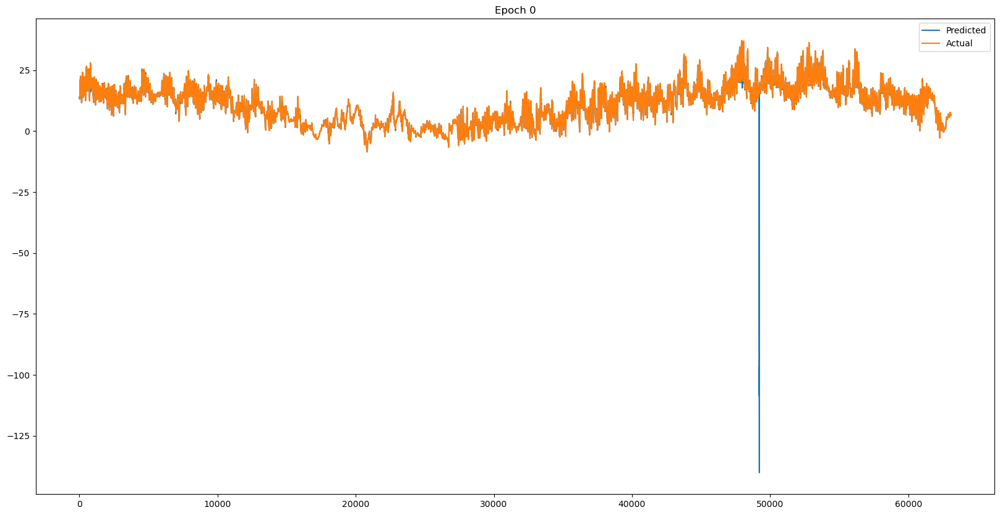

Epoch Time: 213.62s
Epoch 1 | Train RMSE: 0.0053 | Val RMSE: 0.0426
Model saved.
Epoch Time: 210.95s
Epoch 2 | Train RMSE: 0.0046 | Val RMSE: 0.0401
Model saved.
Epoch Time: 210.08s
Epoch 3 | Train RMSE: 0.0043 | Val RMSE: 0.0297
Model saved.
Epoch Time: 210.55s
Epoch 4 | Train RMSE: 0.0042 | Val RMSE: 0.0209
Model saved.
Epoch Time: 210.61s
Epoch 5 | Train RMSE: 0.0123 | Val RMSE: 0.0111
Model saved.
Epoch Time: 210.34s
Epoch 6 | Train RMSE: 0.0044 | Val RMSE: 0.0156
Epoch Time: 210.64s
Epoch 7 | Train RMSE: 0.0043 | Val RMSE: 0.0167
Epoch Time: 210.12s
Epoch 8 | Train RMSE: 0.0041 | Val RMSE: 0.0168
Epoch Time: 210.73s
Epoch 9 | Train RMSE: 0.0040 | Val RMSE: 0.0189
Epoch Time: 211.03s
Epoch 10 | Train RMSE: 0.0039 | Val RMSE: 0.0187
Epoch 10 | MSE: 1.2070 | MAE: 0.1739


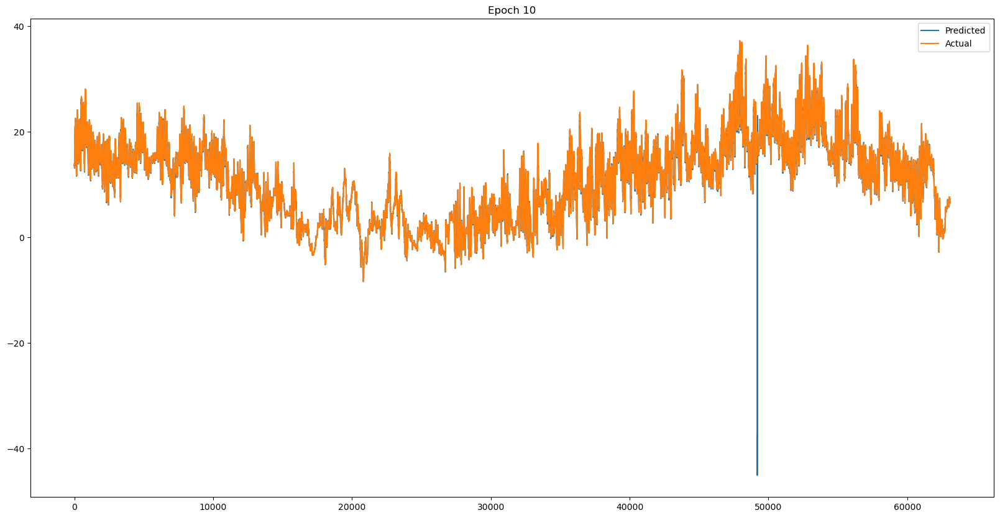

Epoch Time: 220.17s
Epoch 11 | Train RMSE: 0.0038 | Val RMSE: 0.0227
Epoch Time: 213.84s
Epoch 12 | Train RMSE: 0.0038 | Val RMSE: 0.0238
Epoch Time: 214.05s
Epoch 13 | Train RMSE: 0.0037 | Val RMSE: 0.0220
Epoch Time: 213.72s
Epoch 14 | Train RMSE: 0.0037 | Val RMSE: 0.0228
Epoch Time: 213.97s
Epoch 15 | Train RMSE: 0.0037 | Val RMSE: 0.0227
Epoch Time: 213.53s
Epoch 16 | Train RMSE: 0.0037 | Val RMSE: 0.0220
Epoch Time: 213.92s
Epoch 17 | Train RMSE: 0.0037 | Val RMSE: 0.0234
Epoch Time: 213.30s
Epoch 18 | Train RMSE: 0.0037 | Val RMSE: 0.0273
Epoch Time: 213.58s
Epoch 19 | Train RMSE: 0.0036 | Val RMSE: 0.0294
Epoch Time: 224.91s
Epoch 20 | Train RMSE: 0.0036 | Val RMSE: 0.0268
Epoch 20 | MSE: 2.4974 | MAE: 0.1743


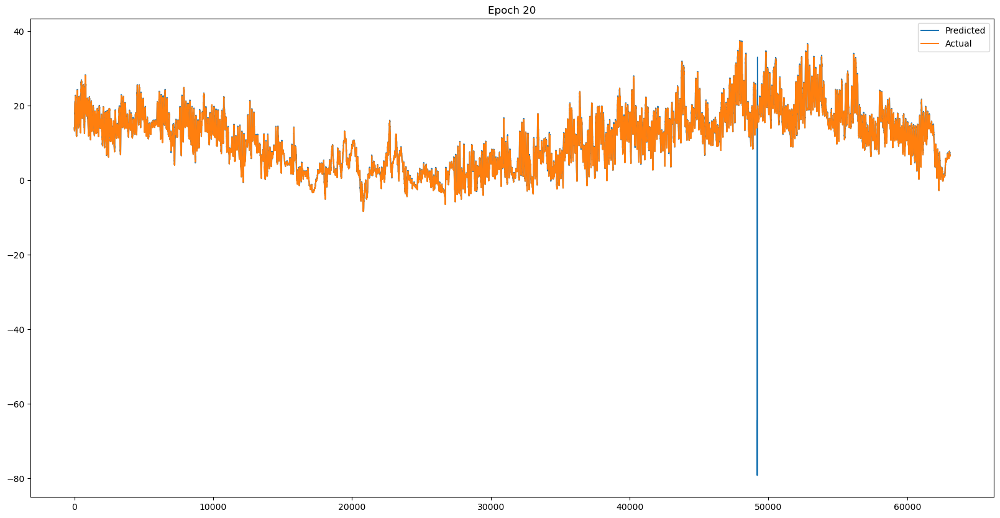

Epoch Time: 248.52s
Epoch 21 | Train RMSE: 0.0036 | Val RMSE: 0.0293
Epoch Time: 250.88s
Epoch 22 | Train RMSE: 0.0036 | Val RMSE: 0.0261
Epoch Time: 251.95s
Epoch 23 | Train RMSE: 0.0036 | Val RMSE: 0.0255
Epoch Time: 252.61s
Epoch 24 | Train RMSE: 0.0036 | Val RMSE: 0.0295
Epoch Time: 252.80s
Epoch 25 | Train RMSE: 0.0036 | Val RMSE: 0.0288
Epoch Time: 252.36s
Epoch 26 | Train RMSE: 0.0036 | Val RMSE: 0.0289
Epoch Time: 248.50s
Epoch 27 | Train RMSE: 0.0036 | Val RMSE: 0.0288
Epoch Time: 251.69s
Epoch 28 | Train RMSE: 0.0036 | Val RMSE: 0.0288
Epoch Time: 251.56s
Epoch 29 | Train RMSE: 0.0036 | Val RMSE: 0.0286
Epoch Time: 253.42s


In [61]:
train_model_single_step(model=model_weather,
    train_loader=train_loader_weather,
    val_loader=val_loader_weather,
    optimizer=opt_weather,
    scheduler=epoch_scheduler_weather,
    loss_fn=torch.nn.MSELoss(),
    num_epochs=30,
    patience=35,
    save_path="weather_lstm.pt",
    device=torch.device('cuda' if torch.cuda.is_available() else 'cpu'),
    y_min=y_train_weather_min,
    y_max=y_train_weather_max,
    X_train_len=len(X_train_t_weather),
    X_val_len=len(X_val_t_weather)
)

In [21]:
model = IMVTensorLSTM(X_train.shape[2], 1, 128).cuda()
opt = torch.optim.Adam(model.parameters(), lr=0.001)

In [22]:
epoch_scheduler = torch.optim.lr_scheduler.StepLR(opt, 20, gamma=0.9)

In [23]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [24]:
import time

Saving...
Iter:  0 train:  0.3529663167592571 val:  0.20962425952546299
Iter time:  2.2502288689138368
mse:  21.26809 mae:  3.76875


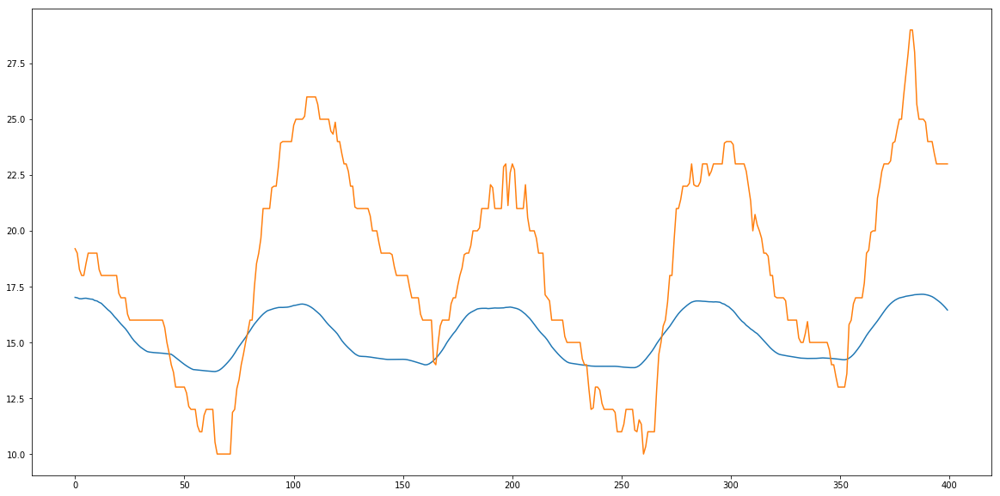

Saving...
Iter:  1 train:  0.16001202725336272 val:  0.109989116066578
Iter time:  0.5924702549818903
Saving...
Iter:  2 train:  0.0956604069334614 val:  0.06989683190268242
Iter time:  0.5817725849337876
Saving...
Iter:  3 train:  0.07374660931215399 val:  0.06898518880178332
Iter time:  0.5256415789481252
Saving...
Iter:  4 train:  0.06876789984030215 val:  0.06474522817329424
Iter time:  0.5104540960164741
Saving...
Iter:  5 train:  0.06552930364176716 val:  0.06092022595958467
Iter time:  0.5061229919083416
Saving...
Iter:  6 train:  0.060131864862682384 val:  0.058725050202740416
Iter time:  0.5068853120319545
Iter:  7 train:  0.05993358412951352 val:  0.06309579736761303
Iter time:  0.5104776960797608
Saving...
Iter:  8 train:  0.05710954844672827 val:  0.054910978797129854
Iter time:  0.5080439769662917
Saving...
Iter:  9 train:  0.05601782792114737 val:  0.05433086208042985
Iter time:  0.5079178030136973
Iter:  10 train:  0.05508695284225307 val:  0.05518791411356255
Iter time:

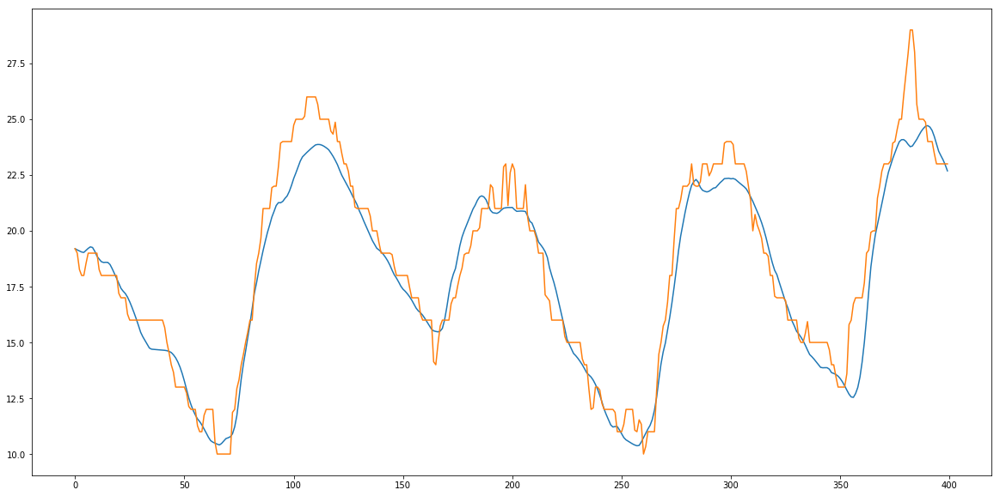

Iter:  11 train:  0.05430830738875859 val:  0.0575527827711598
Iter time:  0.5534310650546104
Iter:  12 train:  0.05546582038258756 val:  0.05600054498682969
Iter time:  0.8297934420406818
Iter:  13 train:  0.055480149407517956 val:  0.061940025878583056
Iter time:  0.6487942049279809
Saving...
Iter:  14 train:  0.05270412651967335 val:  0.05179065454107349
Iter time:  0.5858021579915658
Iter:  15 train:  0.05194661551385583 val:  0.053538530122338585
Iter time:  0.5526300569763407
Saving...
Iter:  16 train:  0.051185401956188765 val:  0.04999225731594566
Iter time:  0.5245612910948694
Iter:  17 train:  0.05026002718453275 val:  0.055755395580875916
Iter time:  0.5157583151012659
Iter:  18 train:  0.05091157464395556 val:  0.052482691378105725
Iter time:  0.5942281759344041
Saving...
Iter:  19 train:  0.04990293235728623 val:  0.04895351008657344
Iter time:  0.5978666000301018
Iter:  20 train:  0.04847280268350497 val:  0.049577491099930426
Iter time:  0.5344833570998162
mse:  1.189637

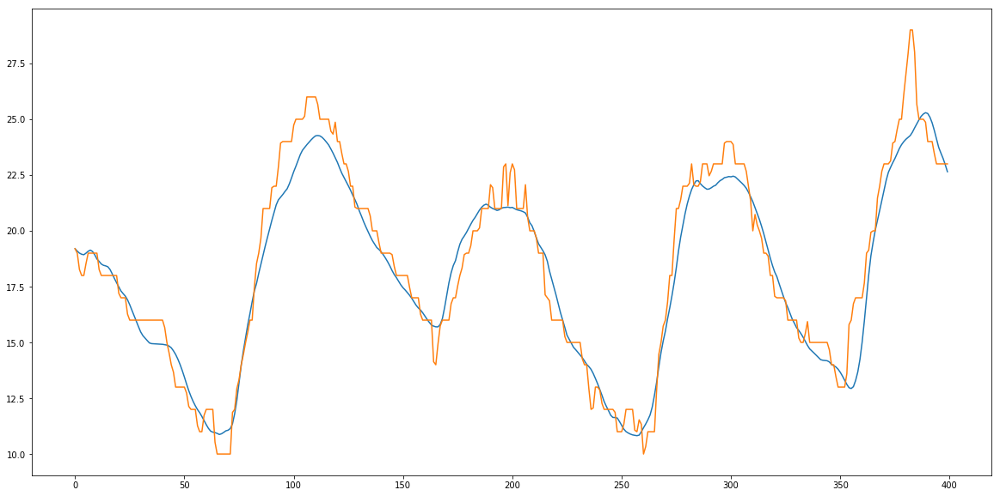

Saving...
Iter:  21 train:  0.04750058507668233 val:  0.04775000255909883
Iter time:  0.5150873869424686
Saving...
Iter:  22 train:  0.049986392059741154 val:  0.046234978293530536
Iter time:  0.5169550409773365
Iter:  23 train:  0.04601851335734379 val:  0.04699088236707918
Iter time:  0.5742479719920084
Iter:  24 train:  0.04622218200064915 val:  0.049525497144556035
Iter time:  0.5929506049724296
Iter:  25 train:  0.046040279407520764 val:  0.051290540659363386
Iter time:  0.5923297179397196
Saving...
Iter:  26 train:  0.044029920701673456 val:  0.044666186231667404
Iter time:  0.6459667489398271
Iter:  27 train:  0.04700581380315194 val:  0.05904070772566926
Iter time:  0.6287249829620123
Iter:  28 train:  0.04477696360317531 val:  0.045569947191406196
Iter time:  0.6479503250448033
Iter:  29 train:  0.043170812831567006 val:  0.04804164268722443
Iter time:  0.5994098669616506
Saving...
Iter:  30 train:  0.041610944802127535 val:  0.04329500661430304
Iter time:  0.5763212960446253


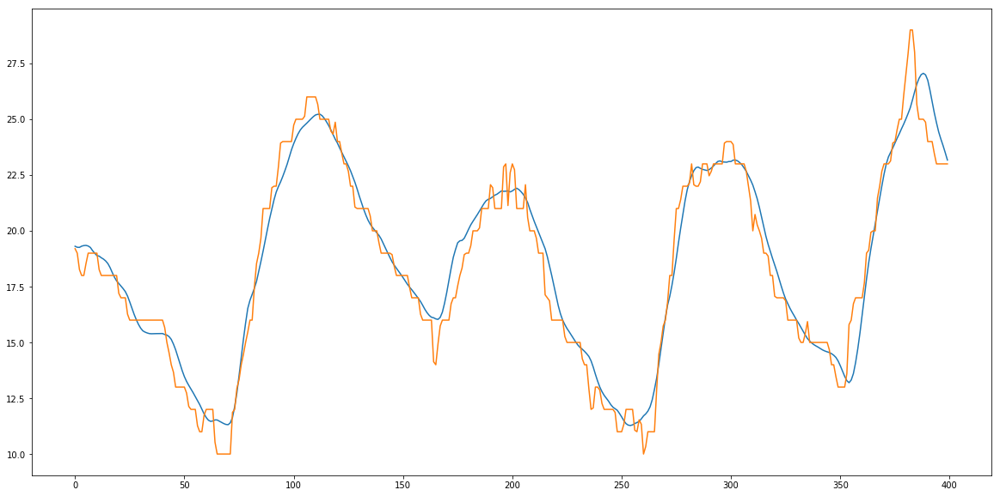

Saving...
Iter:  31 train:  0.0405156334403572 val:  0.041239503027004375
Iter time:  0.5347893070429564
Iter:  32 train:  0.04090771583358302 val:  0.044565788477413305
Iter time:  0.5487507689977065
Saving...
Iter:  33 train:  0.04099934929203217 val:  0.04086423591524755
Iter time:  0.5288770629558712
Iter:  34 train:  0.03972996690561644 val:  0.05342730243600995
Iter time:  0.5421872410224751
Iter:  35 train:  0.041893082428791 val:  0.04405108248117227
Iter time:  0.5493290679296479
Saving...
Iter:  36 train:  0.037550128890688636 val:  0.04075032764578081
Iter time:  0.5284942479338497
Saving...
Iter:  37 train:  0.036588946365791436 val:  0.039556325123622615
Iter time:  0.5214605489745736
Saving...
Iter:  38 train:  0.03892816271542866 val:  0.039470976152485154
Iter time:  0.5604149400023744
Iter:  39 train:  0.03644156619138802 val:  0.040180172566648076
Iter time:  0.5143552580848336
Iter:  40 train:  0.03678416997362005 val:  0.040730504439190046
Iter time:  0.515449931030

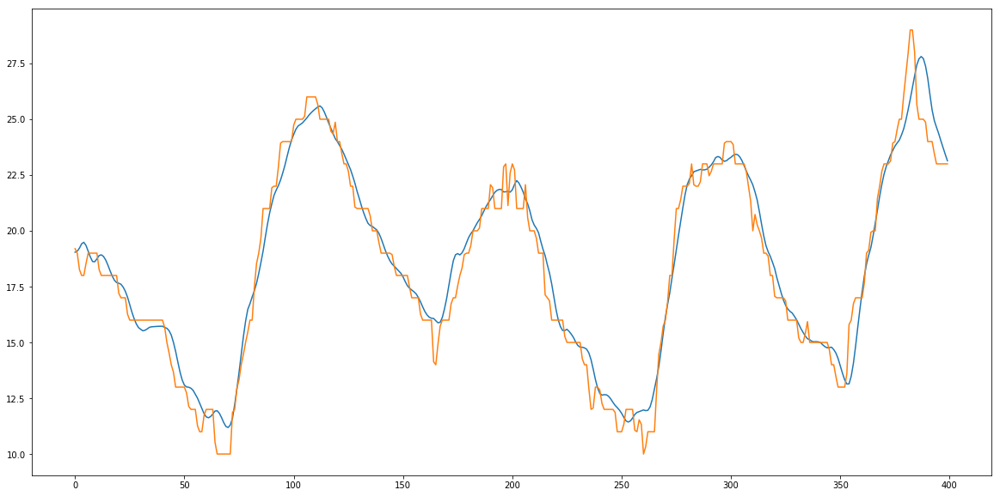

Iter:  41 train:  0.04005106674711525 val:  0.047521386288685935
Iter time:  0.5123993400484324
Saving...
Iter:  42 train:  0.036782452826385134 val:  0.03932817947041404
Iter time:  0.517274699988775
Iter:  43 train:  0.034996273609292916 val:  0.05030340660444381
Iter time:  0.513726438046433
Iter:  44 train:  0.036239140737904046 val:  0.039850396181683505
Iter time:  0.5131713279988617
Iter:  45 train:  0.03400068374084691 val:  0.03936508572360385
Iter time:  0.5148247900651768
Iter:  46 train:  0.03387973059184177 val:  0.039886597893662286
Iter time:  0.5138828449416906
Iter:  47 train:  0.03535878930998431 val:  0.050113581009554875
Iter time:  0.5199873660458252
Iter:  48 train:  0.03609612261962979 val:  0.04598738158585472
Iter time:  0.5140992699889466
Saving...
Iter:  49 train:  0.033321306041933174 val:  0.03912442258402663
Iter time:  0.5186305739916861
Saving...
Iter:  50 train:  0.034555749262465414 val:  0.037325642976281784
Iter time:  0.5192739539779723
mse:  0.6743

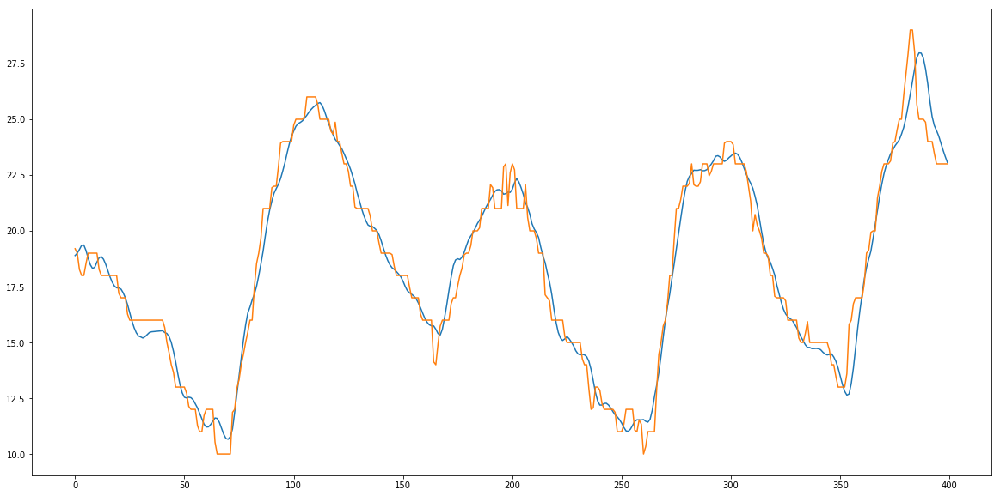

Iter:  51 train:  0.03336727552267956 val:  0.042559564114590276
Iter time:  0.5065066179959103
Iter:  52 train:  0.03583802752289219 val:  0.03754339960192579
Iter time:  0.5091287810355425
Saving...
Iter:  53 train:  0.03403383645780014 val:  0.036662460868475105
Iter time:  0.5683673610910773
Iter:  54 train:  0.0325599442077092 val:  0.03668179453159464
Iter time:  0.5205115529242903
Iter:  55 train:  0.03207984672595663 val:  0.03689555632710558
Iter time:  0.5298377809813246
Iter:  56 train:  0.032744440763835064 val:  0.037580734011674645
Iter time:  0.5333252559648827
Saving...
Iter:  57 train:  0.03536882933447596 val:  0.03593393883475682
Iter time:  0.5391381579684094
Iter:  58 train:  0.03148463969105898 val:  0.0408205917567872
Iter time:  0.5182836360763758
Iter:  59 train:  0.033214179437044244 val:  0.04376869972831577
Iter time:  0.508599465014413
Iter:  60 train:  0.0342065194684073 val:  0.0381631579433449
Iter time:  0.5268889450235292
mse:  0.7049103 mae:  0.641415

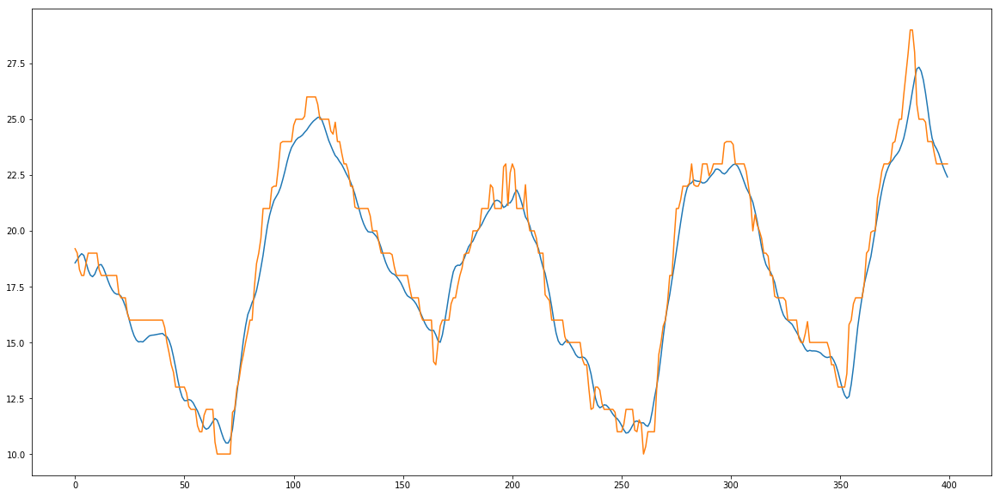

Iter:  61 train:  0.030807349880934837 val:  0.03650382096518917
Iter time:  0.5219788521062583
Saving...
Iter:  62 train:  0.030373602613805686 val:  0.035122286762624355
Iter time:  0.5419816630892456
Iter:  63 train:  0.029923724202292553 val:  0.03593682594289135
Iter time:  0.6225331129971892
Iter:  64 train:  0.029977694769871808 val:  0.03608453979890634
Iter time:  0.6318290960043669
Iter:  65 train:  0.03109500403339265 val:  0.03873111349195352
Iter time:  0.5667121669976041
Iter:  66 train:  0.02999915871101234 val:  0.03563329009902969
Iter time:  0.5109010300366208
Iter:  67 train:  0.03047144243898123 val:  0.03771573486934788
Iter time:  0.510735930991359
Saving...
Iter:  68 train:  0.029155571969829736 val:  0.03429247014297765
Iter time:  0.5191683530574664
Saving...
Iter:  69 train:  0.02907475891507671 val:  0.03391293932151754
Iter time:  0.5158602859592065
Iter:  70 train:  0.03351456711507038 val:  0.034392537038071144
Iter time:  0.5095134190050885
mse:  0.572497

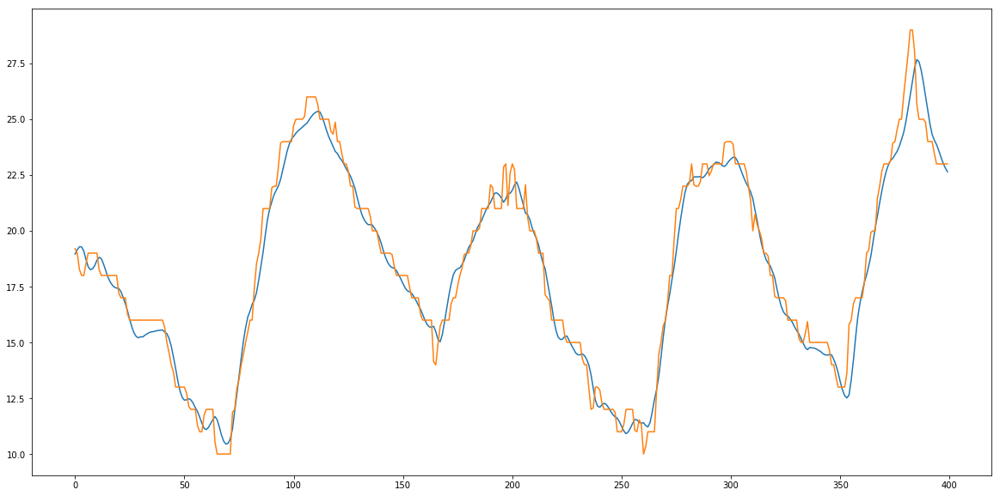

Iter:  71 train:  0.03194464837842328 val:  0.03407311090507099
Iter time:  0.510576004977338
Iter:  72 train:  0.034771105834075465 val:  0.03403193089694621
Iter time:  0.5114520950010046
Saving...
Iter:  73 train:  0.029213452761924302 val:  0.03382743795106861
Iter time:  0.5284737850306556
Iter:  74 train:  0.028963718612708054 val:  0.03454335665029378
Iter time:  0.5131055479869246
Iter:  75 train:  0.029586895205009154 val:  0.03797814275588455
Iter time:  0.5685035019414499
Iter:  76 train:  0.028863928567384522 val:  0.03481272764063018
Iter time:  0.6412903959862888
Iter:  77 train:  0.029939612344863736 val:  0.045686740872851295
Iter time:  0.6429326209472492
Saving...
Iter:  78 train:  0.031023767671638742 val:  0.033213569737361164
Iter time:  0.6134578560013324
Saving...
Iter:  79 train:  0.028831893815192935 val:  0.03306532975217254
Iter time:  0.5962439479772002
Iter:  80 train:  0.028101540201539883 val:  0.03430430175470545
Iter time:  0.6152444060426205
mse:  0.56

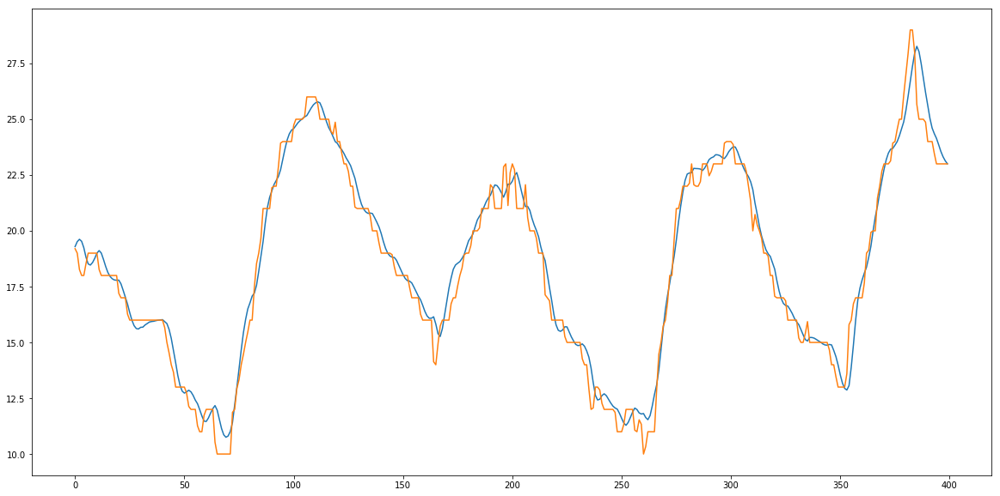

Iter:  81 train:  0.02848985475876366 val:  0.037829205540898865
Iter time:  0.5252928580157459
Saving...
Iter:  82 train:  0.03003757498297751 val:  0.0320290798812858
Iter time:  0.5194082070374861
Iter:  83 train:  0.028517452786018284 val:  0.032296528004866314
Iter time:  0.5109734949655831
Iter:  84 train:  0.027292254546474982 val:  0.03390464720695271
Iter time:  0.5115566159365699
Saving...
Iter:  85 train:  0.0275570934742485 val:  0.03162778679274246
Iter time:  0.5220642450731248
Iter:  86 train:  0.028753984148115384 val:  0.032822357411413726
Iter time:  0.5125243879156187
Iter:  87 train:  0.027360852835311554 val:  0.0349490779602278
Iter time:  0.515611145994626
Iter:  88 train:  0.02761918017795443 val:  0.03311479628376359
Iter time:  0.5169963799417019
Iter:  89 train:  0.03092073181171774 val:  0.03189996295843844
Iter time:  0.5117077910108492
Iter:  90 train:  0.027478900184354307 val:  0.03597714994201526
Iter time:  0.5137106559704989
mse:  0.62646794 mae:  0.6

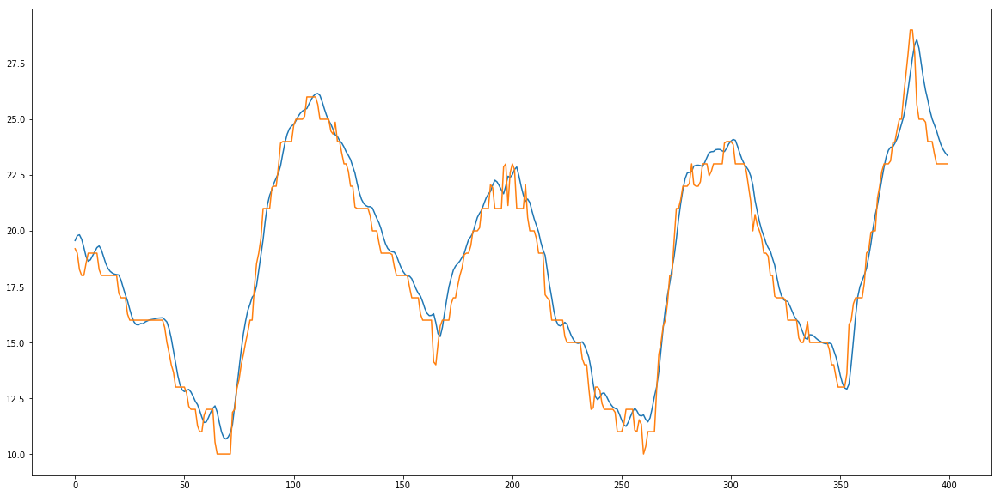

Saving...
Iter:  91 train:  0.026600130667924337 val:  0.030936913617193088
Iter time:  0.5265440749935806
Saving...
Iter:  92 train:  0.026742387188316896 val:  0.03084537061580785
Iter time:  0.5245234169997275
Iter:  93 train:  0.027687126267321043 val:  0.031130602104808364
Iter time:  0.5150954879354686
Iter:  94 train:  0.028968027189353505 val:  0.031525828661982364
Iter time:  0.5124574570218101
Iter:  95 train:  0.026409289236007952 val:  0.03295642475502883
Iter time:  0.514518492971547
Iter:  96 train:  0.026138255161345787 val:  0.03159764396411639
Iter time:  0.5135896750725806
Iter:  97 train:  0.02635490213328146 val:  0.03915529934451389
Iter time:  0.5121252540266141
Iter:  98 train:  0.030053120004704666 val:  0.03129813361624792
Iter time:  0.5124038510257378
Iter:  99 train:  0.027691043217168355 val:  0.033003964566641925
Iter time:  0.5129056089790538
Saving...
Iter:  100 train:  0.027690796608972865 val:  0.03078721019605185
Iter time:  0.5173271659296006
mse:  0

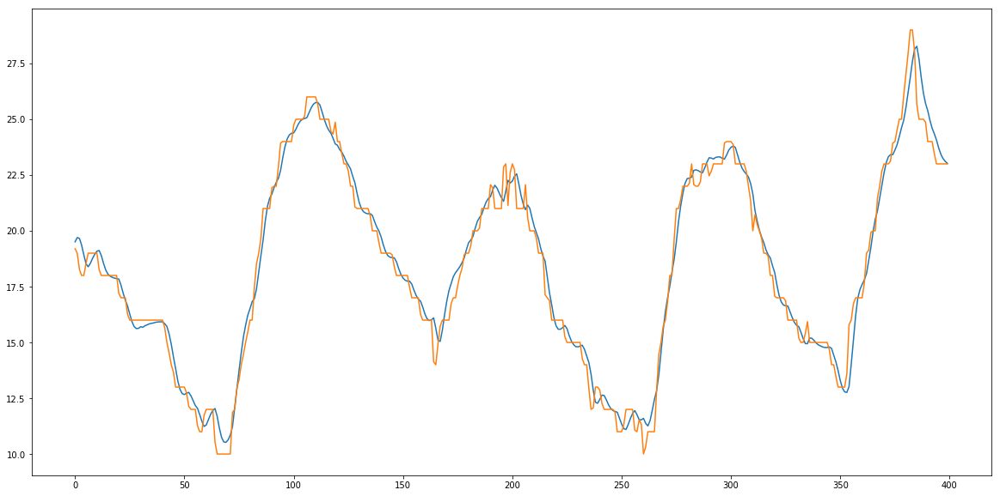

Saving...
Iter:  101 train:  0.025657674030342702 val:  0.03052107783277678
Iter time:  0.5217287390260026
Saving...
Iter:  102 train:  0.025884066491233267 val:  0.03015247342941324
Iter time:  0.5212028209352866
Iter:  103 train:  0.026453829131948138 val:  0.033479071760112326
Iter time:  0.6022008580621332
Iter:  104 train:  0.025192487097884943 val:  0.030157526599467053
Iter time:  0.5543025590013713
Iter:  105 train:  0.025133106362903352 val:  0.030360706583104635
Iter time:  0.6128610869636759
Iter:  106 train:  0.024402643816759953 val:  0.030334282458071748
Iter time:  0.643360628047958
Iter:  107 train:  0.024624410302045773 val:  0.032706791755111965
Iter time:  0.677787401014939
Saving...
Iter:  108 train:  0.025813514079251244 val:  0.029586883906772037
Iter time:  0.5983831840567291
Iter:  109 train:  0.024102123355990743 val:  0.030525931473937565
Iter time:  0.6288425329839811
Saving...
Iter:  110 train:  0.02482408089088262 val:  0.029275692275423152
Iter time:  0.62

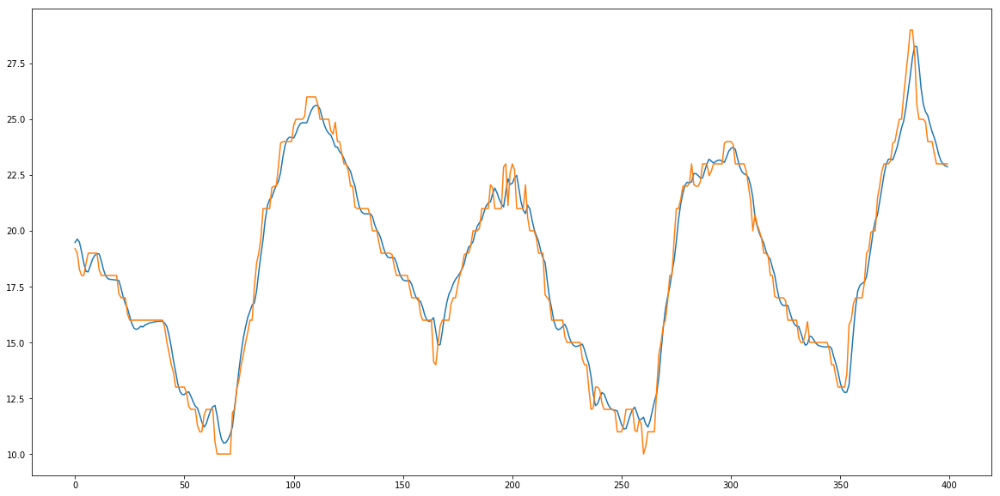

Iter:  111 train:  0.023985809729793636 val:  0.029909224307230947
Iter time:  0.6243746719555929
Iter:  112 train:  0.024210659199529586 val:  0.029344018199109374
Iter time:  0.5964422069955617
Saving...
Iter:  113 train:  0.0239372833059027 val:  0.02847149550068092
Iter time:  0.5809260330861434
Iter:  114 train:  0.02342574114768697 val:  0.029215683648677614
Iter time:  0.6337865020614117
Iter:  115 train:  0.023444790849886397 val:  0.02898232446984888
Iter time:  0.6177672649500892
Iter:  116 train:  0.024306099963359005 val:  0.02850237156256223
Iter time:  0.6236311719985679
Iter:  117 train:  0.024526756970602883 val:  0.03197863134096333
Iter time:  0.5828835970023647
Iter:  118 train:  0.02373322071552551 val:  0.028495973517495662
Iter time:  0.6239366150693968
Saving...
Iter:  119 train:  0.02374210954668806 val:  0.027964438147333633
Iter time:  0.6069848780753091
Saving...
Iter:  120 train:  0.022938142776018834 val:  0.027928440693055646
Iter time:  0.6263782969908789

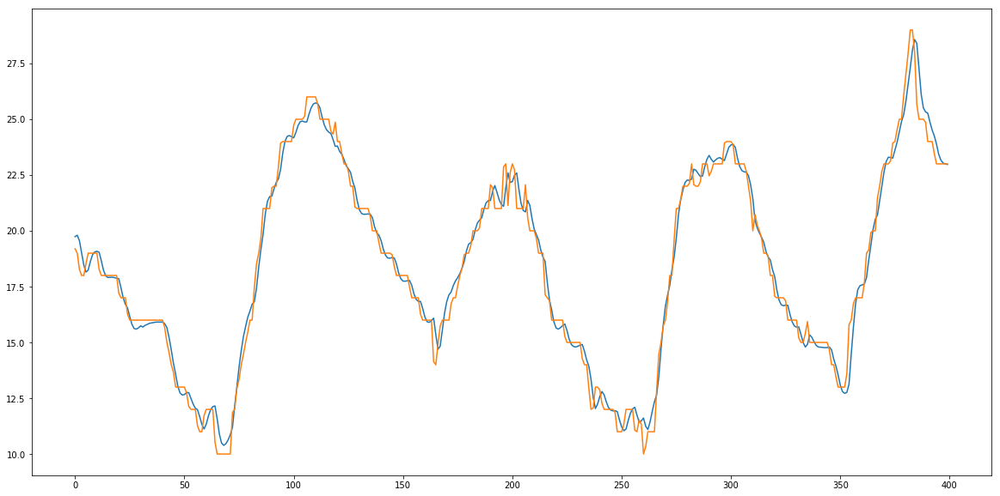

Saving...
Iter:  121 train:  0.025708132557897622 val:  0.027750708746826794
Iter time:  0.624297769041732
Iter:  122 train:  0.024462619987887298 val:  0.03244160129619393
Iter time:  0.6125857159495354
Iter:  123 train:  0.02497159864820648 val:  0.02788007270785464
Iter time:  0.5068266110029072
Iter:  124 train:  0.023860272105658914 val:  0.02897799800565548
Iter time:  0.5117688280297443
Iter:  125 train:  0.02317927924851727 val:  0.030696481982201276
Iter time:  0.5213468800066039
Saving...
Iter:  126 train:  0.022815119904099297 val:  0.02772148665645409
Iter time:  0.5115799710620195
Saving...
Iter:  127 train:  0.023927004937026496 val:  0.0274331942587185
Iter time:  0.5142360960599035
Iter:  128 train:  0.02322825642893809 val:  0.027591794505766955
Iter time:  0.5041766159702092
Saving...
Iter:  129 train:  0.02304502318175194 val:  0.027230089539309055
Iter time:  0.5093143050326034
Iter:  130 train:  0.02326215461779471 val:  0.03148303641983168
Iter time:  0.5048509340

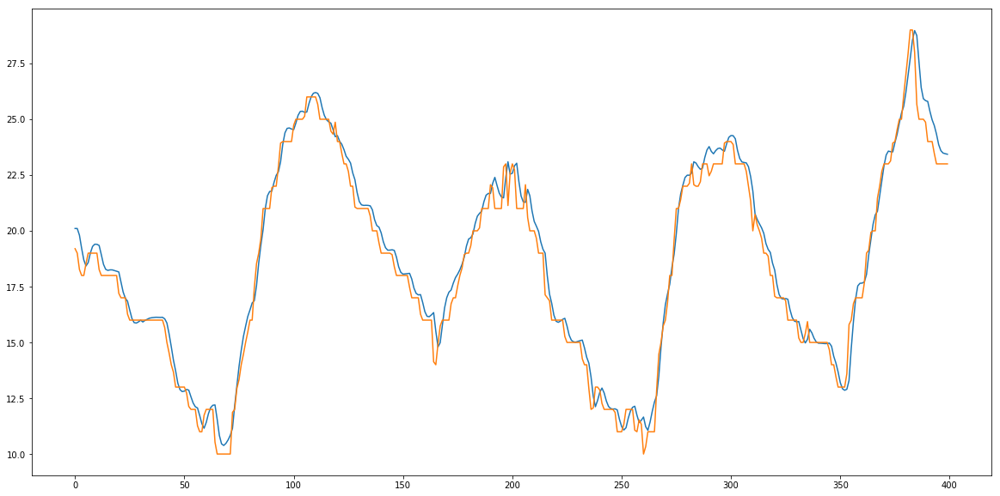

Iter:  131 train:  0.023370986506388976 val:  0.027956629726244315
Iter time:  0.5123409440275282
Iter:  132 train:  0.023024831605967234 val:  0.030359023538303415
Iter time:  0.5139028968987986
Iter:  133 train:  0.025020882522068244 val:  0.029032466935551032
Iter time:  0.525866177980788
Saving...
Iter:  134 train:  0.02240220005611867 val:  0.026943817812264202
Iter time:  0.5223406100412831
Iter:  135 train:  0.022947978897371133 val:  0.029220818979275736
Iter time:  0.5173081490211189
Iter:  136 train:  0.025854944608234037 val:  0.028142434915038837
Iter time:  0.5044069519499317
Iter:  137 train:  0.022902624825681256 val:  0.031196914824202716
Iter time:  0.510089070070535
Iter:  138 train:  0.022551169922555396 val:  0.027753869277478478
Iter time:  0.5068249079631642
Saving...
Iter:  139 train:  0.023730191684030958 val:  0.026640814272915758
Iter time:  0.5103880650131032
Iter:  140 train:  0.021974745510444493 val:  0.026950199548932678
Iter time:  0.5054827480344102
mse

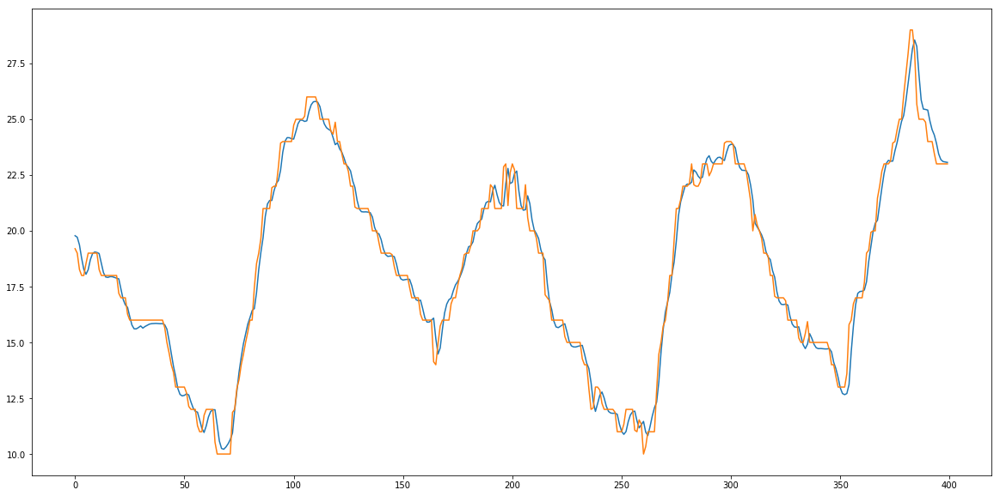

Iter:  141 train:  0.022337410951588095 val:  0.02812518576719605
Iter time:  0.5148821510374546
Saving...
Iter:  142 train:  0.0230150700231817 val:  0.026592379569577055
Iter time:  0.5501068379962817
Iter:  143 train:  0.021736767274315377 val:  0.026978544328696813
Iter time:  0.5290115920361131
Saving...
Iter:  144 train:  0.0216193699448516 val:  0.026522936879463117
Iter time:  0.5238087070174515
Iter:  145 train:  0.021690617976380475 val:  0.029321400549277246
Iter time:  0.5172851179959252
Iter:  146 train:  0.02277922249363217 val:  0.027154622385422284
Iter time:  0.5222231140360236
Iter:  147 train:  0.021957948491858673 val:  0.02680440921216491
Iter time:  0.5382898479001597
Iter:  148 train:  0.02281573069231159 val:  0.027568461741934055
Iter time:  0.5195624479092658
Iter:  149 train:  0.021907980828111264 val:  0.02907540999179434
Iter time:  0.5552674300270155
Saving...
Iter:  150 train:  0.02144493485861365 val:  0.025934993406621608
Iter time:  0.5427268989151344


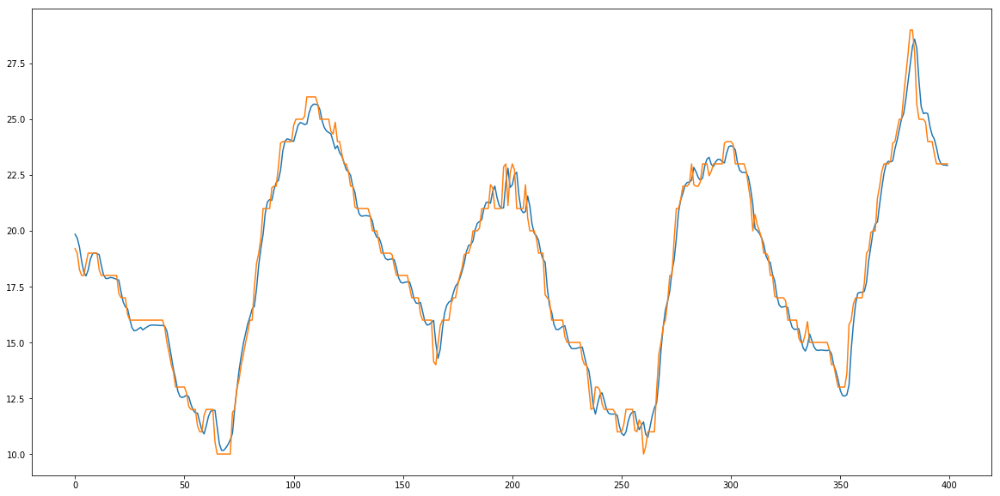

Saving...
Iter:  151 train:  0.021325915962946102 val:  0.025832755215085882
Iter time:  0.522870964021422
Saving...
Iter:  152 train:  0.02139423307768515 val:  0.025782624934119733
Iter time:  0.5298296010587364
Saving...
Iter:  153 train:  0.021654397820390834 val:  0.025658412199583435
Iter time:  0.5204636660637334
Iter:  154 train:  0.02129291285832417 val:  0.026028644454982097
Iter time:  0.5155797930201516
Iter:  155 train:  0.023226611868495776 val:  0.02927956228522083
Iter time:  0.5137352189049125
Iter:  156 train:  0.021918841547759516 val:  0.026266669716671964
Iter time:  0.5212185049895197
Saving...
Iter:  157 train:  0.021450513802997253 val:  0.02562357067709987
Iter time:  0.5195483380230144
Saving...
Iter:  158 train:  0.020825092598582652 val:  0.02554957721866877
Iter time:  0.5204367970582098
Iter:  159 train:  0.022577549379953488 val:  0.027625974345878834
Iter time:  0.5173579660477117
Iter:  160 train:  0.02124198946384025 val:  0.026331483721505067
Iter tim

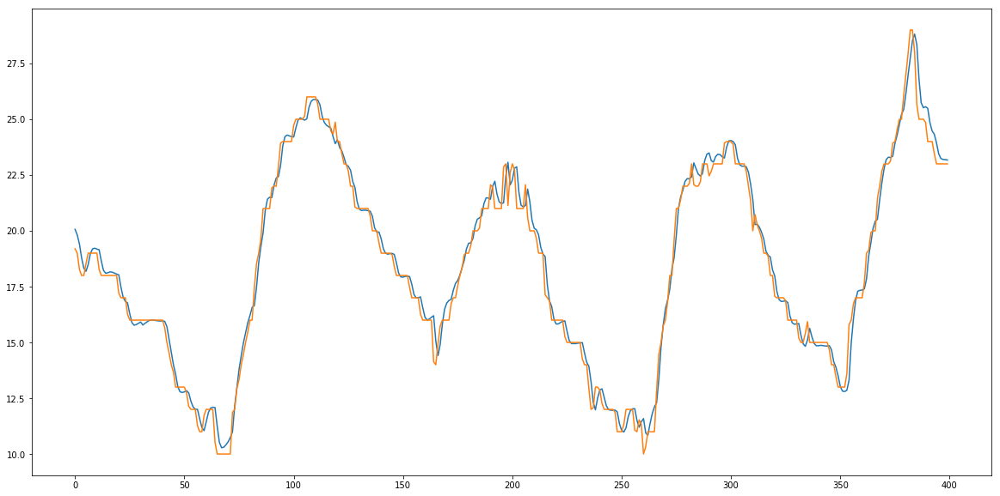

Iter:  161 train:  0.022091356310579457 val:  0.026344934892762205
Iter time:  0.5885638180188835
Iter:  162 train:  0.02119251754035354 val:  0.02620131114733602
Iter time:  0.5227308800676838
Saving...
Iter:  163 train:  0.020592432398187786 val:  0.025355168675357347
Iter time:  0.5383013399550691
Iter:  164 train:  0.020846733940836797 val:  0.025820111026497273
Iter time:  0.5161996110109612
Iter:  165 train:  0.021888764494085937 val:  0.02716526459393453
Iter time:  0.5139281980227679
Iter:  166 train:  0.023443031953420193 val:  0.028328670715276966
Iter time:  0.5683130300603807
Saving...
Iter:  167 train:  0.02259516760824664 val:  0.025335244616139375
Iter time:  0.5599174309754744
Saving...
Iter:  168 train:  0.02070203343141019 val:  0.02527976243619672
Iter time:  0.5262552630156279
Saving...
Iter:  169 train:  0.020357781329871566 val:  0.02502343869052971
Iter time:  0.5373655710136518
Iter:  170 train:  0.02039201646598235 val:  0.02573537918122342
Iter time:  0.516418

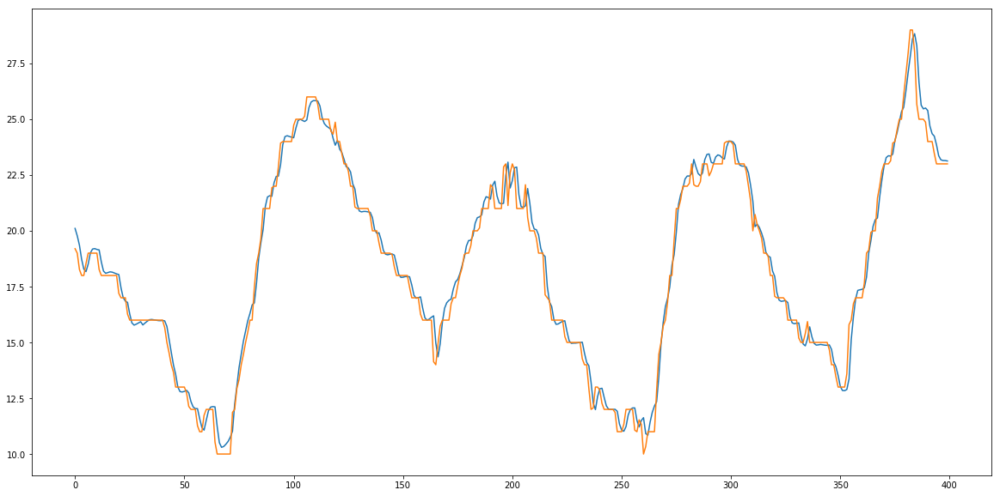

Saving...
Iter:  171 train:  0.02120605745103569 val:  0.024989983854420743
Iter time:  0.5300776249496266
Iter:  172 train:  0.020956374603014544 val:  0.028109890758599907
Iter time:  0.5275037199025974
Saving...
Iter:  173 train:  0.02145943952589884 val:  0.024789601811085582
Iter time:  0.5927468310110271
Iter:  174 train:  0.020362998416290266 val:  0.025255160905364466
Iter time:  0.5456280090147629
Iter:  175 train:  0.02013556936686797 val:  0.025368545358722454
Iter time:  0.5224856700515375
Iter:  176 train:  0.0205181558179052 val:  0.024945785553219375
Iter time:  0.5258221148978919
Iter:  177 train:  0.02143149882758551 val:  0.02500824661885086
Iter time:  0.5210640359437093
Saving...
Iter:  178 train:  0.020581518840788886 val:  0.024710775363075425
Iter time:  0.5549432460684329
Iter:  179 train:  0.01994350223022305 val:  0.02481444187681986
Iter time:  0.5768258839379996
Saving...
Iter:  180 train:  0.019850127169764153 val:  0.024424125314190987
Iter time:  0.605526

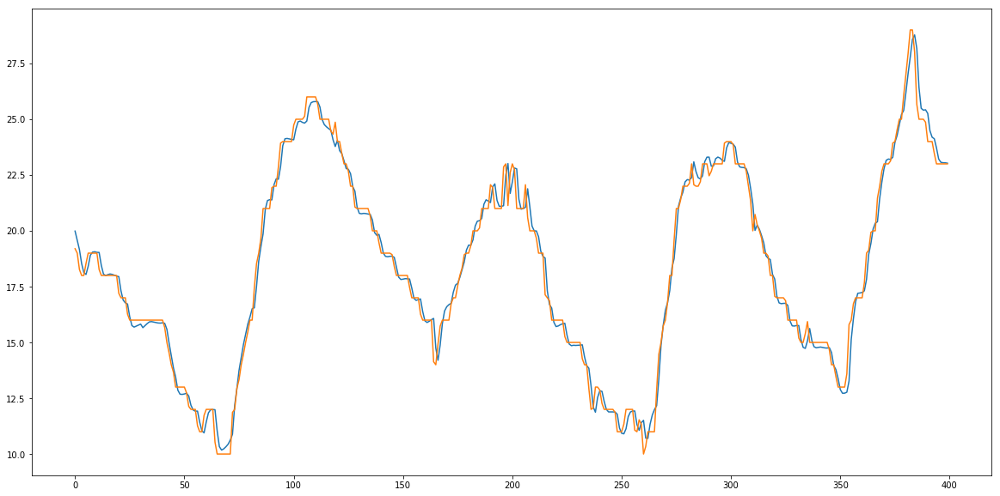

Iter:  181 train:  0.020118066940651186 val:  0.02535843606116706
Iter time:  0.6107260400895029
Iter:  182 train:  0.020331988706618884 val:  0.02600007722758896
Iter time:  0.6001769240247086
Saving...
Iter:  183 train:  0.02042627493892377 val:  0.024352525213509703
Iter time:  0.5298445300431922
Saving...
Iter:  184 train:  0.020056276773932607 val:  0.02424653539813088
Iter time:  0.5222219759598374
Saving...
Iter:  185 train:  0.020018186246603634 val:  0.024127738631968817
Iter time:  0.5176712239626795
Iter:  186 train:  0.02007849831889742 val:  0.024246932559885935
Iter time:  0.5147801809944212
Iter:  187 train:  0.019961390469915293 val:  0.02423696236937559
Iter time:  0.5190618899650872
Iter:  188 train:  0.01960806451800084 val:  0.024640658151499063
Iter time:  0.5122706759721041
Iter:  189 train:  0.01973248813165836 val:  0.026635339735646316
Iter time:  0.511750261997804
Iter:  190 train:  0.02301471464855552 val:  0.025529110204553954
Iter time:  0.5118160869460553


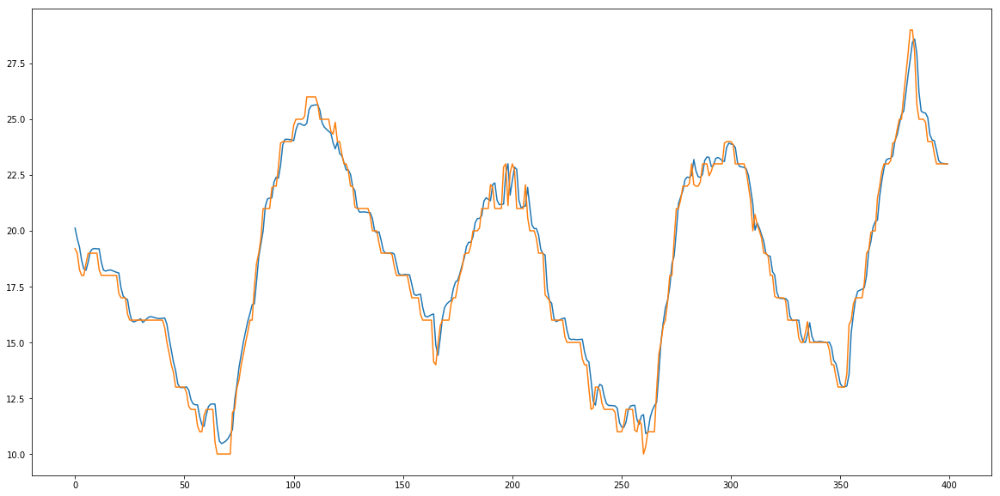

Iter:  191 train:  0.021210991194410358 val:  0.02679629065262955
Iter time:  0.5131955910474062
Iter:  192 train:  0.02026518014662036 val:  0.024656466715643522
Iter time:  0.5151581399841234
Saving...
Iter:  193 train:  0.019383047404366482 val:  0.023913488149366353
Iter time:  0.5189370330190286
Saving...
Iter:  194 train:  0.019608492260575476 val:  0.023908280862146306
Iter time:  0.5369755669962615
Iter:  195 train:  0.019076104648530164 val:  0.024151772321887973
Iter time:  0.699065905995667
Iter:  196 train:  0.02073886851483806 val:  0.02846097363148484
Iter time:  0.5217553849797696
Iter:  197 train:  0.022477140313467005 val:  0.02536411368518168
Iter time:  0.5613307749154046
Iter:  198 train:  0.021166110707616443 val:  0.024927116301795456
Iter time:  0.6597863499773666
Iter:  199 train:  0.020294251959841594 val:  0.024403653357692942
Iter time:  0.5714570039417595
Iter:  200 train:  0.019977946516800286 val:  0.025304378141795245
Iter time:  0.6105426590656862
mse:  

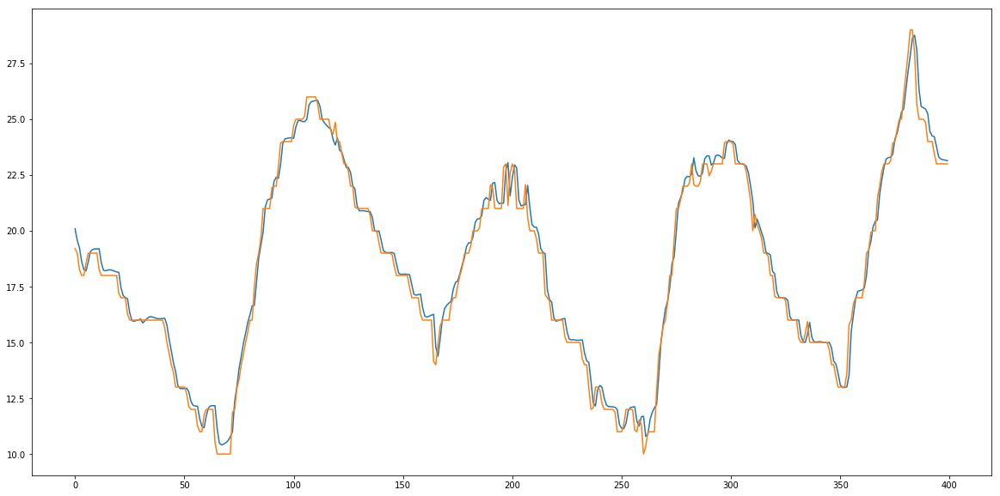

Saving...
Iter:  201 train:  0.01913259079709819 val:  0.02378275207780396
Iter time:  0.6744796970160678
Saving...
Iter:  202 train:  0.019188415369800742 val:  0.023757875573508256
Iter time:  0.6210879469290376
Saving...
Iter:  203 train:  0.019507069314537193 val:  0.023629347590554607
Iter time:  0.6155822799773887
Iter:  204 train:  0.01902800386943707 val:  0.026393861744425862
Iter time:  0.5845752679742873
Iter:  205 train:  0.01925118545452935 val:  0.024354890450936247
Iter time:  0.6108298189938068
Iter:  206 train:  0.019397277771243535 val:  0.02722742417797226
Iter time:  0.5737155249807984
Iter:  207 train:  0.020547523375175805 val:  0.026097593741791002
Iter time:  0.5068028440000489
Iter:  208 train:  0.020451292257623953 val:  0.0240685700467941
Iter time:  0.5590585559839383
Saving...
Iter:  209 train:  0.01993304056966331 val:  0.02357830083770735
Iter time:  0.6130088899517432
Saving...
Iter:  210 train:  0.019290249223622925 val:  0.02351941743872906
Iter time: 

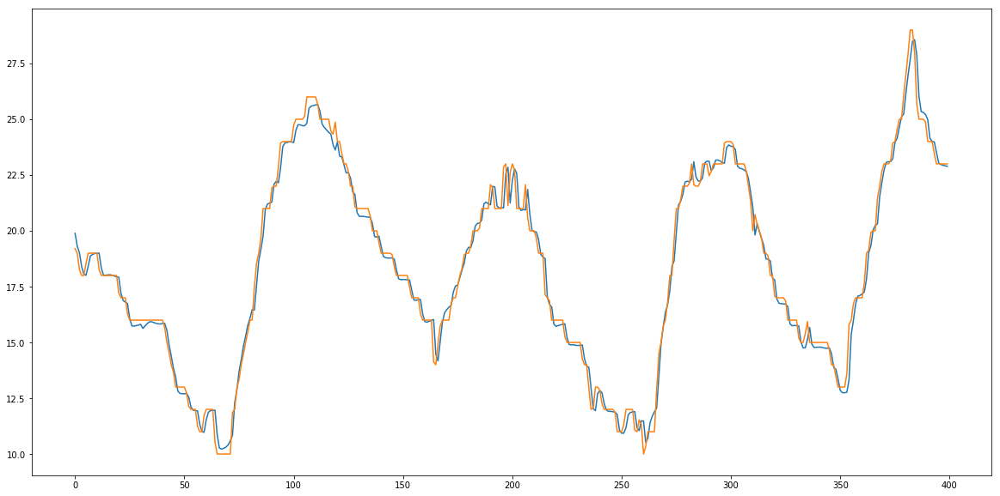

Iter:  211 train:  0.01910932988891305 val:  0.024979260669319735
Iter time:  0.6198450310621411
Iter:  212 train:  0.01950393319880701 val:  0.023701413934930957
Iter time:  0.5391681509790942
Iter:  213 train:  0.020044414908948652 val:  0.025905066843863157
Iter time:  0.5341602480039
Iter:  214 train:  0.01940472191284001 val:  0.025087827351654792
Iter time:  0.5248802420683205
Iter:  215 train:  0.02011278925143205 val:  0.02414139721308159
Iter time:  0.6212059090612456
Iter:  216 train:  0.019242714892741285 val:  0.023785574826488506
Iter time:  0.5917942969826981
Iter:  217 train:  0.01931533810926092 val:  0.02491841727780159
Iter time:  0.5949107740307227
Iter:  218 train:  0.019155817446831154 val:  0.025664899780094647
Iter time:  0.5933916759677231
Saving...
Iter:  219 train:  0.018653586681496956 val:  0.023251813810428623
Iter time:  0.580245511024259
Iter:  220 train:  0.018979459898618545 val:  0.023429740425923305
Iter time:  0.6419730499619618
mse:  0.26569304 mae:

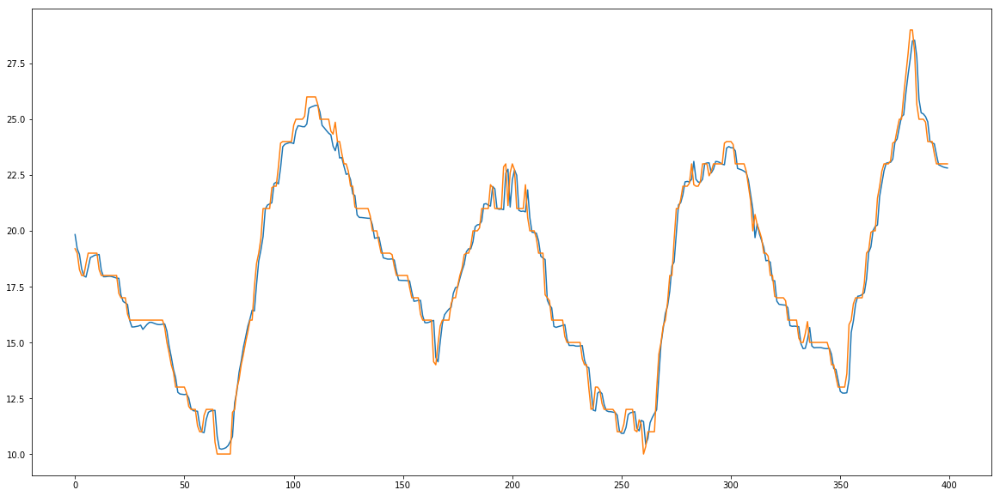

Iter:  221 train:  0.018712314447029404 val:  0.02442475008682945
Iter time:  0.5302750759292394
Iter:  222 train:  0.01922705129570299 val:  0.02384255594681277
Iter time:  0.5199725719867274
Iter:  223 train:  0.01902881558957606 val:  0.02448251511959644
Iter time:  0.5598191929748282
Iter:  224 train:  0.019530841475401375 val:  0.023341568130972788
Iter time:  0.610512075945735
Iter:  225 train:  0.018862703669987078 val:  0.024920293752588016
Iter time:  0.6011493490077555
Iter:  226 train:  0.018966906494297348 val:  0.02405858715170008
Iter time:  0.6161739340750501
Iter:  227 train:  0.01899584703935746 val:  0.026486071645494765
Iter time:  0.6100159219931811
Iter:  228 train:  0.020325075249078988 val:  0.023293531030102163
Iter time:  0.5204111229395494
Saving...
Iter:  229 train:  0.01887371096736954 val:  0.023135527336169935
Iter time:  0.5104164520744234
Saving...
Iter:  230 train:  0.01938126638369028 val:  0.02302027941791848
Iter time:  0.5088782469974831
mse:  0.256

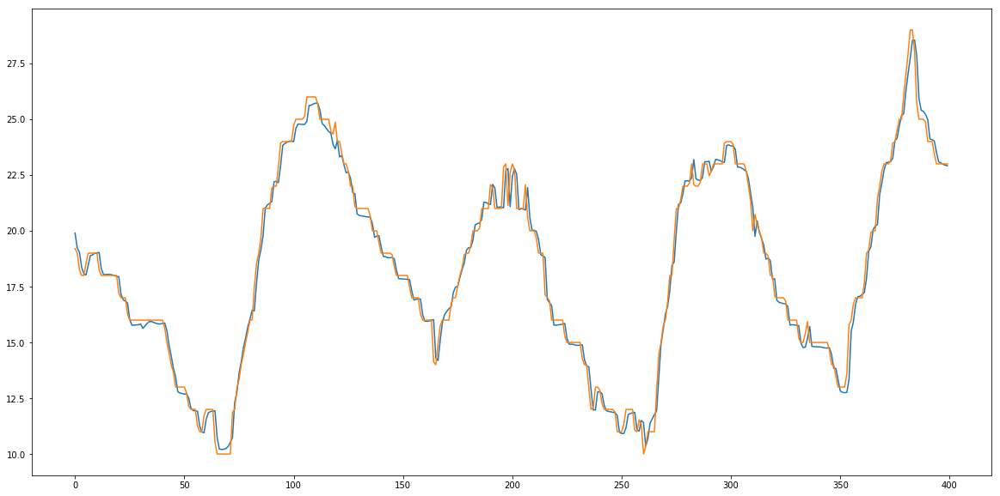

Iter:  231 train:  0.01848857984508513 val:  0.023954308591162075
Iter time:  0.5104817179962993
Iter:  232 train:  0.019390132770062376 val:  0.02311530148666045
Iter time:  0.5021387779852375
Iter:  233 train:  0.019022547721415352 val:  0.025345639486909814
Iter time:  0.5587637020507827
Iter:  234 train:  0.019283883947697554 val:  0.02321516989100624
Iter time:  0.524071542895399
Iter:  235 train:  0.020188854450890564 val:  0.02313033948451117
Iter time:  0.5480047080200166
Iter:  236 train:  0.018414990432098828 val:  0.023445818438150825
Iter time:  0.512917748070322
Iter:  237 train:  0.01907888733051321 val:  0.0231703041329389
Iter time:  0.579043984063901
Iter:  238 train:  0.018672484625977606 val:  0.023446554828961404
Iter time:  0.5395174749428406
Iter:  239 train:  0.01960350717442762 val:  0.02450407752584239
Iter time:  0.5192737799370661
Iter:  240 train:  0.018774871863236748 val:  0.02399435711042209
Iter time:  0.5190797430695966
mse:  0.27865285 mae:  0.3933404


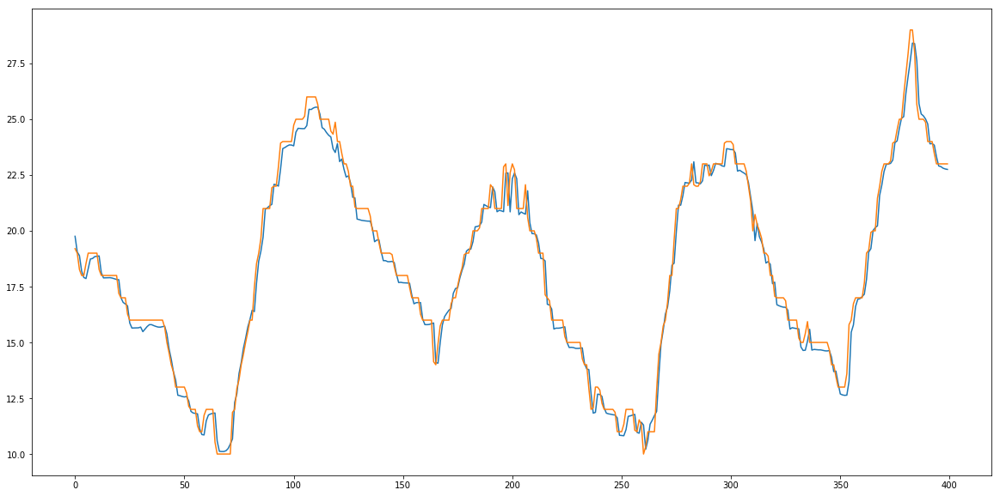

Saving...
Iter:  241 train:  0.01891522698997962 val:  0.0229834984363255
Iter time:  0.6232176809571683
Iter:  242 train:  0.019716453344125917 val:  0.02740508468056438
Iter time:  0.5969111690064892
Iter:  243 train:  0.01998120816378478 val:  0.0252180215235202
Iter time:  0.6166096930392087
Iter:  244 train:  0.018925582940293204 val:  0.023160427304401383
Iter time:  0.6106235620100051
Saving...
Iter:  245 train:  0.0189101914652869 val:  0.02291657794814204
Iter time:  0.6155964860226959
Iter:  246 train:  0.018226520400806488 val:  0.02306913698846419
Iter time:  0.6004249899415299
Iter:  247 train:  0.018318957512797808 val:  0.023660812558869097
Iter time:  0.6032094429247081
Iter:  248 train:  0.01860474714371812 val:  0.02388484791161218
Iter time:  0.5991323529742658
Iter:  249 train:  0.01867442125671589 val:  0.023875543537150455
Iter time:  0.5961622189497575
Iter:  250 train:  0.018394869396609614 val:  0.023381003394912964
Iter time:  0.6437569280387834
mse:  0.264588

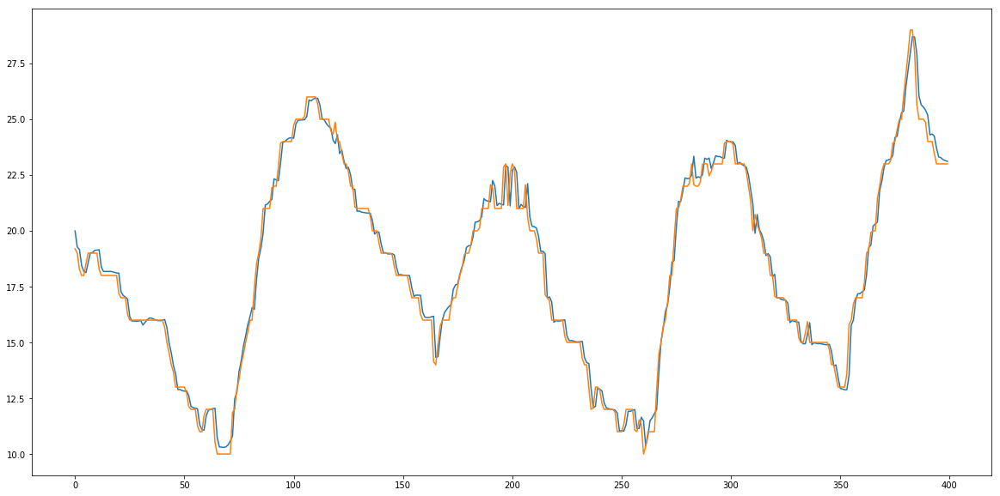

Iter:  251 train:  0.018461888744325687 val:  0.022961378122834917
Iter time:  0.6211598539957777
Iter:  252 train:  0.018367644615259436 val:  0.024424208154204135
Iter time:  0.6998499039327726
Saving...
Iter:  253 train:  0.018244473873847998 val:  0.02270565816692108
Iter time:  0.5803364539751783
Iter:  254 train:  0.018324829896752434 val:  0.023811292419092047
Iter time:  0.6018223760183901
Iter:  255 train:  0.018728772967051888 val:  0.023777899466074934
Iter time:  0.5112693589180708
Iter:  256 train:  0.018247709074083844 val:  0.023759733069523382
Iter time:  0.5109571419889107
Iter:  257 train:  0.0189307160425027 val:  0.022886195185438524
Iter time:  0.511556759942323
Saving...
Iter:  258 train:  0.017918367311325123 val:  0.022703272634933276
Iter time:  0.5166980709182099
Iter:  259 train:  0.018304765658139325 val:  0.02271505654424771
Iter time:  0.6054458650760353
Iter:  260 train:  0.019038496243297474 val:  0.02461793344837505
Iter time:  0.5314290979877114
mse:  

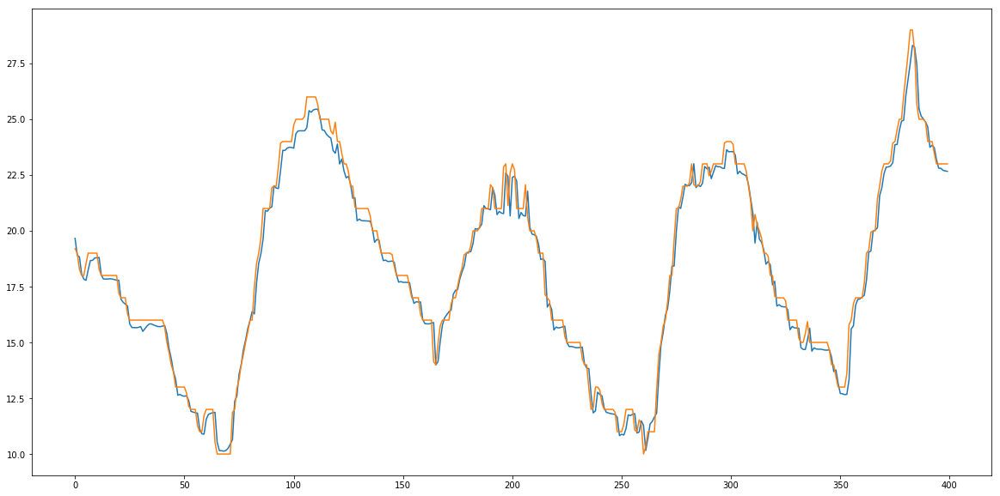

Iter:  261 train:  0.017982949527343764 val:  0.02270487498120727
Iter time:  0.5052465329645202
Iter:  262 train:  0.01841450457638829 val:  0.025050242794905586
Iter time:  0.516275633010082
Iter:  263 train:  0.01868376280745201 val:  0.024568255212148903
Iter time:  0.5190024649491534
Iter:  264 train:  0.01858020664007037 val:  0.02512767407650249
Iter time:  0.5165806929580867
Iter:  265 train:  0.01851705707186412 val:  0.023214495113546462
Iter time:  0.6726157299708575
Iter:  266 train:  0.018296442874271786 val:  0.02287695627140039
Iter time:  0.5615385900018737
Iter:  267 train:  0.01823480012945962 val:  0.02283555982520805
Iter time:  0.5902509089792147
Iter:  268 train:  0.018512610066957036 val:  0.023814472113537374
Iter time:  0.5827184389345348
Iter:  269 train:  0.018953173255187118 val:  0.02349286860720921
Iter time:  0.5190829259809107
Iter:  270 train:  0.01838539749556165 val:  0.023542945708476707
Iter time:  0.5071790469810367
mse:  0.2682668 mae:  0.3623378


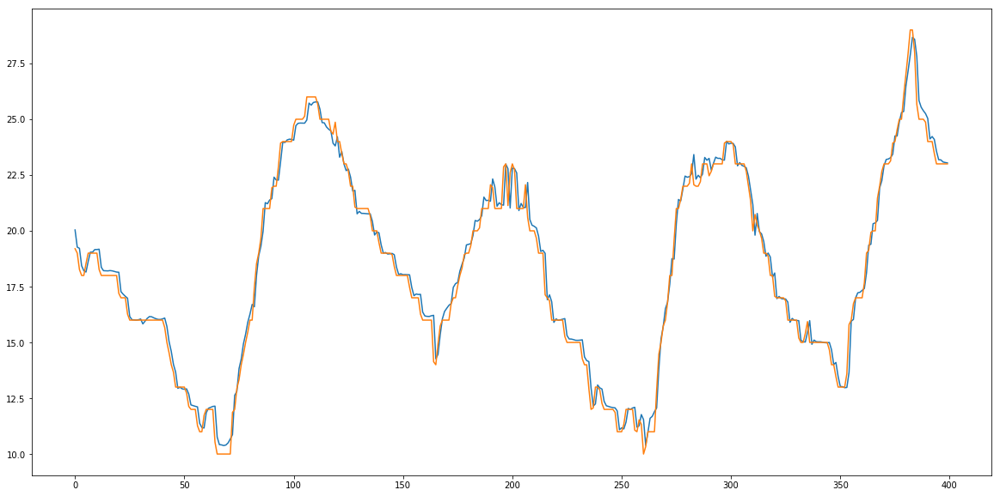

Iter:  271 train:  0.018665338160862764 val:  0.022883470685843555
Iter time:  0.5328675080090761
Iter:  272 train:  0.018280346694085736 val:  0.022805265657807102
Iter time:  0.5193712300388142
Iter:  273 train:  0.01865627180389294 val:  0.022712528841842636
Iter time:  0.5561226040590554
Iter:  274 train:  0.018094847741171104 val:  0.022948392082097206
Iter time:  0.5585265699774027
Iter:  275 train:  0.018141291428513923 val:  0.023672573870864293
Iter time:  0.5152216949500144
Iter:  276 train:  0.018236746763700035 val:  0.023127353204546702
Iter time:  0.5097365010296926
Iter:  277 train:  0.017850573762828354 val:  0.022736565588418953
Iter time:  0.5220396789954975
Iter:  278 train:  0.017906194256562407 val:  0.023344430263324858
Iter time:  0.513665794976987
Saving...
Iter:  279 train:  0.01784161586978451 val:  0.022526893284948765
Iter time:  0.5139029499841854
Iter:  280 train:  0.017994773468934907 val:  0.023730993019796157
Iter time:  0.5171401799889281
mse:  0.27256

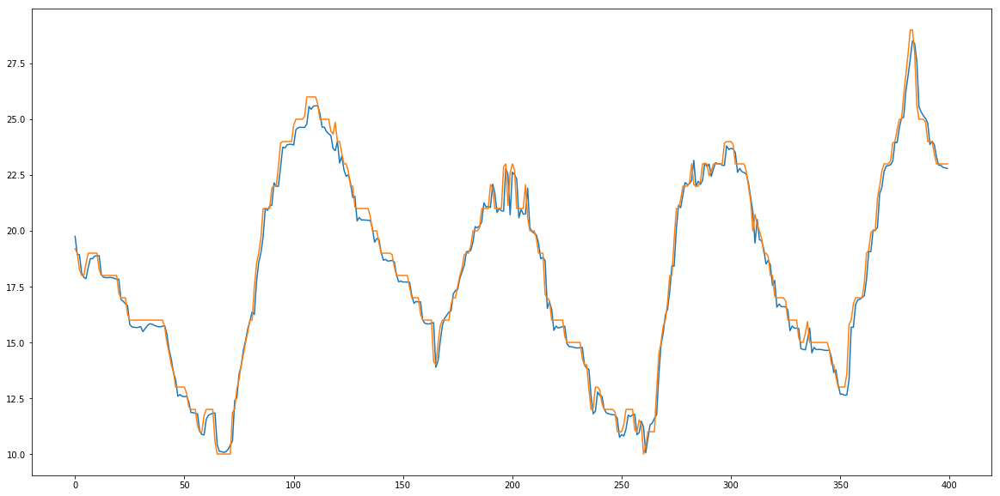

Iter:  281 train:  0.018211627895295755 val:  0.022678070412809677
Iter time:  0.5295798799488693
Iter:  282 train:  0.018662080312384078 val:  0.025441725276145723
Iter time:  0.5042261539492756
Iter:  283 train:  0.018042304587329226 val:  0.022551181017049556
Iter time:  0.5059894489822909
Iter:  284 train:  0.018688663891288423 val:  0.025802793586766393
Iter time:  0.5118051660247147
Iter:  285 train:  0.018663452511261242 val:  0.022746786448481507
Iter time:  0.5054004919948056
Iter:  286 train:  0.017911203155004895 val:  0.0237559713778764
Iter time:  0.513862430001609
Iter:  287 train:  0.01770101314709751 val:  0.022695671101689997
Iter time:  0.5156427080510184
Iter:  288 train:  0.017746355900692047 val:  0.023419657064526152
Iter time:  0.5131547329947352
Iter:  289 train:  0.01784847047359738 val:  0.022707685813053005
Iter time:  0.5117124189855531
Iter:  290 train:  0.017814703840425414 val:  0.022969999999056887
Iter time:  0.5128932860679924
mse:  0.25536847 mae:  0.

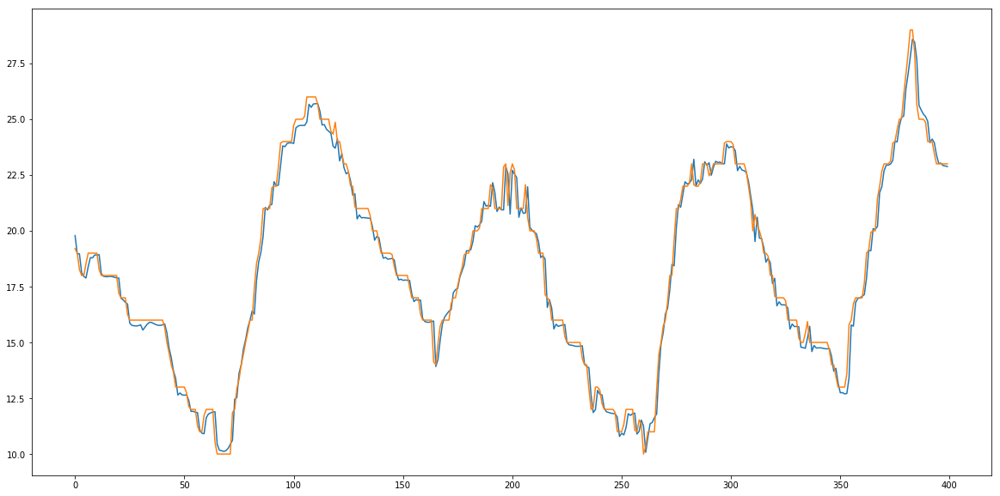

Iter:  291 train:  0.01788038878085813 val:  0.023249113579597462
Iter time:  0.5332735239062458
Iter:  292 train:  0.01792741092890582 val:  0.02270912944376296
Iter time:  0.5324367220746353
Iter:  293 train:  0.018285672685611296 val:  0.024959219047332126
Iter time:  0.5287338549969718
Iter:  294 train:  0.01811874578203093 val:  0.022642374002896724
Iter time:  0.518092320067808
Iter:  295 train:  0.017679361182300814 val:  0.0225891502893334
Iter time:  0.5215818489668891
Iter:  296 train:  0.01818244194143488 val:  0.02588484192199907
Iter time:  0.518693835940212
Iter:  297 train:  0.01782978487427547 val:  0.022563059063507574
Iter time:  0.518669243901968
Iter:  298 train:  0.018360502651834386 val:  0.022840223800487888
Iter time:  0.5283401580527425
Iter:  299 train:  0.017906131182241908 val:  0.022694470275871324
Iter time:  0.5275581510504708
Iter:  300 train:  0.017674966551183023 val:  0.02267111504356993
Iter time:  0.5264216519426554
mse:  0.24876599 mae:  0.34014466

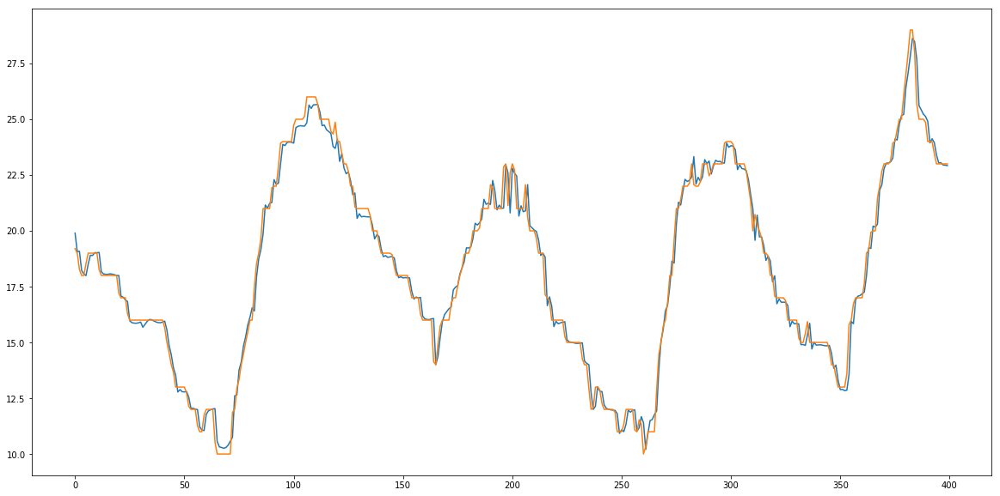

Iter:  301 train:  0.017709623587461462 val:  0.022679410290017687
Iter time:  0.5437987250043079
Iter:  302 train:  0.01794866992111099 val:  0.022849155466351606
Iter time:  0.5198581570293754
Iter:  303 train:  0.017958867225302648 val:  0.022794944619111943
Iter time:  0.5199837549589574
Iter:  304 train:  0.019155567868220195 val:  0.022758285823398797
Iter time:  0.5611347199883312
Iter:  305 train:  0.01840263235870858 val:  0.024316665014169368
Iter time:  0.6234204090433195
Iter:  306 train:  0.01832107680183919 val:  0.02326535234570138
Iter time:  0.6036715570371598
Iter:  307 train:  0.01797066296486099 val:  0.022842918395373064
Iter time:  0.5776674670632929
Iter:  308 train:  0.01754923212246904 val:  0.023140094277457137
Iter time:  0.5934036729158834
Iter:  309 train:  0.017662600095674604 val:  0.02271349878954228
Iter time:  0.5459902420407161
Iter:  310 train:  0.017876990472562138 val:  0.022627528149966658
Iter time:  0.5858216980705038
mse:  0.24781036 mae:  0.34

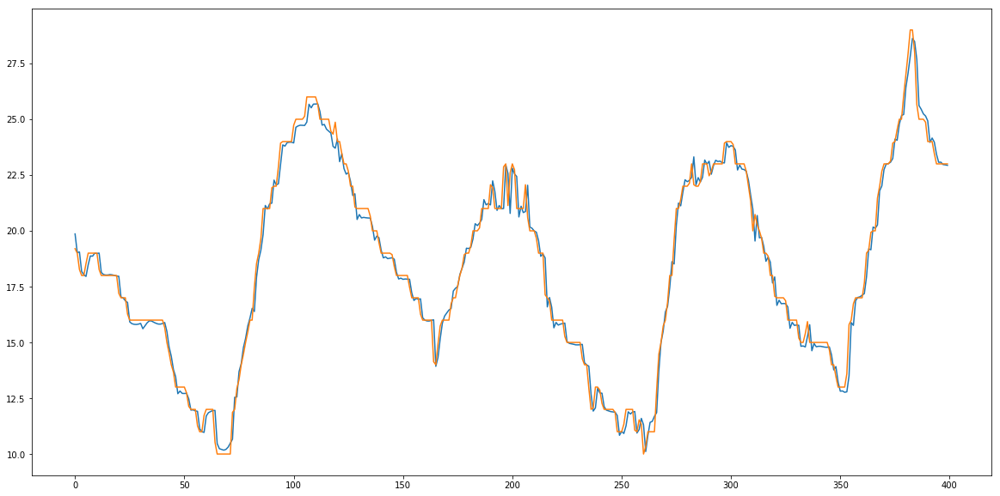

Iter:  311 train:  0.017684139704684857 val:  0.02265971482025655
Iter time:  0.5291444070171565
Iter:  312 train:  0.017725637272077575 val:  0.022745472957853275
Iter time:  0.5186807269928977
Iter:  313 train:  0.017810595259213198 val:  0.02268507409516556
Iter time:  0.5397398640634492


In [25]:
epochs = 1000
loss = nn.MSELoss()
patience = 35
min_val_loss = 9999
counter = 0
for i in range(epochs):
    mse_train = 0
    iteration_start = time.monotonic()
    for batch_x, batch_y in train_loader :
        batch_x = batch_x.cuda()
        batch_y = batch_y.cuda()
        opt.zero_grad()
        y_pred, alphas, betas = model(batch_x)
        y_pred = y_pred.squeeze(1)
        l = loss(y_pred, batch_y)
        l.backward()
        mse_train += l.item()*batch_x.shape[0]
        opt.step()
    epoch_scheduler.step()
    with torch.no_grad():
        mse_val = 0
        preds = []
        true = []
        for batch_x, batch_y in val_loader:
            batch_x = batch_x.cuda()
            batch_y = batch_y.cuda()
            output, alphas, betas = model(batch_x)
            output = output.squeeze(1)
            preds.append(output.detach().cpu().numpy())
            true.append(batch_y.detach().cpu().numpy())
            mse_val += loss(output, batch_y).item()*batch_x.shape[0]
    preds = np.concatenate(preds)
    true = np.concatenate(true)
    
    if min_val_loss > mse_val**0.5:
        min_val_loss = mse_val**0.5
        print("Saving...")
        torch.save(model.state_dict(), "imv_lstm_sml2010.pt")
        counter = 0
    else: 
        counter += 1
    
    if counter == patience:
        break
    print("Iter: ", i, "train: ", (mse_train/len(X_train_t))**0.5, "val: ", (mse_val/len(X_val_t))**0.5)
    iteration_end = time.monotonic()
    print("Iter time: ", iteration_end - iteration_start)
    if(i % 10 == 0):
        preds = preds*(y_train_max - y_train_min) + y_train_min
        true = true*(y_train_max - y_train_min) + y_train_min
        mse = mean_squared_error(true, preds)
        mae = mean_absolute_error(true, preds)
        print("mse: ", mse, "mae: ", mae)
        plt.figure(figsize=(20, 10))
        plt.plot(preds)
        plt.plot(true)
        plt.show()

# Eval weather

In [143]:
model_weather.load_state_dict(torch.load("weather_lstm.pt"))

<All keys matched successfully>

In [145]:
with torch.no_grad():
    mse_val_weather = 0
    preds_weather = []
    true_weather = []
    alphas_weather = []
    betas_weather = []
    for batch_x, batch_y in test_loader_weather:
        # Move batch to the correct device (GPU or CPU)
        batch_x = batch_x.to(device)
        batch_y = batch_y.to(device)
        
        # Forward pass through the model
        output_weather, a, b = model_weather(batch_x)
        output_weather = output_weather.squeeze(1)
    
        # Store predictions and ground truth
        preds_weather.append(output_weather.detach().cpu().numpy())
        true_weather.append(batch_y.detach().cpu().numpy())
    
        # Store alpha and beta values if needed
        alphas_weather.append(a.detach().cpu().numpy())
        betas_weather.append(b.detach().cpu().numpy())
    
        # Compute loss (you can use the same loss function you had before)
        mse_val_weather += loss_weather(output_weather, batch_y).item() * batch_x.shape[0]
preds_weather = np.concatenate(preds_weather)
true_weather = np.concatenate(true_weather)
alphas_weather = np.concatenate(alphas_weather)
betas_weather = np.concatenate(betas_weather)

In [147]:
preds_weather = preds_weather*(y_train_weather_max - y_train_weather_min) + y_train_weather_min
true_weather = true_weather*(y_train_weather_max - y_train_weather_min) + y_train_weather_min

In [149]:
mse_weather = mean_squared_error(true_weather, preds_weather)
mae_weather = mean_absolute_error(true_weather, preds_weather)

In [151]:
mse_weather, mae_weather

(413.25128, 20.300623)

In [51]:
mse_weather**0.5

0.1965812576968517

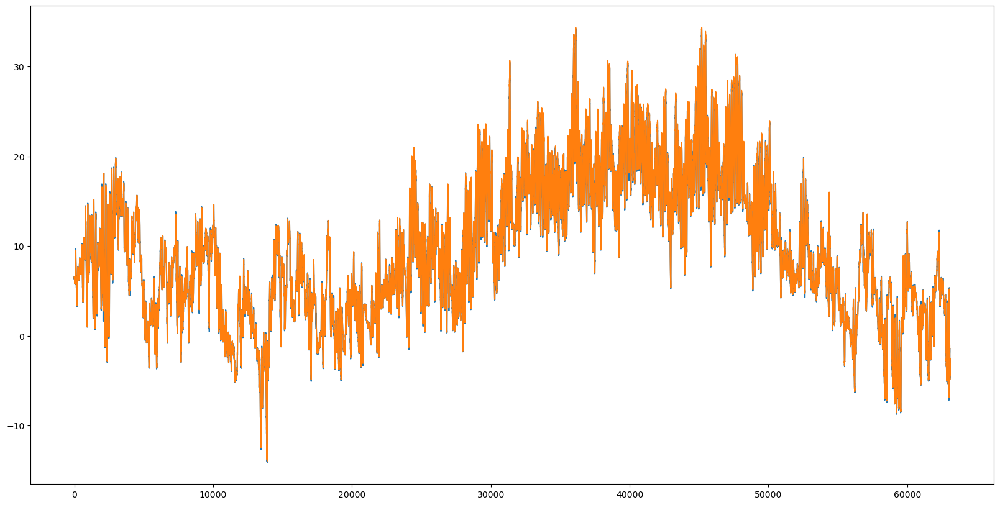

In [53]:
plt.figure(figsize=(20, 10))
plt.plot(preds_weather)
plt.plot(true_weather)
plt.show()

In [55]:
alphas_weather.shape

(63083, 10, 12, 1)

In [57]:
betas_weather.shape

(63083, 12, 1)

In [59]:
alphas_weather = alphas_weather.mean(axis=0)
betas_weather = betas_weather.mean(axis=0)

In [61]:
alphas_weather = alphas_weather[..., 0]
betas_weather = betas_weather[..., 0]

In [63]:
alphas_weather = alphas_weather.transpose(1, 0)

In [135]:
cols_weather

['p (mbar)',
 'T (degC)',
 'rh (%)',
 'VPmax (mbar)',
 'VPact (mbar)',
 'VPdef (mbar)',
 'sh (g/kg)',
 'H2OC (mmol/mol)',
 'rho (g/m**3)',
 'wv (m/s)',
 'max. wv (m/s)',
 'wd (deg)']

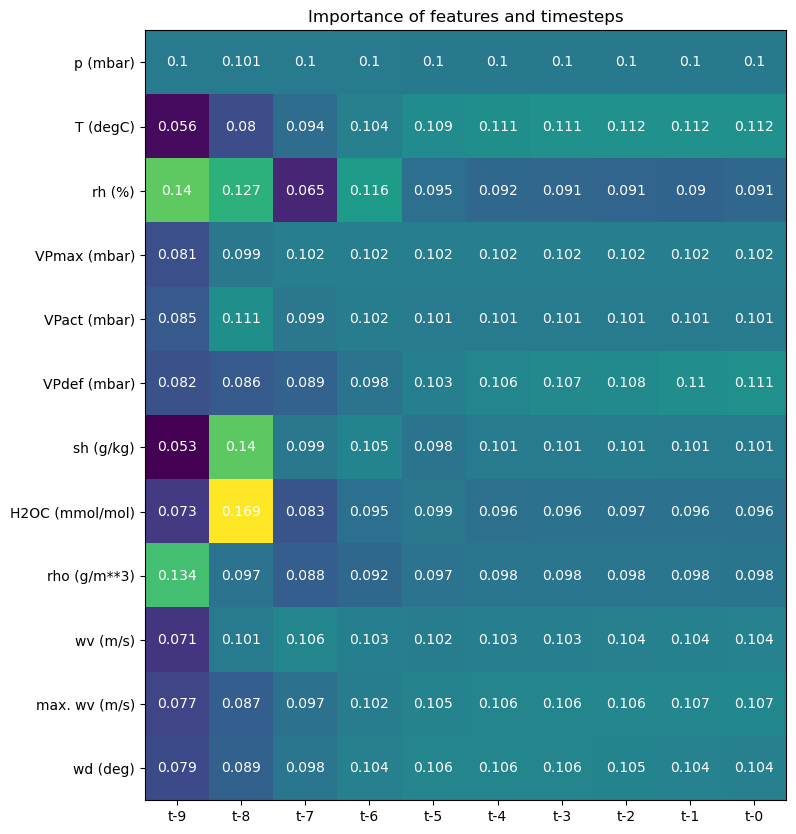

In [75]:
fig, ax = plt.subplots(figsize=(10, 10))
im_weather = ax.imshow(alphas_weather)
ax.set_xticks(np.arange(X_train_t_weather.shape[1]))
ax.set_yticks(np.arange(len(cols_weather)))
ax.set_xticklabels(["t-" + str(i) for i in np.arange(X_train_t_weather.shape[1] - 1, -1, -1)])
ax.set_yticklabels(cols_weather)
for i in range(len(cols_weather)):
    for j in range(X_train_t_weather.shape[1]):
        text = ax.text(j, i, round(alphas_weather[i, j], 3),
                       ha="center", va="center", color="w")
ax.set_title("Importance of features and timesteps")
#fig.tight_layout()
plt.show()

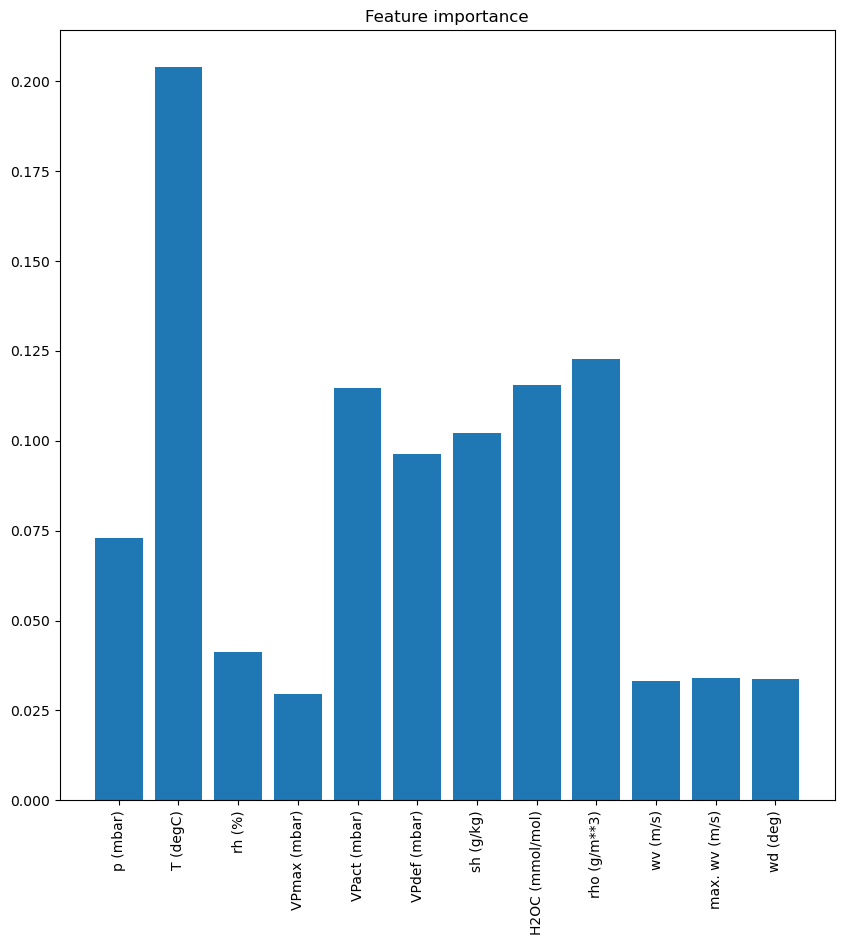

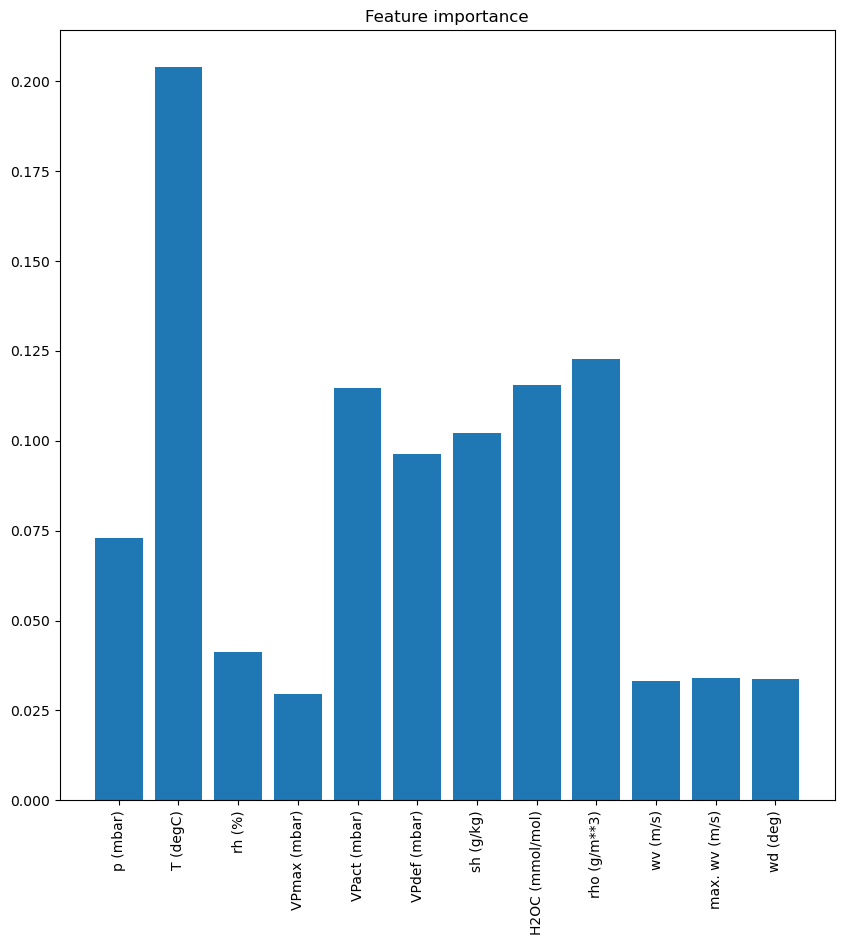

In [79]:
plt.figure(figsize=(10, 10))
plt.title("Feature importance")
plt.bar(range(len(cols_weather)), betas_weather)
plt.xticks(range(len(cols_weather)), cols_weather, rotation=90)
plt.show()

In [27]:
with torch.no_grad():
    mse_val = 0
    preds = []
    true = []
    alphas = []
    betas = []
    for batch_x, batch_y in test_loader:
        batch_x = batch_x.cuda()
        batch_y = batch_y.cuda()
        output, a, b = model(batch_x)
        output = output.squeeze(1)
        preds.append(output.detach().cpu().numpy())
        true.append(batch_y.detach().cpu().numpy())
        alphas.append(a.detach().cpu().numpy())
        betas.append(b.detach().cpu().numpy())
        mse_val += loss(output, batch_y).item()*batch_x.shape[0]
preds = np.concatenate(preds)
true = np.concatenate(true)
alphas = np.concatenate(alphas)
betas = np.concatenate(betas)

In [28]:
preds = preds*(y_train_max - y_train_min) + y_train_min
true = true*(y_train_max - y_train_min) + y_train_min

In [29]:
mse = mean_squared_error(true, preds)
mae = mean_absolute_error(true, preds)

In [30]:
mse, mae

(0.15012735, 0.28722805)

In [31]:
mse**0.5

0.3874627095399338

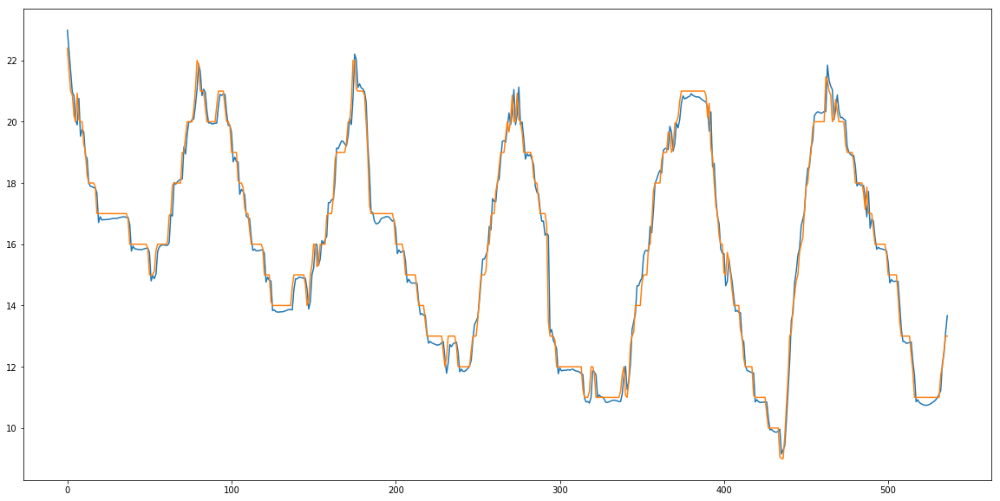

In [32]:
plt.figure(figsize=(20, 10))
plt.plot(preds)
plt.plot(true)
plt.show()

In [33]:
alphas.shape

(537, 10, 17, 1)

In [34]:
betas.shape

(537, 17, 1)

In [35]:
alphas = alphas.mean(axis=0)
betas = betas.mean(axis=0)

In [36]:
alphas = alphas[..., 0]
betas = betas[..., 0]

In [37]:
alphas = alphas.transpose(1, 0)

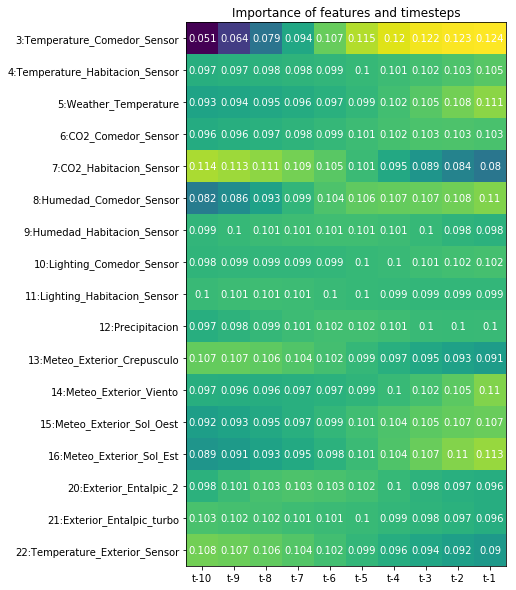

In [38]:
fig, ax = plt.subplots(figsize=(10, 10))
im = ax.imshow(alphas)
ax.set_xticks(np.arange(X_train_t.shape[1]))
ax.set_yticks(np.arange(len(cols)))
ax.set_xticklabels(["t-"+str(i) for i in np.arange(X_train_t.shape[1], -1, -1)])
ax.set_yticklabels(cols)
for i in range(len(cols)):
    for j in range(X_train_t.shape[1]):
        text = ax.text(j, i, round(alphas[i, j], 3),
                       ha="center", va="center", color="w")
ax.set_title("Importance of features and timesteps")
#fig.tight_layout()
plt.show()

([<matplotlib.axis.XTick at 0x7f4e502770f0>,
 <a list of 17 Text xticklabel objects>)

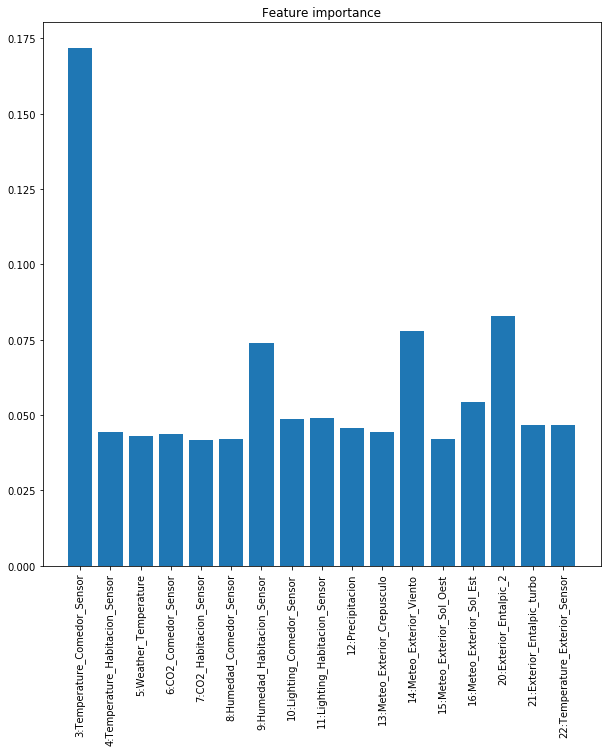

In [41]:
plt.figure(figsize=(10, 10))
plt.title("Feature importance")
plt.bar(range(len(cols)), betas)
plt.xticks(range(len(cols)), cols, rotation=90)

# Multi Step

In [17]:
cols_weather_multi=['p (mbar)', 'Tdew (degC)', 'sh (g/kg)', 'wv (m/s)', 'max. wv (m/s)',
       'wd (deg)', 'T (degC)']

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 52696 entries, NaT to NaT
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   p (mbar)       52696 non-null  float64
 1   Tdew (degC)    52696 non-null  float64
 2   sh (g/kg)      52696 non-null  float64
 3   wv (m/s)       52696 non-null  float64
 4   max. wv (m/s)  52696 non-null  float64
 5   wd (deg)       52696 non-null  float64
 6   T (degC)       52696 non-null  float64
dtypes: float64(7)
memory usage: 3.2 MB


In [19]:
input_window = 336   # instead of 40
forecast_horizon = 10

X_train_multi, y_train_multi, \
X_val_multi, y_val_multi, \
X_test_multi, y_test_multi, \
input_scaler_multi, target_scaler_multi = prepare_multistep_data(
    df=df,
    input_columns=cols_weather_multi,
    target_column=target_weather,
    input_window=input_window,
    forecast_horizon=forecast_horizon,
    scale_data=True
)


C:\Users\miche\Documents\IMV_LSTM\model_prep.py:59: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  X_multi[:, j, i] = df[col].shift(input_window - j - 1).fillna(method="bfill")
C:\Users\miche\Documents\IMV_LSTM\model_prep.py:63: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y_multi[:, step] = df[target_column].shift(-step - 1).fillna(method="ffill")


In [20]:
X_train_t_multi = torch.tensor(X_train_multi, dtype=torch.float32)
X_val_t_multi   = torch.tensor(X_val_multi, dtype=torch.float32)
X_test_t_multi  = torch.tensor(X_test_multi, dtype=torch.float32)

y_train_t_multi = torch.tensor(y_train_multi, dtype=torch.float32)
y_val_t_multi   = torch.tensor(y_val_multi, dtype=torch.float32)
y_test_t_multi  = torch.tensor(y_test_multi, dtype=torch.float32)


In [40]:
train_dataset=TensorDataset(X_train_t_multi, y_train_t_multi)
val_dataset=TensorDataset(X_val_t_multi, y_val_t_multi)
test_dataset=TensorDataset(X_test_t_multi, y_test_t_multi)

In [313]:
from itertools import product
param_grid = {
    'n_units': [128,256],
    'lr': [1e-3, 1e-2],
    'forecast_steps': [10],
    'batch_size': [128]
   # 'attn_dim' :[16, 32]
}

# Create all combinations
param_combinations = list(product(*param_grid.values()))
param_keys = list(param_grid.keys())

In [329]:
def grid_search_model(params, input_dim, output_dim, train_dataset, val_dataset, test_dataset, device):
    param_dict = dict(zip(param_keys, params))
    
    n_units = param_dict['n_units']
    lr = param_dict['lr']
    forecast_steps = param_dict['forecast_steps']
    batch_size = param_dict['batch_size']
   # attn_dim = param_dict['attn_dim']

    # Correct DataLoaders
    train_loader = DataLoader(train_dataset, shuffle=True, batch_size=batch_size)
    val_loader = DataLoader(val_dataset, shuffle=False, batch_size=batch_size)
    test_loader = DataLoader(test_dataset, shuffle=False, batch_size=batch_size)

    model = IMVTensorMultiStepLSTM(
        input_dim=input_dim,
        output_dim=output_dim,
        n_units=n_units,
        forecast_steps=forecast_steps
        #attn_dim=attn_dim
    ).to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.9)
    loss_fn = nn.MSELoss()

    model = train_multistep_model(
    model,
    train_loader,
    val_loader,
    num_epochs=30,
    learning_rate=lr,
    device=device
)

    # Now evaluate val and test loss
    model.eval()
    val_loss, test_loss = 0.0, 0.0
    loss_fn = nn.MSELoss()
    
    with torch.no_grad():
        # Validation loss
        total_val_loss, total_val_samples = 0, 0
        for X_val, y_val in val_loader:
            X_val, y_val = X_val.to(device), y_val.to(device)
            preds, _, _ = model(X_val)
            loss = loss_fn(preds.squeeze(-1), y_val)
            total_val_loss += loss.item() * X_val.size(0)
            total_val_samples += X_val.size(0)
        val_loss = total_val_loss / total_val_samples
    
        # Test loss
        total_test_loss, total_test_samples = 0, 0
        for X_test, y_test in test_loader:
            X_test, y_test = X_test.to(device), y_test.to(device)
            preds, _, _ = model(X_test)
            loss = loss_fn(preds.squeeze(-1), y_test)
            total_test_loss += loss.item() * X_test.size(0)
            total_test_samples += X_test.size(0)
        test_loss = total_test_loss / total_test_samples
    
    return val_loss, test_loss, param_dict
    



In [ ]:
best_val_loss = float('inf')
best_params = None
best_test_loss = None

for params in param_combinations:
    try:
        val_loss, test_loss, param_dict = grid_search_model(
            params,
            input_dim=len(cols_weather_multi),
            output_dim=1,
            train_dataset=TensorDataset(X_train_t_multi, y_train_t_multi),
            val_dataset=TensorDataset(X_val_t_multi, y_val_t_multi),
            test_dataset=TensorDataset(X_test_t_multi, y_test_t_multi),
            device=device
        )
        print(f"Params: {param_dict} | Val Loss: {val_loss:.4f} | Test Loss: {test_loss:.4f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_test_loss = test_loss
            best_params = param_dict

    except Exception as e:
        print(f"Failed with params {params}: {e}")


Epoch 001 | Train Loss: 0.0328 | Val Loss: 0.0183 | Train MAE: 0.1162 | Val MAE: 0.0901 | Train RMSE: 0.1812 | Val RMSE: 0.1355 | Train R²: 0.9672 | Val R²: 0.9772


Epoch 002 | Train Loss: 0.0128 | Val Loss: 0.0137 | Train MAE: 0.0791 | Val MAE: 0.0737 | Train RMSE: 0.1132 | Val RMSE: 0.1172 | Train R²: 0.9872 | Val R²: 0.9829


Epoch 003 | Train Loss: 0.0103 | Val Loss: 0.0141 | Train MAE: 0.0697 | Val MAE: 0.0758 | Train RMSE: 0.1017 | Val RMSE: 0.1189 | Train R²: 0.9897 | Val R²: 0.9824


Epoch 004 | Train Loss: 0.0094 | Val Loss: 0.0110 | Train MAE: 0.0657 | Val MAE: 0.0632 | Train RMSE: 0.0969 | Val RMSE: 0.1048 | Train R²: 0.9906 | Val R²: 0.9863


Epoch 005 | Train Loss: 0.0087 | Val Loss: 0.0109 | Train MAE: 0.0628 | Val MAE: 0.0645 | Train RMSE: 0.0934 | Val RMSE: 0.1043 | Train R²: 0.9913 | Val R²: 0.9865


Epoch 006 | Train Loss: 0.0082 | Val Loss: 0.0105 | Train MAE: 0.0603 | Val MAE: 0.0630 | Train RMSE: 0.0906 | Val RMSE: 0.1024 | Train R²: 0.9918 | Val R²: 0.9869


Epoch 007 | Train Loss: 0.0080 | Val Loss: 0.0104 | Train MAE: 0.0591 | Val MAE: 0.0580 | Train RMSE: 0.0893 | Val RMSE: 0.1020 | Train R²: 0.9920 | Val R²: 0.9871


Epoch 008 | Train Loss: 0.0078 | Val Loss: 0.0105 | Train MAE: 0.0583 | Val MAE: 0.0586 | Train RMSE: 0.0883 | Val RMSE: 0.1024 | Train R²: 0.9922 | Val R²: 0.9869


Epoch 009 | Train Loss: 0.0077 | Val Loss: 0.0083 | Train MAE: 0.0576 | Val MAE: 0.0579 | Train RMSE: 0.0876 | Val RMSE: 0.0909 | Train R²: 0.9923 | Val R²: 0.9897


Epoch 010 | Train Loss: 0.0076 | Val Loss: 0.0083 | Train MAE: 0.0572 | Val MAE: 0.0570 | Train RMSE: 0.0871 | Val RMSE: 0.0909 | Train R²: 0.9924 | Val R²: 0.9897


Epoch 011 | Train Loss: 0.0075 | Val Loss: 0.0084 | Train MAE: 0.0568 | Val MAE: 0.0567 | Train RMSE: 0.0866 | Val RMSE: 0.0915 | Train R²: 0.9925 | Val R²: 0.9896


Epoch 012 | Train Loss: 0.0074 | Val Loss: 0.0081 | Train MAE: 0.0563 | Val MAE: 0.0594 | Train RMSE: 0.0860 | Val RMSE: 0.0902 | Train R²: 0.9926 | Val R²: 0.9899


Epoch 013 | Train Loss: 0.0073 | Val Loss: 0.0081 | Train MAE: 0.0561 | Val MAE: 0.0584 | Train RMSE: 0.0857 | Val RMSE: 0.0898 | Train R²: 0.9927 | Val R²: 0.9900


Epoch 014 | Train Loss: 0.0072 | Val Loss: 0.0077 | Train MAE: 0.0556 | Val MAE: 0.0569 | Train RMSE: 0.0850 | Val RMSE: 0.0880 | Train R²: 0.9928 | Val R²: 0.9904


Epoch 015 | Train Loss: 0.0072 | Val Loss: 0.0077 | Train MAE: 0.0555 | Val MAE: 0.0574 | Train RMSE: 0.0848 | Val RMSE: 0.0877 | Train R²: 0.9928 | Val R²: 0.9904


Epoch 016 | Train Loss: 0.0071 | Val Loss: 0.0076 | Train MAE: 0.0551 | Val MAE: 0.0573 | Train RMSE: 0.0843 | Val RMSE: 0.0874 | Train R²: 0.9929 | Val R²: 0.9905


Epoch 017 | Train Loss: 0.0070 | Val Loss: 0.0076 | Train MAE: 0.0549 | Val MAE: 0.0561 | Train RMSE: 0.0839 | Val RMSE: 0.0870 | Train R²: 0.9930 | Val R²: 0.9906


Epoch 018 | Train Loss: 0.0070 | Val Loss: 0.0076 | Train MAE: 0.0547 | Val MAE: 0.0567 | Train RMSE: 0.0836 | Val RMSE: 0.0872 | Train R²: 0.9930 | Val R²: 0.9905


Epoch 019 | Train Loss: 0.0069 | Val Loss: 0.0076 | Train MAE: 0.0544 | Val MAE: 0.0585 | Train RMSE: 0.0832 | Val RMSE: 0.0873 | Train R²: 0.9931 | Val R²: 0.9905


Epoch 020 | Train Loss: 0.0069 | Val Loss: 0.0072 | Train MAE: 0.0542 | Val MAE: 0.0550 | Train RMSE: 0.0828 | Val RMSE: 0.0850 | Train R²: 0.9931 | Val R²: 0.9910


Epoch 021 | Train Loss: 0.0068 | Val Loss: 0.0074 | Train MAE: 0.0540 | Val MAE: 0.0554 | Train RMSE: 0.0825 | Val RMSE: 0.0858 | Train R²: 0.9932 | Val R²: 0.9908


Epoch 022 | Train Loss: 0.0068 | Val Loss: 0.0074 | Train MAE: 0.0539 | Val MAE: 0.0559 | Train RMSE: 0.0822 | Val RMSE: 0.0860 | Train R²: 0.9932 | Val R²: 0.9908


Epoch 023 | Train Loss: 0.0067 | Val Loss: 0.0073 | Train MAE: 0.0536 | Val MAE: 0.0552 | Train RMSE: 0.0817 | Val RMSE: 0.0853 | Train R²: 0.9933 | Val R²: 0.9909


Epoch 024 | Train Loss: 0.0066 | Val Loss: 0.0075 | Train MAE: 0.0534 | Val MAE: 0.0560 | Train RMSE: 0.0814 | Val RMSE: 0.0869 | Train R²: 0.9934 | Val R²: 0.9906


Epoch 025 | Train Loss: 0.0066 | Val Loss: 0.0073 | Train MAE: 0.0533 | Val MAE: 0.0551 | Train RMSE: 0.0810 | Val RMSE: 0.0856 | Train R²: 0.9934 | Val R²: 0.9909


Epoch 026 | Train Loss: 0.0065 | Val Loss: 0.0075 | Train MAE: 0.0530 | Val MAE: 0.0558 | Train RMSE: 0.0806 | Val RMSE: 0.0865 | Train R²: 0.9935 | Val R²: 0.9907


Epoch 027 | Train Loss: 0.0064 | Val Loss: 0.0075 | Train MAE: 0.0527 | Val MAE: 0.0567 | Train RMSE: 0.0800 | Val RMSE: 0.0865 | Train R²: 0.9936 | Val R²: 0.9907


Epoch 028 | Train Loss: 0.0063 | Val Loss: 0.0075 | Train MAE: 0.0525 | Val MAE: 0.0563 | Train RMSE: 0.0796 | Val RMSE: 0.0869 | Train R²: 0.9937 | Val R²: 0.9906


Epoch 029 | Train Loss: 0.0063 | Val Loss: 0.0077 | Train MAE: 0.0523 | Val MAE: 0.0572 | Train RMSE: 0.0791 | Val RMSE: 0.0879 | Train R²: 0.9937 | Val R²: 0.9904


Epoch 030 | Train Loss: 0.0062 | Val Loss: 0.0074 | Train MAE: 0.0520 | Val MAE: 0.0553 | Train RMSE: 0.0786 | Val RMSE: 0.0861 | Train R²: 0.9938 | Val R²: 0.9908
Params: {'n_units': 128, 'lr': 0.001, 'forecast_steps': 10, 'batch_size': 128} | Val Loss: 0.0074 | Test Loss: 0.0068


Epoch 001 | Train Loss: 0.0163 | Val Loss: 0.0090 | Train MAE: 0.0834 | Val MAE: 0.0631 | Train RMSE: 0.1277 | Val RMSE: 0.0950 | Train R²: 0.9837 | Val R²: 0.9888


Epoch 002 | Train Loss: 0.0084 | Val Loss: 0.0079 | Train MAE: 0.0615 | Val MAE: 0.0575 | Train RMSE: 0.0914 | Val RMSE: 0.0891 | Train R²: 0.9916 | Val R²: 0.9901


Epoch 003 | Train Loss: 0.0079 | Val Loss: 0.0078 | Train MAE: 0.0594 | Val MAE: 0.0573 | Train RMSE: 0.0888 | Val RMSE: 0.0882 | Train R²: 0.9921 | Val R²: 0.9903


Epoch 004 | Train Loss: 0.0077 | Val Loss: 0.0077 | Train MAE: 0.0582 | Val MAE: 0.0571 | Train RMSE: 0.0875 | Val RMSE: 0.0876 | Train R²: 0.9923 | Val R²: 0.9905


Epoch 005 | Train Loss: 0.0074 | Val Loss: 0.0076 | Train MAE: 0.0570 | Val MAE: 0.0566 | Train RMSE: 0.0862 | Val RMSE: 0.0872 | Train R²: 0.9926 | Val R²: 0.9905


Epoch 006 | Train Loss: 0.0073 | Val Loss: 0.0082 | Train MAE: 0.0566 | Val MAE: 0.0607 | Train RMSE: 0.0857 | Val RMSE: 0.0908 | Train R²: 0.9927 | Val R²: 0.9897


Epoch 007 | Train Loss: 0.0072 | Val Loss: 0.0074 | Train MAE: 0.0561 | Val MAE: 0.0557 | Train RMSE: 0.0850 | Val RMSE: 0.0862 | Train R²: 0.9928 | Val R²: 0.9907


Epoch 008 | Train Loss: 0.0071 | Val Loss: 0.0078 | Train MAE: 0.0556 | Val MAE: 0.0591 | Train RMSE: 0.0844 | Val RMSE: 0.0882 | Train R²: 0.9929 | Val R²: 0.9903


Epoch 009 | Train Loss: 0.0071 | Val Loss: 0.0081 | Train MAE: 0.0554 | Val MAE: 0.0599 | Train RMSE: 0.0840 | Val RMSE: 0.0900 | Train R²: 0.9929 | Val R²: 0.9899


Epoch 010 | Train Loss: 0.0070 | Val Loss: 0.0077 | Train MAE: 0.0550 | Val MAE: 0.0577 | Train RMSE: 0.0835 | Val RMSE: 0.0878 | Train R²: 0.9930 | Val R²: 0.9904


Epoch 011 | Train Loss: 0.0069 | Val Loss: 0.0076 | Train MAE: 0.0548 | Val MAE: 0.0564 | Train RMSE: 0.0832 | Val RMSE: 0.0871 | Train R²: 0.9931 | Val R²: 0.9906


Epoch 012 | Train Loss: 0.0069 | Val Loss: 0.0077 | Train MAE: 0.0546 | Val MAE: 0.0571 | Train RMSE: 0.0829 | Val RMSE: 0.0878 | Train R²: 0.9931 | Val R²: 0.9904


Epoch 013 | Train Loss: 0.0068 | Val Loss: 0.0078 | Train MAE: 0.0543 | Val MAE: 0.0574 | Train RMSE: 0.0826 | Val RMSE: 0.0882 | Train R²: 0.9932 | Val R²: 0.9903


Epoch 014 | Train Loss: 0.0068 | Val Loss: 0.0073 | Train MAE: 0.0542 | Val MAE: 0.0550 | Train RMSE: 0.0822 | Val RMSE: 0.0853 | Train R²: 0.9932 | Val R²: 0.9909


Epoch 015 | Train Loss: 0.0067 | Val Loss: 0.0074 | Train MAE: 0.0540 | Val MAE: 0.0551 | Train RMSE: 0.0819 | Val RMSE: 0.0858 | Train R²: 0.9933 | Val R²: 0.9908


Epoch 016 | Train Loss: 0.0066 | Val Loss: 0.0077 | Train MAE: 0.0537 | Val MAE: 0.0565 | Train RMSE: 0.0814 | Val RMSE: 0.0875 | Train R²: 0.9934 | Val R²: 0.9905


Epoch 017 | Train Loss: 0.0066 | Val Loss: 0.0075 | Train MAE: 0.0537 | Val MAE: 0.0564 | Train RMSE: 0.0813 | Val RMSE: 0.0867 | Train R²: 0.9934 | Val R²: 0.9906


Epoch 018 | Train Loss: 0.0065 | Val Loss: 0.0075 | Train MAE: 0.0534 | Val MAE: 0.0561 | Train RMSE: 0.0809 | Val RMSE: 0.0868 | Train R²: 0.9935 | Val R²: 0.9906


Epoch 019 | Train Loss: 0.0065 | Val Loss: 0.0074 | Train MAE: 0.0534 | Val MAE: 0.0555 | Train RMSE: 0.0806 | Val RMSE: 0.0860 | Train R²: 0.9935 | Val R²: 0.9908


Epoch 020 | Train Loss: 0.0065 | Val Loss: 0.0076 | Train MAE: 0.0534 | Val MAE: 0.0551 | Train RMSE: 0.0808 | Val RMSE: 0.0869 | Train R²: 0.9935 | Val R²: 0.9906


Epoch 021 | Train Loss: 0.0064 | Val Loss: 0.0080 | Train MAE: 0.0529 | Val MAE: 0.0569 | Train RMSE: 0.0801 | Val RMSE: 0.0892 | Train R²: 0.9936 | Val R²: 0.9901


Epoch 022 | Train Loss: 0.0064 | Val Loss: 0.0076 | Train MAE: 0.0529 | Val MAE: 0.0567 | Train RMSE: 0.0799 | Val RMSE: 0.0871 | Train R²: 0.9936 | Val R²: 0.9905


Epoch 023 | Train Loss: 0.0064 | Val Loss: 0.0073 | Train MAE: 0.0528 | Val MAE: 0.0549 | Train RMSE: 0.0797 | Val RMSE: 0.0857 | Train R²: 0.9936 | Val R²: 0.9909


Epoch 024 | Train Loss: 0.0063 | Val Loss: 0.0076 | Train MAE: 0.0527 | Val MAE: 0.0564 | Train RMSE: 0.0795 | Val RMSE: 0.0873 | Train R²: 0.9937 | Val R²: 0.9905


Epoch 025 | Train Loss: 0.0063 | Val Loss: 0.0076 | Train MAE: 0.0526 | Val MAE: 0.0564 | Train RMSE: 0.0793 | Val RMSE: 0.0873 | Train R²: 0.9937 | Val R²: 0.9905


Epoch 026 | Train Loss: 0.0065 | Val Loss: 0.0074 | Train MAE: 0.0534 | Val MAE: 0.0554 | Train RMSE: 0.0809 | Val RMSE: 0.0863 | Train R²: 0.9935 | Val R²: 0.9907


Epoch 027 | Train Loss: 0.0063 | Val Loss: 0.0075 | Train MAE: 0.0526 | Val MAE: 0.0557 | Train RMSE: 0.0794 | Val RMSE: 0.0865 | Train R²: 0.9937 | Val R²: 0.9907


Epoch 028 | Train Loss: 0.0062 | Val Loss: 0.0075 | Train MAE: 0.0523 | Val MAE: 0.0560 | Train RMSE: 0.0788 | Val RMSE: 0.0869 | Train R²: 0.9938 | Val R²: 0.9906


Epoch 029 | Train Loss: 0.0063 | Val Loss: 0.0077 | Train MAE: 0.0527 | Val MAE: 0.0563 | Train RMSE: 0.0792 | Val RMSE: 0.0877 | Train R²: 0.9937 | Val R²: 0.9904


Epoch 030 | Train Loss: 0.0063 | Val Loss: 0.0090 | Train MAE: 0.0529 | Val MAE: 0.0583 | Train RMSE: 0.0796 | Val RMSE: 0.0950 | Train R²: 0.9937 | Val R²: 0.9888
Params: {'n_units': 128, 'lr': 0.01, 'forecast_steps': 10, 'batch_size': 128} | Val Loss: 0.0090 | Test Loss: 0.0071


Epoch 001 | Train Loss: 0.0265 | Val Loss: 0.0130 | Train MAE: 0.1066 | Val MAE: 0.0799 | Train RMSE: 0.1629 | Val RMSE: 0.1138 | Train R²: 0.9735 | Val R²: 0.9839


Epoch 002 | Train Loss: 0.0111 | Val Loss: 0.0093 | Train MAE: 0.0730 | Val MAE: 0.0649 | Train RMSE: 0.1055 | Val RMSE: 0.0964 | Train R²: 0.9889 | Val R²: 0.9884


Epoch 003 | Train Loss: 0.0090 | Val Loss: 0.0094 | Train MAE: 0.0639 | Val MAE: 0.0677 | Train RMSE: 0.0946 | Val RMSE: 0.0967 | Train R²: 0.9910 | Val R²: 0.9884


Epoch 004 | Train Loss: 0.0082 | Val Loss: 0.0083 | Train MAE: 0.0608 | Val MAE: 0.0600 | Train RMSE: 0.0908 | Val RMSE: 0.0909 | Train R²: 0.9918 | Val R²: 0.9897


Epoch 005 | Train Loss: 0.0080 | Val Loss: 0.0080 | Train MAE: 0.0593 | Val MAE: 0.0583 | Train RMSE: 0.0892 | Val RMSE: 0.0894 | Train R²: 0.9920 | Val R²: 0.9900


Epoch 006 | Train Loss: 0.0078 | Val Loss: 0.0079 | Train MAE: 0.0585 | Val MAE: 0.0584 | Train RMSE: 0.0882 | Val RMSE: 0.0887 | Train R²: 0.9922 | Val R²: 0.9902


Epoch 007 | Train Loss: 0.0076 | Val Loss: 0.0077 | Train MAE: 0.0579 | Val MAE: 0.0567 | Train RMSE: 0.0874 | Val RMSE: 0.0878 | Train R²: 0.9924 | Val R²: 0.9904


Epoch 008 | Train Loss: 0.0075 | Val Loss: 0.0080 | Train MAE: 0.0572 | Val MAE: 0.0587 | Train RMSE: 0.0867 | Val RMSE: 0.0896 | Train R²: 0.9925 | Val R²: 0.9900


Epoch 009 | Train Loss: 0.0074 | Val Loss: 0.0078 | Train MAE: 0.0568 | Val MAE: 0.0586 | Train RMSE: 0.0862 | Val RMSE: 0.0883 | Train R²: 0.9926 | Val R²: 0.9903


Epoch 010 | Train Loss: 0.0073 | Val Loss: 0.0075 | Train MAE: 0.0563 | Val MAE: 0.0567 | Train RMSE: 0.0856 | Val RMSE: 0.0868 | Train R²: 0.9927 | Val R²: 0.9906


Epoch 011 | Train Loss: 0.0073 | Val Loss: 0.0076 | Train MAE: 0.0560 | Val MAE: 0.0572 | Train RMSE: 0.0852 | Val RMSE: 0.0870 | Train R²: 0.9927 | Val R²: 0.9906


Epoch 012 | Train Loss: 0.0072 | Val Loss: 0.0078 | Train MAE: 0.0558 | Val MAE: 0.0581 | Train RMSE: 0.0849 | Val RMSE: 0.0885 | Train R²: 0.9928 | Val R²: 0.9903


Epoch 013 | Train Loss: 0.0071 | Val Loss: 0.0075 | Train MAE: 0.0555 | Val MAE: 0.0560 | Train RMSE: 0.0845 | Val RMSE: 0.0866 | Train R²: 0.9929 | Val R²: 0.9907


Epoch 014 | Train Loss: 0.0071 | Val Loss: 0.0077 | Train MAE: 0.0551 | Val MAE: 0.0570 | Train RMSE: 0.0840 | Val RMSE: 0.0880 | Train R²: 0.9929 | Val R²: 0.9904


Epoch 015 | Train Loss: 0.0070 | Val Loss: 0.0075 | Train MAE: 0.0549 | Val MAE: 0.0558 | Train RMSE: 0.0836 | Val RMSE: 0.0865 | Train R²: 0.9930 | Val R²: 0.9907


Epoch 016 | Train Loss: 0.0069 | Val Loss: 0.0077 | Train MAE: 0.0547 | Val MAE: 0.0577 | Train RMSE: 0.0833 | Val RMSE: 0.0877 | Train R²: 0.9931 | Val R²: 0.9904


Epoch 017 | Train Loss: 0.0069 | Val Loss: 0.0075 | Train MAE: 0.0544 | Val MAE: 0.0557 | Train RMSE: 0.0828 | Val RMSE: 0.0868 | Train R²: 0.9931 | Val R²: 0.9906


Epoch 018 | Train Loss: 0.0068 | Val Loss: 0.0076 | Train MAE: 0.0542 | Val MAE: 0.0560 | Train RMSE: 0.0825 | Val RMSE: 0.0872 | Train R²: 0.9932 | Val R²: 0.9905


Epoch 019 | Train Loss: 0.0067 | Val Loss: 0.0077 | Train MAE: 0.0539 | Val MAE: 0.0576 | Train RMSE: 0.0819 | Val RMSE: 0.0880 | Train R²: 0.9933 | Val R²: 0.9904


Epoch 020 | Train Loss: 0.0066 | Val Loss: 0.0078 | Train MAE: 0.0537 | Val MAE: 0.0582 | Train RMSE: 0.0815 | Val RMSE: 0.0882 | Train R²: 0.9934 | Val R²: 0.9903


Epoch 021 | Train Loss: 0.0065 | Val Loss: 0.0078 | Train MAE: 0.0533 | Val MAE: 0.0580 | Train RMSE: 0.0809 | Val RMSE: 0.0884 | Train R²: 0.9935 | Val R²: 0.9903


Epoch 022 | Train Loss: 0.0064 | Val Loss: 0.0076 | Train MAE: 0.0530 | Val MAE: 0.0565 | Train RMSE: 0.0803 | Val RMSE: 0.0872 | Train R²: 0.9936 | Val R²: 0.9905


Epoch 023 | Train Loss: 0.0063 | Val Loss: 0.0077 | Train MAE: 0.0526 | Val MAE: 0.0563 | Train RMSE: 0.0795 | Val RMSE: 0.0877 | Train R²: 0.9937 | Val R²: 0.9904


Epoch 024 | Train Loss: 0.0062 | Val Loss: 0.0076 | Train MAE: 0.0523 | Val MAE: 0.0561 | Train RMSE: 0.0788 | Val RMSE: 0.0875 | Train R²: 0.9938 | Val R²: 0.9905


Epoch 025 | Train Loss: 0.0061 | Val Loss: 0.0077 | Train MAE: 0.0520 | Val MAE: 0.0566 | Train RMSE: 0.0782 | Val RMSE: 0.0878 | Train R²: 0.9939 | Val R²: 0.9904


Epoch 026 | Train Loss: 0.0060 | Val Loss: 0.0078 | Train MAE: 0.0516 | Val MAE: 0.0565 | Train RMSE: 0.0775 | Val RMSE: 0.0881 | Train R²: 0.9940 | Val R²: 0.9903


Epoch 027 | Train Loss: 0.0059 | Val Loss: 0.0078 | Train MAE: 0.0511 | Val MAE: 0.0564 | Train RMSE: 0.0765 | Val RMSE: 0.0881 | Train R²: 0.9941 | Val R²: 0.9904


Epoch 028 | Train Loss: 0.0057 | Val Loss: 0.0078 | Train MAE: 0.0506 | Val MAE: 0.0563 | Train RMSE: 0.0757 | Val RMSE: 0.0884 | Train R²: 0.9943 | Val R²: 0.9903


Epoch 29/30:  21%|██████████▋                                         | 474/2300 [04:53<18:34,  1.64it/s, loss=0.00493]

In [ ]:
print("✅ Best Parameters Found:")
print(best_params)
print(f"Validation Loss: {best_val_loss:.4f}")
print(f"Test Loss with Best Params: {best_test_loss:.4f}")
Params: {'n_units': 128, 'lr': 0.01, 'forecast_steps': 10, 'batch_size': 128} 

In [31]:

# Assuming you already have the following model initialized:
forecast_horizon=10

model_IMV_Con = IMVTensorMultiStepLSTMConicity(input_dim=len(cols_weather_multi), output_dim=1, n_units=128, forecast_steps=forecast_horizon)
num_epochs = 20  # You can adjust this as needed
learning_rate = 0.01  # Adjust based on experimentation
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # Use GPU if available


In [35]:
trained_model_con = train_concocity_model(
    model=model_IMV_Con,
    train_loader=train_loader_multi,
    val_loader=val_loader_multi,
    num_epochs=20,
    learning_rate=0.01,
    device=device,
    target_scaler=target_scaler_multi  # Optional
)


Epoch 001 | Train Loss: 0.0163 | Val Loss: 0.0092 | Train MAE: 0.7162 | Val MAE: 0.5371 | Train RMSE: 1.1042 | Val RMSE: 0.8285 | Train R²: 0.9837 | Val R²: 0.9886 | Train Conicity: 0.8798 | Val Conicity: 0.8724


Epoch 002 | Train Loss: 0.0086 | Val Loss: 0.0089 | Train MAE: 0.5410 | Val MAE: 0.5450 | Train RMSE: 0.8026 | Val RMSE: 0.8175 | Train R²: 0.9914 | Val R²: 0.9889 | Train Conicity: 0.8637 | Val Conicity: 0.8539


Epoch 003 | Train Loss: 0.0081 | Val Loss: 0.0082 | Train MAE: 0.5202 | Val MAE: 0.4973 | Train RMSE: 0.7786 | Val RMSE: 0.7841 | Train R²: 0.9919 | Val R²: 0.9898 | Train Conicity: 0.8459 | Val Conicity: 0.8435


Epoch 004 | Train Loss: 0.0078 | Val Loss: 0.0082 | Train MAE: 0.5099 | Val MAE: 0.5248 | Train RMSE: 0.7660 | Val RMSE: 0.7855 | Train R²: 0.9922 | Val R²: 0.9897 | Train Conicity: 0.8397 | Val Conicity: 0.8449


Epoch 005 | Train Loss: 0.0077 | Val Loss: 0.0079 | Train MAE: 0.5036 | Val MAE: 0.4952 | Train RMSE: 0.7587 | Val RMSE: 0.7706 | Train R²: 0.9923 | Val R²: 0.9901 | Train Conicity: 0.8401 | Val Conicity: 0.8319


Epoch 006 | Train Loss: 0.0075 | Val Loss: 0.0079 | Train MAE: 0.4969 | Val MAE: 0.5106 | Train RMSE: 0.7508 | Val RMSE: 0.7690 | Train R²: 0.9925 | Val R²: 0.9902 | Train Conicity: 0.8356 | Val Conicity: 0.8338


Epoch 007 | Train Loss: 0.0074 | Val Loss: 0.0081 | Train MAE: 0.4939 | Val MAE: 0.5147 | Train RMSE: 0.7465 | Val RMSE: 0.7767 | Train R²: 0.9926 | Val R²: 0.9900 | Train Conicity: 0.8311 | Val Conicity: 0.8296


Epoch 008 | Train Loss: 0.0073 | Val Loss: 0.0076 | Train MAE: 0.4883 | Val MAE: 0.4841 | Train RMSE: 0.7401 | Val RMSE: 0.7525 | Train R²: 0.9927 | Val R²: 0.9906 | Train Conicity: 0.8307 | Val Conicity: 0.8314


Epoch 009 | Train Loss: 0.0073 | Val Loss: 0.0076 | Train MAE: 0.4882 | Val MAE: 0.4858 | Train RMSE: 0.7385 | Val RMSE: 0.7556 | Train R²: 0.9927 | Val R²: 0.9905 | Train Conicity: 0.8299 | Val Conicity: 0.8395


Epoch 010 | Train Loss: 0.0072 | Val Loss: 0.0079 | Train MAE: 0.4843 | Val MAE: 0.5097 | Train RMSE: 0.7330 | Val RMSE: 0.7693 | Train R²: 0.9928 | Val R²: 0.9902 | Train Conicity: 0.8416 | Val Conicity: 0.8407


Epoch 011 | Train Loss: 0.0071 | Val Loss: 0.0079 | Train MAE: 0.4810 | Val MAE: 0.5038 | Train RMSE: 0.7289 | Val RMSE: 0.7669 | Train R²: 0.9929 | Val R²: 0.9902 | Train Conicity: 0.8334 | Val Conicity: 0.8266


Epoch 012 | Train Loss: 0.0070 | Val Loss: 0.0077 | Train MAE: 0.4784 | Val MAE: 0.4972 | Train RMSE: 0.7254 | Val RMSE: 0.7608 | Train R²: 0.9930 | Val R²: 0.9904 | Train Conicity: 0.8257 | Val Conicity: 0.8281


Epoch 013 | Train Loss: 0.0070 | Val Loss: 0.0076 | Train MAE: 0.4761 | Val MAE: 0.4844 | Train RMSE: 0.7222 | Val RMSE: 0.7543 | Train R²: 0.9930 | Val R²: 0.9905 | Train Conicity: 0.8238 | Val Conicity: 0.8231


Epoch 014 | Train Loss: 0.0069 | Val Loss: 0.0077 | Train MAE: 0.4753 | Val MAE: 0.4872 | Train RMSE: 0.7198 | Val RMSE: 0.7604 | Train R²: 0.9931 | Val R²: 0.9904 | Train Conicity: 0.8219 | Val Conicity: 0.8209


Epoch 015 | Train Loss: 0.0069 | Val Loss: 0.0078 | Train MAE: 0.4730 | Val MAE: 0.4950 | Train RMSE: 0.7165 | Val RMSE: 0.7619 | Train R²: 0.9931 | Val R²: 0.9904 | Train Conicity: 0.8201 | Val Conicity: 0.8190


Epoch 016 | Train Loss: 0.0068 | Val Loss: 0.0075 | Train MAE: 0.4717 | Val MAE: 0.4921 | Train RMSE: 0.7140 | Val RMSE: 0.7507 | Train R²: 0.9932 | Val R²: 0.9906 | Train Conicity: 0.8206 | Val Conicity: 0.8227


Epoch 017 | Train Loss: 0.0068 | Val Loss: 0.0079 | Train MAE: 0.4699 | Val MAE: 0.4945 | Train RMSE: 0.7116 | Val RMSE: 0.7696 | Train R²: 0.9932 | Val R²: 0.9902 | Train Conicity: 0.8186 | Val Conicity: 0.8196


Epoch 018 | Train Loss: 0.0067 | Val Loss: 0.0077 | Train MAE: 0.4690 | Val MAE: 0.4903 | Train RMSE: 0.7102 | Val RMSE: 0.7597 | Train R²: 0.9933 | Val R²: 0.9904 | Train Conicity: 0.8172 | Val Conicity: 0.8168


Epoch 019 | Train Loss: 0.0067 | Val Loss: 0.0080 | Train MAE: 0.4680 | Val MAE: 0.4977 | Train RMSE: 0.7099 | Val RMSE: 0.7738 | Train R²: 0.9933 | Val R²: 0.9900 | Train Conicity: 0.8167 | Val Conicity: 0.8213


Epoch 020 | Train Loss: 0.0067 | Val Loss: 0.0077 | Train MAE: 0.4665 | Val MAE: 0.4834 | Train RMSE: 0.7065 | Val RMSE: 0.7598 | Train R²: 0.9933 | Val R²: 0.9904 | Train Conicity: 0.8150 | Val Conicity: 0.8181


Epoch 021 | Train Loss: 0.0066 | Val Loss: 0.0077 | Train MAE: 0.4654 | Val MAE: 0.4823 | Train RMSE: 0.7042 | Val RMSE: 0.7585 | Train R²: 0.9934 | Val R²: 0.9904 | Train Conicity: 0.8134 | Val Conicity: 0.8176


Epoch 022 | Train Loss: 0.0066 | Val Loss: 0.0080 | Train MAE: 0.4635 | Val MAE: 0.4995 | Train RMSE: 0.7014 | Val RMSE: 0.7759 | Train R²: 0.9934 | Val R²: 0.9900 | Train Conicity: 0.8124 | Val Conicity: 0.8121


Epoch 023 | Train Loss: 0.0065 | Val Loss: 0.0081 | Train MAE: 0.4632 | Val MAE: 0.5116 | Train RMSE: 0.6999 | Val RMSE: 0.7797 | Train R²: 0.9935 | Val R²: 0.9899 | Train Conicity: 0.8128 | Val Conicity: 0.8180


Epoch 024 | Train Loss: 0.0065 | Val Loss: 0.0077 | Train MAE: 0.4609 | Val MAE: 0.4887 | Train RMSE: 0.6970 | Val RMSE: 0.7596 | Train R²: 0.9935 | Val R²: 0.9904 | Train Conicity: 0.8133 | Val Conicity: 0.8140


Epoch 025 | Train Loss: 0.0065 | Val Loss: 0.0078 | Train MAE: 0.4630 | Val MAE: 0.4859 | Train RMSE: 0.6994 | Val RMSE: 0.7662 | Train R²: 0.9935 | Val R²: 0.9902 | Train Conicity: 0.8123 | Val Conicity: 0.8145


Epoch 026 | Train Loss: 0.0066 | Val Loss: 0.0078 | Train MAE: 0.4626 | Val MAE: 0.4897 | Train RMSE: 0.7008 | Val RMSE: 0.7643 | Train R²: 0.9934 | Val R²: 0.9903 | Train Conicity: 0.8100 | Val Conicity: 0.8070


Epoch 027 | Train Loss: 0.0065 | Val Loss: 0.0076 | Train MAE: 0.4605 | Val MAE: 0.4835 | Train RMSE: 0.6968 | Val RMSE: 0.7562 | Train R²: 0.9935 | Val R²: 0.9905 | Train Conicity: 0.8078 | Val Conicity: 0.8063


Epoch 028 | Train Loss: 0.0064 | Val Loss: 0.0077 | Train MAE: 0.4594 | Val MAE: 0.4936 | Train RMSE: 0.6942 | Val RMSE: 0.7602 | Train R²: 0.9936 | Val R²: 0.9904 | Train Conicity: 0.8094 | Val Conicity: 0.8112


Epoch 029 | Train Loss: 0.0065 | Val Loss: 0.0077 | Train MAE: 0.4602 | Val MAE: 0.4820 | Train RMSE: 0.6962 | Val RMSE: 0.7580 | Train R²: 0.9935 | Val R²: 0.9905 | Train Conicity: 0.8077 | Val Conicity: 0.8081


Epoch 030 | Train Loss: 0.0063 | Val Loss: 0.0079 | Train MAE: 0.4560 | Val MAE: 0.5011 | Train RMSE: 0.6882 | Val RMSE: 0.7686 | Train R²: 0.9937 | Val R²: 0.9902 | Train Conicity: 0.8093 | Val Conicity: 0.8101


In [39]:
def evaluate_conicity_model(model, data_loader, device, target_scaler=None, print_metrics=True):
    model.eval()
    predictions = []
    targets = []
    alphas_all = []
    betas_all = []
    conicity_scores = []

    with torch.no_grad():
        for X_batch, y_batch in data_loader:
            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)

            y_pred, alphas, betas, conicity = model(X_batch)

            predictions.append(y_pred.cpu())
            targets.append(y_batch.cpu())
            alphas_all.append(alphas.cpu())
            betas_all.append(betas.cpu())
            conicity_scores.append(conicity.item())

    predictions = torch.cat(predictions).numpy()
    targets = torch.cat(targets).numpy()
    alphas_all = torch.cat(alphas_all).numpy()
    betas_all = torch.cat(betas_all).numpy()

    # Optional inverse scaling
    if target_scaler is not None:
        from copy import deepcopy

        def inverse_scale(y):
            if y.ndim == 3 and y.shape[-1] == 1:
                y = y.squeeze(-1)
            y_flat = y.reshape(-1, target_scaler.mean_.shape[0])
            return target_scaler.inverse_transform(y_flat).reshape(y.shape)

        predictions = inverse_scale(predictions)
        targets = inverse_scale(targets)

    # Compute metrics
    mae = mean_absolute_error(targets.flatten(), predictions.flatten())
    rmse = mean_squared_error(targets.flatten(), predictions.flatten(), squared=False)
    r2 = r2_score(targets.flatten(), predictions.flatten())
    avg_conicity = np.mean(conicity_scores)

    if print_metrics:
        print(f"MAE: {mae:.4f} | RMSE: {rmse:.4f} | R²: {r2:.4f} | Avg Conicity: {avg_conicity:.4f}")

    return predictions, targets, alphas_all, betas_all, {
        "MAE": mae,
        "RMSE": rmse,
        "R2": r2,
        "Conicity": avg_conicity
    }


In [41]:
preds, trues, alphas, betas, metrics = evaluate_conicity_model(
    trained_model_con, test_loader_multi, device, target_scaler=target_scaler_multi
)


MAE: 0.4814 | RMSE: 0.7232 | R²: 0.9914 | Avg Conicity: 0.8082


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [43]:
import matplotlib.pyplot as plt

def plot_forecast_vs_truth(preds, trues, index=0):
    plt.figure(figsize=(10, 4))
    plt.plot(trues[index], label='Ground Truth')
    plt.plot(preds[index], label='Prediction')
    plt.title(f"Forecast vs. Ground Truth (Sample {index})")
    plt.xlabel("Forecast Step")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)
    plt.show()


In [45]:
import seaborn as sns

def plot_alpha_heatmap(alphas, sample_index=0):
    alpha = alphas[sample_index]  # shape: [seq_len, input_dim, n_units]
    alpha_mean = alpha.mean(axis=-1)  # shape: [seq_len, input_dim]

    plt.figure(figsize=(8, 6))
    sns.heatmap(alpha_mean.T, cmap='viridis', cbar=True)
    plt.title(f"Alpha Attention Heatmap (Sample {sample_index})")
    plt.xlabel("Time Step")
    plt.ylabel("Input Feature")
    plt.show()


In [47]:
def plot_beta_per_step(betas, sample_index=0):
    beta = betas[sample_index]  # shape: [forecast_steps, input_dim]
    plt.figure(figsize=(10, 4))
    for i in range(beta.shape[1]):
        plt.plot(beta[:, i], label=f"Feature {i}")
    plt.title(f"Beta Attention Across Forecast Steps (Sample {sample_index})")
    plt.xlabel("Forecast Step")
    plt.ylabel("Attention Weight")
    plt.legend()
    plt.grid(True)
    plt.show()


In [49]:
def plot_conicity_distribution(conicity_scores):
    plt.figure(figsize=(6, 4))
    plt.hist(conicity_scores, bins=20, edgecolor='black')
    plt.title("Distribution of Conicity Scores")
    plt.xlabel("Conicity")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.show()


In [51]:
def plot_conicity_over_epochs(conicity_list):
    plt.figure(figsize=(8, 4))
    plt.plot(conicity_list)
    plt.title("Mean Conicity Over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Conicity")
    plt.grid(True)
    plt.show()


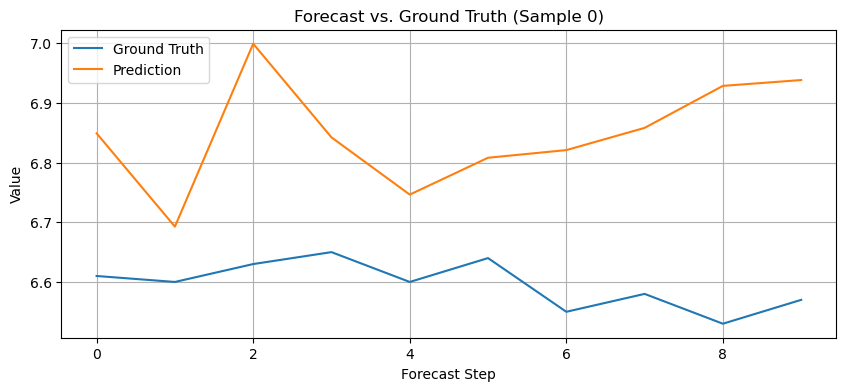

In [53]:
plot_forecast_vs_truth(preds, trues, index=0)


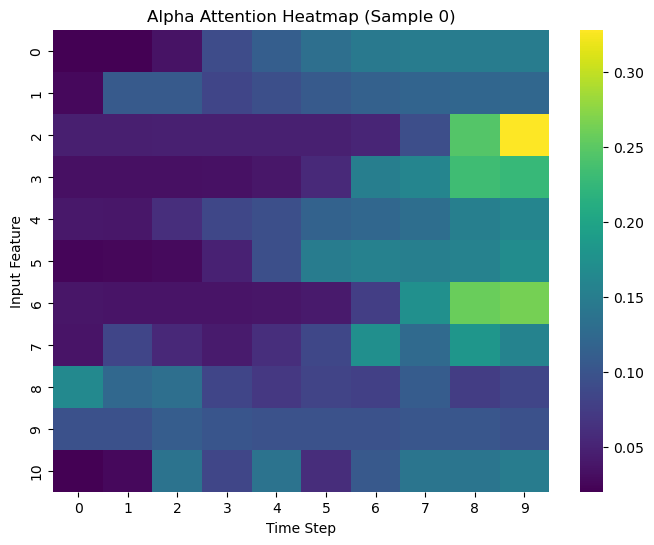

In [55]:
plot_alpha_heatmap(alphas, sample_index=0)


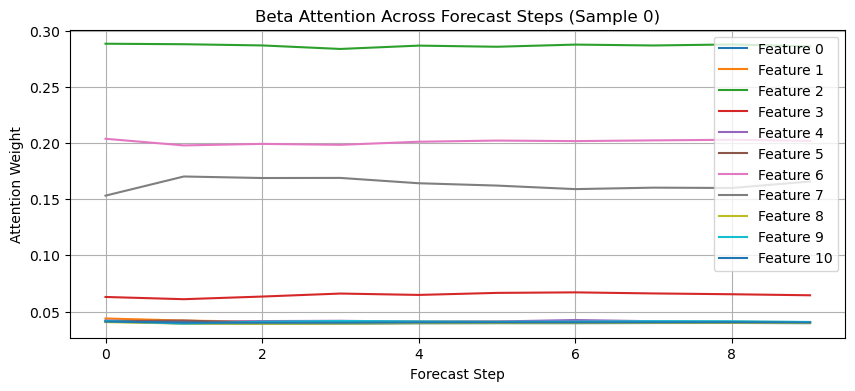

In [57]:
plot_beta_per_step(betas, sample_index=0)


In [67]:
conicity_list = []
with torch.no_grad():
    for X_batch, y_batch in test_loader_multi:
        y_pred, alphas, betas, mean_conicity =model_IMV_Con(X_batch.to(device))
        conicity_list.append(mean_conicity.item())


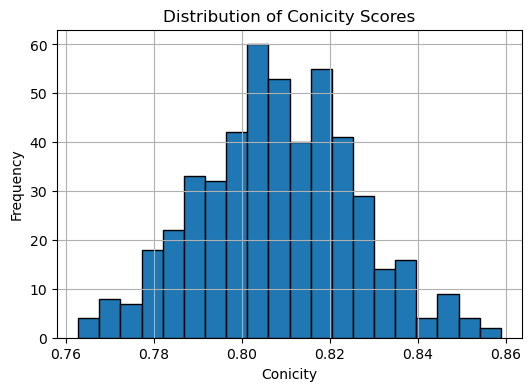

In [68]:
plot_conicity_distribution(conicity_list)


In [27]:
# First, define your loss function builder (from previous steps)
def build_loss_function(use_attention_regularization=False, attn_lambda=0.1):
    mse_loss = nn.MSELoss()
    
    def loss_fn(pred, target, attn_weights=None):
        loss = mse_loss(pred, target)
        if use_attention_regularization and attn_weights is not None:
            var = attn_weights.var(dim=1).mean()
            loss = loss + attn_lambda * var
        return loss
    
    return loss_fn
forecast_horizon=10
# Instantiate your model (make sure it returns attention weights)
model_reg = IMVTensorMultiStepLSTM(input_dim=len(cols_weather_multi), output_dim=1, n_units=128, forecast_steps=forecast_horizon)

# Build the loss function with attention regularization enabled
loss_fn = build_loss_function(use_attention_regularization=True, attn_lambda=0.1)


Epoch 001 | Train Loss: 0.0328 | Val Loss: 0.0134 | Train MAE: 0.9964 | Val MAE: 0.6980 | Train RMSE: 1.5672 | Val RMSE: 1.0016 | Train R²: 0.9672 | Val R²: 0.9833 | Train Entropy: 0.2286 | Val Entropy: 0.2279


Epoch 002 | Train Loss: 0.0116 | Val Loss: 0.0124 | Train MAE: 0.6434 | Val MAE: 0.6751 | Train RMSE: 0.9277 | Val RMSE: 0.9648 | Train R²: 0.9885 | Val R²: 0.9845 | Train Entropy: 0.2278 | Val Entropy: 0.2280


Epoch 003 | Train Loss: 0.0099 | Val Loss: 0.0100 | Train MAE: 0.5833 | Val MAE: 0.5565 | Train RMSE: 0.8578 | Val RMSE: 0.8671 | Train R²: 0.9902 | Val R²: 0.9875 | Train Entropy: 0.2282 | Val Entropy: 0.2282


Epoch 004 | Train Loss: 0.0091 | Val Loss: 0.0099 | Train MAE: 0.5533 | Val MAE: 0.5526 | Train RMSE: 0.8223 | Val RMSE: 0.8621 | Train R²: 0.9910 | Val R²: 0.9876 | Train Entropy: 0.2283 | Val Entropy: 0.2282


Epoch 005 | Train Loss: 0.0086 | Val Loss: 0.0092 | Train MAE: 0.5348 | Val MAE: 0.5548 | Train RMSE: 0.8006 | Val RMSE: 0.8285 | Train R²: 0.9914 | Val R²: 0.9886 | Train Entropy: 0.2281 | Val Entropy: 0.2282


Epoch 006 | Train Loss: 0.0083 | Val Loss: 0.0089 | Train MAE: 0.5202 | Val MAE: 0.5180 | Train RMSE: 0.7841 | Val RMSE: 0.8157 | Train R²: 0.9918 | Val R²: 0.9889 | Train Entropy: 0.2280 | Val Entropy: 0.2281


Epoch 007 | Train Loss: 0.0080 | Val Loss: 0.0082 | Train MAE: 0.5098 | Val MAE: 0.5118 | Train RMSE: 0.7717 | Val RMSE: 0.7813 | Train R²: 0.9920 | Val R²: 0.9899 | Train Entropy: 0.2280 | Val Entropy: 0.2280


Epoch 008 | Train Loss: 0.0078 | Val Loss: 0.0090 | Train MAE: 0.5006 | Val MAE: 0.5370 | Train RMSE: 0.7618 | Val RMSE: 0.8220 | Train R²: 0.9922 | Val R²: 0.9888 | Train Entropy: 0.2282 | Val Entropy: 0.2281


Epoch 009 | Train Loss: 0.0077 | Val Loss: 0.0087 | Train MAE: 0.4977 | Val MAE: 0.5361 | Train RMSE: 0.7569 | Val RMSE: 0.8077 | Train R²: 0.9923 | Val R²: 0.9892 | Train Entropy: 0.2283 | Val Entropy: 0.2282


Epoch 010 | Train Loss: 0.0076 | Val Loss: 0.0076 | Train MAE: 0.4927 | Val MAE: 0.4878 | Train RMSE: 0.7509 | Val RMSE: 0.7565 | Train R²: 0.9925 | Val R²: 0.9905 | Train Entropy: 0.2285 | Val Entropy: 0.2285


Epoch 011 | Train Loss: 0.0075 | Val Loss: 0.0078 | Train MAE: 0.4897 | Val MAE: 0.5010 | Train RMSE: 0.7469 | Val RMSE: 0.7628 | Train R²: 0.9925 | Val R²: 0.9903 | Train Entropy: 0.2286 | Val Entropy: 0.2287


Epoch 012 | Train Loss: 0.0074 | Val Loss: 0.0078 | Train MAE: 0.4859 | Val MAE: 0.5054 | Train RMSE: 0.7427 | Val RMSE: 0.7632 | Train R²: 0.9926 | Val R²: 0.9903 | Train Entropy: 0.2287 | Val Entropy: 0.2287


Epoch 013 | Train Loss: 0.0073 | Val Loss: 0.0075 | Train MAE: 0.4839 | Val MAE: 0.4817 | Train RMSE: 0.7397 | Val RMSE: 0.7511 | Train R²: 0.9927 | Val R²: 0.9906 | Train Entropy: 0.2288 | Val Entropy: 0.2287


Epoch 014 | Train Loss: 0.0073 | Val Loss: 0.0077 | Train MAE: 0.4825 | Val MAE: 0.4889 | Train RMSE: 0.7369 | Val RMSE: 0.7572 | Train R²: 0.9927 | Val R²: 0.9905 | Train Entropy: 0.2288 | Val Entropy: 0.2288


Epoch 015 | Train Loss: 0.0072 | Val Loss: 0.0074 | Train MAE: 0.4797 | Val MAE: 0.4762 | Train RMSE: 0.7342 | Val RMSE: 0.7444 | Train R²: 0.9928 | Val R²: 0.9908 | Train Entropy: 0.2289 | Val Entropy: 0.2289


Epoch 016 | Train Loss: 0.0072 | Val Loss: 0.0076 | Train MAE: 0.4776 | Val MAE: 0.4889 | Train RMSE: 0.7303 | Val RMSE: 0.7561 | Train R²: 0.9929 | Val R²: 0.9905 | Train Entropy: 0.2290 | Val Entropy: 0.2291


Epoch 017 | Train Loss: 0.0071 | Val Loss: 0.0075 | Train MAE: 0.4761 | Val MAE: 0.4848 | Train RMSE: 0.7281 | Val RMSE: 0.7514 | Train R²: 0.9929 | Val R²: 0.9906 | Train Entropy: 0.2291 | Val Entropy: 0.2290


Epoch 018 | Train Loss: 0.0071 | Val Loss: 0.0076 | Train MAE: 0.4748 | Val MAE: 0.4919 | Train RMSE: 0.7257 | Val RMSE: 0.7528 | Train R²: 0.9930 | Val R²: 0.9906 | Train Entropy: 0.2291 | Val Entropy: 0.2291


Epoch 019 | Train Loss: 0.0070 | Val Loss: 0.0076 | Train MAE: 0.4722 | Val MAE: 0.4911 | Train RMSE: 0.7220 | Val RMSE: 0.7553 | Train R²: 0.9930 | Val R²: 0.9905 | Train Entropy: 0.2292 | Val Entropy: 0.2292


Epoch 020 | Train Loss: 0.0069 | Val Loss: 0.0079 | Train MAE: 0.4704 | Val MAE: 0.4983 | Train RMSE: 0.7189 | Val RMSE: 0.7680 | Train R²: 0.9931 | Val R²: 0.9902 | Train Entropy: 0.2292 | Val Entropy: 0.2292


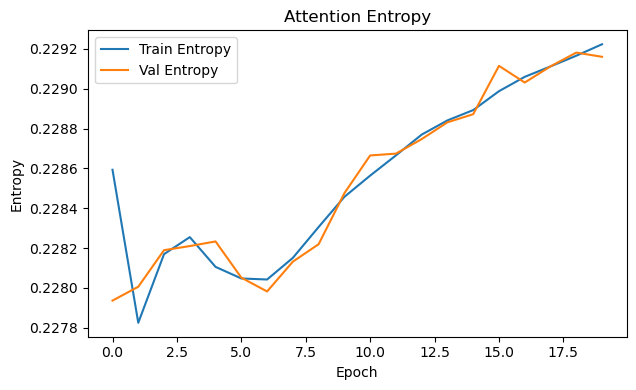

In [29]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # Use GPU if available
# Now run training
trained_model = train_multistep_model_reg(
    model_reg,
    train_loader_multi,
    val_loader_multi,
    num_epochs=20,
    learning_rate=1e-3,
    device=device,
    loss_fn=loss_fn,
    target_scaler=target_scaler_multi
)


In [35]:
def evaluate_reg_model(model, data_loader, device, target_scaler=None, print_metrics=True):
    model.eval()
    predictions = []
    targets = []
    alphas_all = []
    betas_all = []

    with torch.no_grad():
        for X_batch, y_batch in data_loader:
            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)

            y_pred, alphas, betas, _ = model(X_batch)

            predictions.append(y_pred.cpu())
            targets.append(y_batch.cpu())
            alphas_all.append(alphas.cpu())
            betas_all.append(betas.cpu())

    predictions = torch.cat(predictions).numpy()
    targets = torch.cat(targets).numpy()
    alphas_all = torch.cat(alphas_all).numpy()
    betas_all = torch.cat(betas_all).numpy()

    # Optional inverse scaling
    if target_scaler is not None:
        from copy import deepcopy

        def inverse_scale(y):
            if y.ndim == 3 and y.shape[-1] == 1:
                y = y.squeeze(-1)
            y_flat = y.reshape(-1, target_scaler.mean_.shape[0])
            return target_scaler.inverse_transform(y_flat).reshape(y.shape)

        predictions = inverse_scale(predictions)
        targets = inverse_scale(targets)

    # Compute metrics
    mae = mean_absolute_error(targets.flatten(), predictions.flatten())
    rmse = mean_squared_error(targets.flatten(), predictions.flatten(), squared=False)
    r2 = r2_score(targets.flatten(), predictions.flatten())

    if print_metrics:
        print(f"MAE: {mae:.4f} | RMSE: {rmse:.4f} | R²: {r2:.4f}")

    return predictions, targets, alphas_all, betas_all, {"MAE": mae, "RMSE": rmse, "R2": r2}

In [39]:
preds, trues, alphas, betas, metrics = evaluate_reg_model(
    trained_model, test_loader_multi, device, target_scaler=target_scaler_multi
)

MAE: 0.4698 | RMSE: 0.7081 | R²: 0.9917


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


# Regular IMVLSTM

In [21]:
batch_size_weather = 128
#prediction_horizon_weather = 1
# Training, validation, and test DataLoaders for multistep forecasting
train_loader = DataLoader(
    TensorDataset(X_train_t_multi, y_train_t_multi),
    shuffle=True,
    batch_size=batch_size_weather
)

val_loader = DataLoader(
    TensorDataset(X_val_t_multi, y_val_t_multi),
    shuffle=False,
    batch_size=batch_size_weather
)

test_loader = DataLoader(
    TensorDataset(X_test_t_multi, y_test_t_multi),
    shuffle=False,
    batch_size=batch_size_weather
)

In [22]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def evaluate_IMV_model(
    model,
    data_loader: DataLoader,
    device,
    target_scaler=None,
    save_attention: bool = False,
    save_dir: str = "./attention_test",
    print_metrics: bool = True
):
    model.eval()
    preds_list, trues_list = [], []
    alphas_list, betas_list = [], []

    with torch.no_grad():
        for Xb, yb in data_loader:
            Xb = Xb.to(device)
            yb = yb.to(device)

            y_pred, alphas, betas, _ = model(Xb)    # y_pred: [B, H, 1]
            preds_list.append(y_pred.cpu())
            trues_list.append(yb.cpu())
            alphas_list.append(alphas.cpu())
            betas_list.append(betas.cpu())

    preds = torch.cat(preds_list).numpy()    # (N, H, 1)
    trues = torch.cat(trues_list).numpy()    # (N, H)
    alphas = torch.cat(alphas_list).numpy()  # (N, seq_len, D, 1)
    betas  = torch.cat(betas_list).numpy()   # (N, H, D, 1)

    # 1) Squeeze out that last singleton dimension
    preds2 = preds.squeeze(-1)  # → (N, H)
    # trues are already (N, H) from your DataLoader

    # 2) Inverse‐scale if a scaler was provided
    if target_scaler is not None:
        # This assumes target_scaler was fit on shape (N_train, H)
        preds2 = target_scaler.inverse_transform(preds2)
        trues = target_scaler.inverse_transform(trues)

    # 3) Save the raw attention (before flattening) if requested
    if save_attention:
        os.makedirs(save_dir, exist_ok=True)
        np.save(os.path.join(save_dir, "alphas.npy"), alphas)
        np.save(os.path.join(save_dir, "betas.npy"),  betas)
        if print_metrics:
            print(f"✅ Saved attention maps to {save_dir}/{{alphas.npy,betas.npy}}")

    # 4) Compute metrics
    y_pred_flat = preds2.reshape(-1)
    y_true_flat = trues.reshape(-1)

    mae  = mean_absolute_error(y_true_flat, y_pred_flat)
    rmse = mean_squared_error(y_true_flat, y_pred_flat)
    r2   = r2_score(y_true_flat, y_pred_flat)

    if print_metrics:
        print(f"→ Eval: MAE={mae:.4f}, RMSE={rmse:.4f}, R²={r2:.4f}")

    return preds2, trues, alphas, betas, {"MAE": mae, "RMSE": rmse, "R2": r2}


def train_and_evaluate_IMV(
    model,
    train_loader: DataLoader,
    val_loader: DataLoader,
    test_loader: DataLoader,
    device,
    target_scaler,
    num_epochs: int = 100,
    lr: float = 3e-4,
    patience: int = 25,
    save_attention_dir: str = "./imv_attention"
):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = nn.MSELoss()

    best_val_rmse = float("inf")
    patience_ctr = 0

    for epoch in range(1, num_epochs+1):
        model.train()
        train_losses = []
        all_preds, all_trues = [], []

        print(f"\n=== Epoch {epoch}/{num_epochs} ===")

        for Xb, yb in train_loader:
            Xb, yb = Xb.to(device), yb.to(device)
            optimizer.zero_grad()

            y_pred, _, _, _ = model(Xb)       # [B, H, 1]
            y_pred = y_pred.squeeze(-1)       # [B, H]

            loss = criterion(y_pred, yb)
            loss.backward()
            optimizer.step()

            train_losses.append(loss.item() * Xb.size(0))
            all_preds.append(y_pred.detach().cpu().numpy())
            all_trues.append(yb.detach().cpu().numpy())

        # Aggregate training metrics
        avg_train_loss = sum(train_losses) / len(train_loader.dataset)
        preds_flat = np.concatenate(all_preds, axis=0).reshape(-1)
        trues_flat = np.concatenate(all_trues, axis=0).reshape(-1)

        train_mae  = mean_absolute_error(trues_flat, preds_flat)
        train_rmse = mean_squared_error(trues_flat, preds_flat)
        train_r2   = r2_score(trues_flat, preds_flat)

        print(f"Train → Loss: {avg_train_loss:.4f}, MAE: {train_mae:.4f}, "
              f"RMSE: {train_rmse:.4f}, R²: {train_r2:.4f}")

        # ——— Validation ———
        _, _, _, _, val_metrics = evaluate_IMV_model(
            model, val_loader, device,
            target_scaler=target_scaler,
            save_attention=False,
            print_metrics=True
        )
        val_rmse = val_metrics["RMSE"]

        # Early stopping logic
        if val_rmse < best_val_rmse * 0.995:  # require 0.5% improvement
            best_val_rmse = val_rmse
            patience_ctr = 0
            torch.save(model.state_dict(), "imv_best.pth")
            print("🎉 New best model saved.")
        else:
            patience_ctr += 1
            print(f"No improvement → patience {patience_ctr}/{patience}")
            if patience_ctr >= patience:
                print("⏱ Early stopping.")
                break

    # Load best and do final eval on test set (saving its attention maps)
    model.load_state_dict(torch.load("imv_best.pth"))
    return evaluate_IMV_model(
        model,
        test_loader,
        device,
        target_scaler=target_scaler,
        save_attention=True,
        save_dir=save_attention_dir,
        print_metrics=True
    )


In [ ]:

# 1) Instantiate & move to device
model_IMV = IMVTensorMultiStepLSTM(
    input_dim    = len(cols_weather_multi),  # number of input vars
    output_dim   = 1,                        # forecasting one target
    n_units      = 140,                      # hidden dimension
    forecast_steps = 10                      # 10-step horizon
).to(device)

# 1) Train + save best IMV‐LSTM on val‐split (and save attention for val)
preds_val, trues_val, alphas_val, betas_val, metrics_val = train_and_evaluate_IMV(
    model_IMV,
    train_loader,
    val_loader,
    test_loader,
    device,
    target_scaler_multi,
    num_epochs=100,
    lr=3e-4,
    patience=25,
    save_attention_dir="./imv_attention_val"   # saves alphas.npy & betas.npy for val
)

# 2) Now evaluate on your test set
preds_test, trues_test, alphas_test, betas_test, metrics_test = evaluate_IMV_model(
    model_IMV,
    test_loader,
    device,
    target_scaler=target_scaler_multi,
    save_attention=True,          # save the test‐set attention maps too
    save_dir="./imv_attention_test",
    print_metrics=True
)

# 3) metrics_test now holds your test MAE/RMSE/R²
print("Test Metrics:", metrics_test)



=== Epoch 1/100 ===


# Direct multi-step forecasting

In [110]:
import torch.nn.functional as F

def train_direct_imv_model(
    model,
    train_loader,
    val_loader,
    num_epochs=30,
    lr=1e-3,
    weight_decay=1e-5,
    device="cuda" if torch.cuda.is_available() else "cpu"
):
    model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    criterion = nn.MSELoss()

    for epoch in range(1, num_epochs + 1):
        model.train()
        train_losses, train_mae, train_rmse = [], [], []

        for xb, yb in tqdm(train_loader, desc=f"[Epoch {epoch:03d}] Training"):
            xb, yb = xb.to(device), yb.to(device)

            optimizer.zero_grad()
            y_pred, _, _, _ = model(xb)
            loss = criterion(y_pred, yb)
            loss.backward()
            optimizer.step()

            train_losses.append(loss.item())
            train_mae.append(torch.mean(torch.abs(y_pred - yb)).item())
            train_rmse.append(torch.sqrt(F.mse_loss(y_pred, yb)).item())

        # Validation
        model.eval()
        val_losses, val_mae, val_rmse = [], [], []

        with torch.no_grad():
            for xb, yb in val_loader:
                xb, yb = xb.to(device), yb.to(device)
                y_pred, _, _, _ = model(xb)
                loss = criterion(y_pred, yb)

                val_losses.append(loss.item())
                val_mae.append(torch.mean(torch.abs(y_pred - yb)).item())
                val_rmse.append(torch.sqrt(F.mse_loss(y_pred, yb)).item())

        print(
            f"Epoch {epoch:03d} | "
            f"Train Loss: {np.mean(train_losses):.4f} | Val Loss: {np.mean(val_losses):.4f} | "
            f"Train MAE: {np.mean(train_mae):.4f} | Val MAE: {np.mean(val_mae):.4f} | "
            f"Train RMSE: {np.mean(train_rmse):.4f} | Val RMSE: {np.mean(val_rmse):.4f}"
        )

    return model


In [95]:
X_train_multi_dir, y_train_multi_dir, \
X_val_multi_dir, y_val_multi_dir, \
X_test_multi_dir, y_test_multi_dir, \
input_scaler_multi_dir, target_scaler_multi_dir = prepare_multistep_data(
    df=df,
    input_columns=cols_weather_multi,
    target_column=target_weather,
    input_window=10,
    forecast_horizon=3,
    scale_data=True
)


C:\Users\miche\Documents\IMV_LSTM\model_prep.py:59: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  X_multi[:, j, i] = df[col].shift(input_window - j - 1).fillna(method="bfill")
C:\Users\miche\Documents\IMV_LSTM\model_prep.py:63: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y_multi[:, step] = df[target_column].shift(-step - 1).fillna(method="ffill")


In [97]:
X_train_t_multi_dir = torch.tensor(X_train_multi_dir, dtype=torch.float32)
X_val_t_multi_dir   = torch.tensor(X_val_multi_dir, dtype=torch.float32)
X_test_t_multi_dir  = torch.tensor(X_test_multi_dir, dtype=torch.float32)

y_train_t_multi_dir = torch.tensor(y_train_multi_dir, dtype=torch.float32)
y_val_t_multi_dir   = torch.tensor(y_val_multi_dir, dtype=torch.float32)
y_test_t_multi_dir  = torch.tensor(y_test_multi_dir, dtype=torch.float32)


In [99]:
#2nd run
#depth_weather = 10
batch_size_weather = 128
#prediction_horizon_weather = 1
# Training, validation, and test DataLoaders for multistep forecasting
train_loader_multi_dir = DataLoader(
    TensorDataset(X_train_t_multi_dir, y_train_t_multi_dir),
    shuffle=True,
    batch_size=batch_size_weather
)

val_loader_multi_dir = DataLoader(
    TensorDataset(X_val_t_multi_dir, y_val_t_multi_dir),
    shuffle=False,
    batch_size=batch_size_weather
)

test_loader_multi_dir = DataLoader(
    TensorDataset(X_test_t_multi_dir, y_test_t_multi_dir),
    shuffle=False,
    batch_size=batch_size_weather
)

In [101]:
direct_model = DirectIMVTensorLSTM(
    input_dim=X_train_t_multi_dir.shape[2],  # number of input features
    output_dim=3,                        # forecast_horizon (i.e., 3 steps ahead)
    n_units=64                           # hidden units (tunable)
)


In [112]:
trained_model = train_direct_imv_model(
    model=direct_model,
    train_loader=train_loader_multi_dir,
    val_loader=val_loader_multi_dir,
    num_epochs=20,
    lr=1e-3,
    weight_decay=1e-5
)


[Epoch 001] Training: 100%|████████████████████████████████████████████████████████| 2300/2300 [02:41<00:00, 14.25it/s]


Epoch 001 | Train Loss: 0.0024 | Val Loss: 0.0022 | Train MAE: 0.0326 | Val MAE: 0.0318 | Train RMSE: 0.0480 | Val RMSE: 0.0443


[Epoch 002] Training: 100%|████████████████████████████████████████████████████████| 2300/2300 [02:41<00:00, 14.25it/s]


Epoch 002 | Train Loss: 0.0022 | Val Loss: 0.0023 | Train MAE: 0.0310 | Val MAE: 0.0309 | Train RMSE: 0.0462 | Val RMSE: 0.0443


[Epoch 003] Training: 100%|████████████████████████████████████████████████████████| 2300/2300 [02:41<00:00, 14.23it/s]


Epoch 003 | Train Loss: 0.0021 | Val Loss: 0.0020 | Train MAE: 0.0304 | Val MAE: 0.0283 | Train RMSE: 0.0456 | Val RMSE: 0.0414


[Epoch 004] Training: 100%|████████████████████████████████████████████████████████| 2300/2300 [02:48<00:00, 13.68it/s]


Epoch 004 | Train Loss: 0.0021 | Val Loss: 0.0020 | Train MAE: 0.0300 | Val MAE: 0.0281 | Train RMSE: 0.0451 | Val RMSE: 0.0413


[Epoch 005] Training: 100%|████████████████████████████████████████████████████████| 2300/2300 [02:52<00:00, 13.32it/s]


Epoch 005 | Train Loss: 0.0020 | Val Loss: 0.0022 | Train MAE: 0.0296 | Val MAE: 0.0293 | Train RMSE: 0.0446 | Val RMSE: 0.0423


[Epoch 006] Training: 100%|████████████████████████████████████████████████████████| 2300/2300 [02:51<00:00, 13.38it/s]


Epoch 006 | Train Loss: 0.0020 | Val Loss: 0.0025 | Train MAE: 0.0295 | Val MAE: 0.0311 | Train RMSE: 0.0445 | Val RMSE: 0.0442


[Epoch 007] Training: 100%|████████████████████████████████████████████████████████| 2300/2300 [02:41<00:00, 14.26it/s]


Epoch 007 | Train Loss: 0.0020 | Val Loss: 0.0021 | Train MAE: 0.0293 | Val MAE: 0.0304 | Train RMSE: 0.0443 | Val RMSE: 0.0428


[Epoch 008] Training: 100%|████████████████████████████████████████████████████████| 2300/2300 [02:45<00:00, 13.87it/s]


Epoch 008 | Train Loss: 0.0020 | Val Loss: 0.0021 | Train MAE: 0.0292 | Val MAE: 0.0304 | Train RMSE: 0.0442 | Val RMSE: 0.0429


[Epoch 009] Training: 100%|████████████████████████████████████████████████████████| 2300/2300 [02:45<00:00, 13.90it/s]


Epoch 009 | Train Loss: 0.0020 | Val Loss: 0.0023 | Train MAE: 0.0290 | Val MAE: 0.0323 | Train RMSE: 0.0440 | Val RMSE: 0.0445


[Epoch 010] Training: 100%|████████████████████████████████████████████████████████| 2300/2300 [02:46<00:00, 13.80it/s]


Epoch 010 | Train Loss: 0.0020 | Val Loss: 0.0025 | Train MAE: 0.0288 | Val MAE: 0.0286 | Train RMSE: 0.0438 | Val RMSE: 0.0419


[Epoch 011] Training: 100%|████████████████████████████████████████████████████████| 2300/2300 [02:44<00:00, 13.98it/s]


Epoch 011 | Train Loss: 0.0020 | Val Loss: 0.0029 | Train MAE: 0.0288 | Val MAE: 0.0292 | Train RMSE: 0.0438 | Val RMSE: 0.0426


[Epoch 012] Training: 100%|████████████████████████████████████████████████████████| 2300/2300 [02:44<00:00, 13.96it/s]


Epoch 012 | Train Loss: 0.0019 | Val Loss: 0.0029 | Train MAE: 0.0286 | Val MAE: 0.0285 | Train RMSE: 0.0436 | Val RMSE: 0.0421


[Epoch 013] Training: 100%|████████████████████████████████████████████████████████| 2300/2300 [02:47<00:00, 13.77it/s]


Epoch 013 | Train Loss: 0.0019 | Val Loss: 0.0028 | Train MAE: 0.0284 | Val MAE: 0.0285 | Train RMSE: 0.0434 | Val RMSE: 0.0420


[Epoch 014] Training: 100%|████████████████████████████████████████████████████████| 2300/2300 [02:49<00:00, 13.55it/s]


Epoch 014 | Train Loss: 0.0019 | Val Loss: 0.0037 | Train MAE: 0.0284 | Val MAE: 0.0281 | Train RMSE: 0.0434 | Val RMSE: 0.0419


[Epoch 015] Training: 100%|████████████████████████████████████████████████████████| 2300/2300 [02:45<00:00, 13.86it/s]


Epoch 015 | Train Loss: 0.0019 | Val Loss: 0.0022 | Train MAE: 0.0281 | Val MAE: 0.0276 | Train RMSE: 0.0432 | Val RMSE: 0.0408


[Epoch 016] Training: 100%|████████████████████████████████████████████████████████| 2300/2300 [02:45<00:00, 13.91it/s]


Epoch 016 | Train Loss: 0.0019 | Val Loss: 0.0038 | Train MAE: 0.0280 | Val MAE: 0.0279 | Train RMSE: 0.0431 | Val RMSE: 0.0419


[Epoch 017] Training: 100%|████████████████████████████████████████████████████████| 2300/2300 [02:55<00:00, 13.14it/s]


Epoch 017 | Train Loss: 0.0019 | Val Loss: 0.0047 | Train MAE: 0.0279 | Val MAE: 0.0294 | Train RMSE: 0.0429 | Val RMSE: 0.0435


[Epoch 018] Training: 100%|████████████████████████████████████████████████████████| 2300/2300 [03:01<00:00, 12.69it/s]


Epoch 018 | Train Loss: 0.0019 | Val Loss: 0.0052 | Train MAE: 0.0279 | Val MAE: 0.0327 | Train RMSE: 0.0429 | Val RMSE: 0.0466


[Epoch 019] Training: 100%|████████████████████████████████████████████████████████| 2300/2300 [03:00<00:00, 12.73it/s]


Epoch 019 | Train Loss: 0.0019 | Val Loss: 0.0048 | Train MAE: 0.0278 | Val MAE: 0.0283 | Train RMSE: 0.0428 | Val RMSE: 0.0425


[Epoch 020] Training: 100%|████████████████████████████████████████████████████████| 2300/2300 [03:07<00:00, 12.26it/s]


Epoch 020 | Train Loss: 0.0019 | Val Loss: 0.0048 | Train MAE: 0.0277 | Val MAE: 0.0301 | Train RMSE: 0.0427 | Val RMSE: 0.0439


# visualisations

In [55]:
import importlib
import model_prep
importlib.reload(model_prep)
# Assuming predictions and targets are scaled arrays, and target_scaler_multi is the fitted scaler
print("Before inverse scaling:")
print(f"Predictions shape: {predictions.shape}")
print(f"Targets shape: {targets.shape}")

preds_unscaled = inverse_scale_predictions(predictions, target_scaler_multi)
targets_unscaled = inverse_scale_predictions(targets, target_scaler_multi)

# Check the unscaled results' shape
print("After inverse scaling:")
print(f"Predictions unscaled shape: {preds_unscaled.shape}")
print(f"Targets unscaled shape: {targets_unscaled.shape}")

Before inverse scaling:
Predictions shape: (63081, 10, 1)
Targets shape: (63081, 10)
Original shape: (63081, 10, 1)
Shape after squeezing: (63081, 10)
Reshaped for inverse transform: (63081, 10)
Shape after inverse transform: (63081, 10)
Original shape: (63081, 10)
No squeezing needed, shape is: (63081, 10)
Reshaped for inverse transform: (63081, 10)
Shape after inverse transform: (63081, 10)
After inverse scaling:
Predictions unscaled shape: (63081, 10)
Targets unscaled shape: (63081, 10)


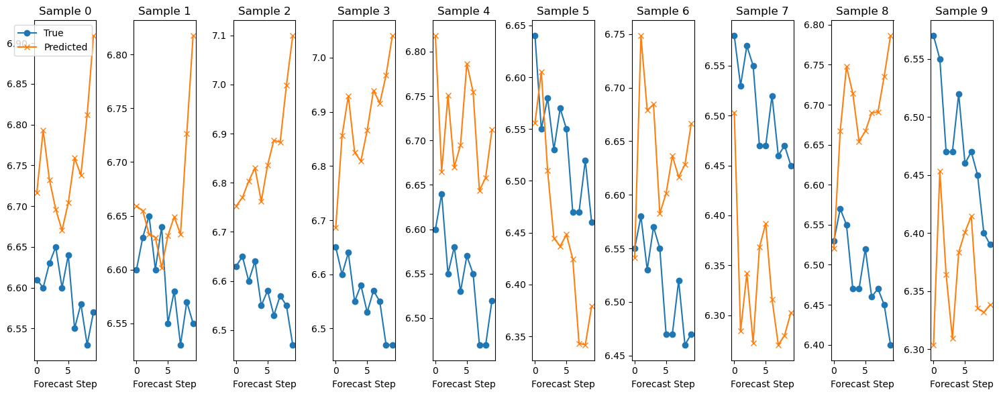

In [57]:

# Now you can use the plotting functions to visualize:
plot_predictions(targets_unscaled, preds_unscaled, num_samples=10)

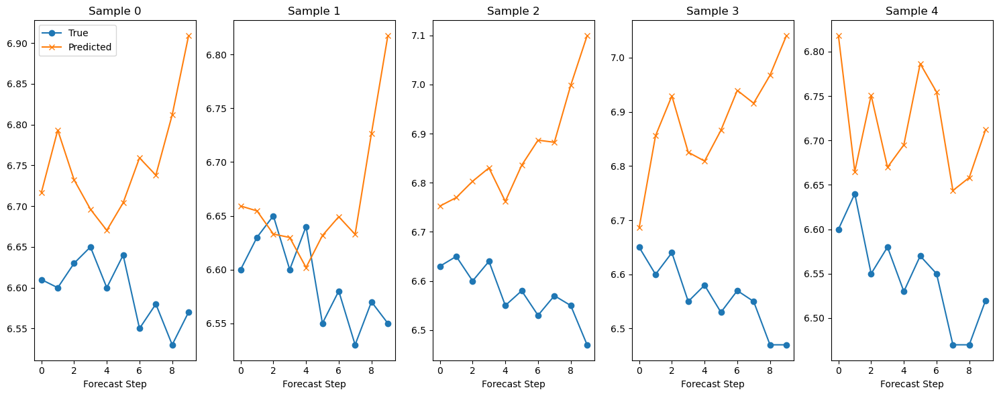

In [59]:
plot_predictions(targets_unscaled, preds_unscaled, num_samples=5)


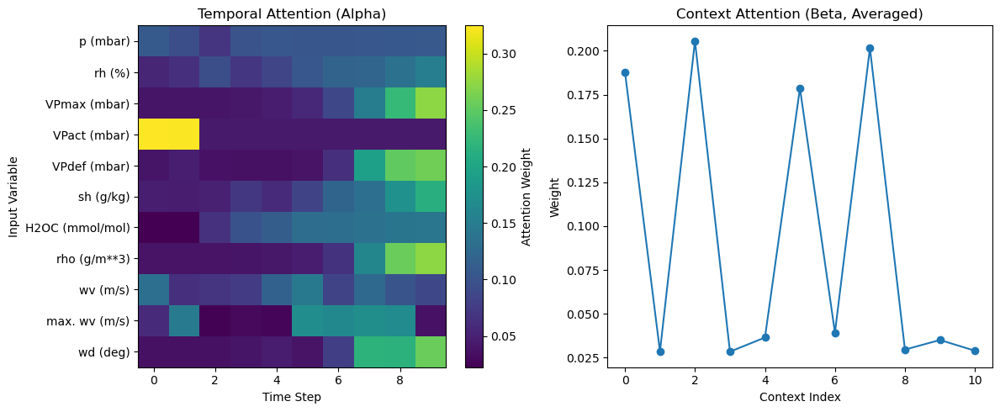

In [61]:
plot_attention_weights(alphas, betas, sample_idx=0, input_var_names=cols_weather_multi)


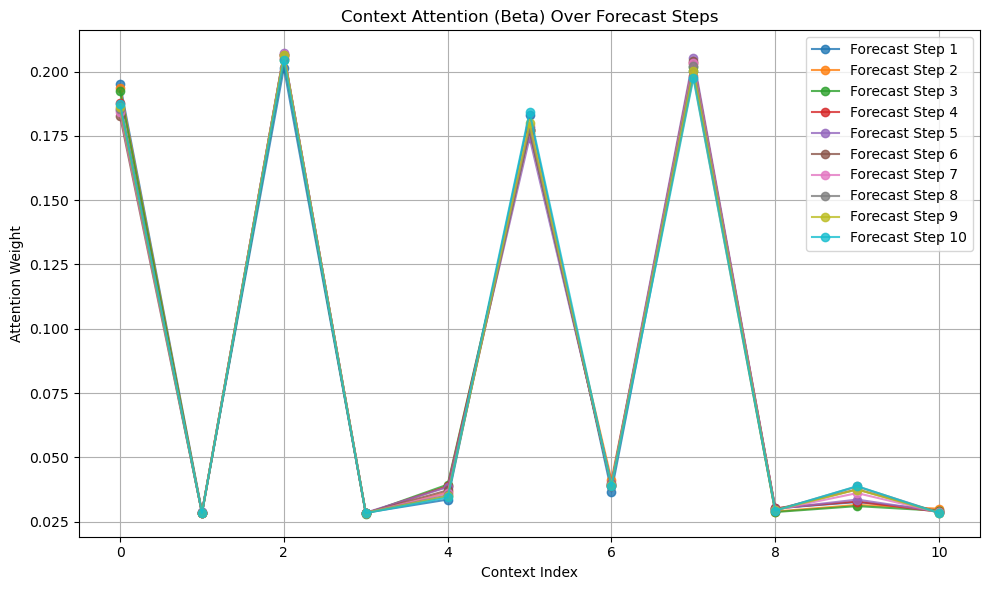

In [63]:
plot_beta_attention_over_forecast_steps(betas, sample_idx=0)


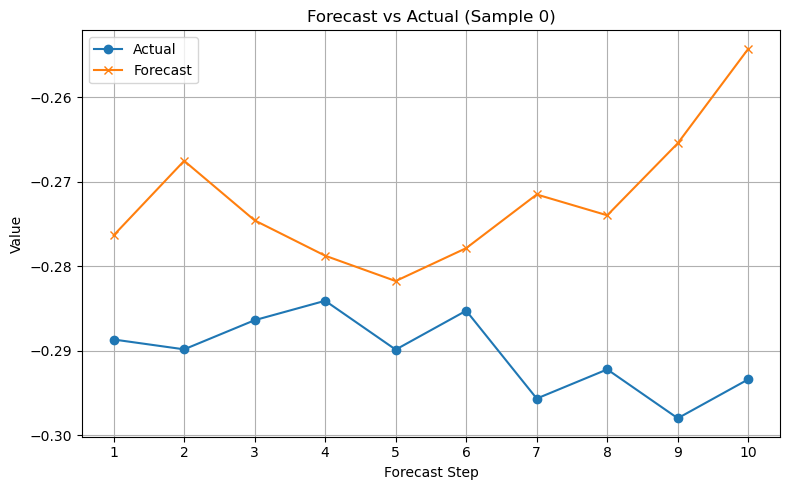

In [65]:
plot_forecast_vs_actual_per_step(predictions, targets, sample_idx=0)


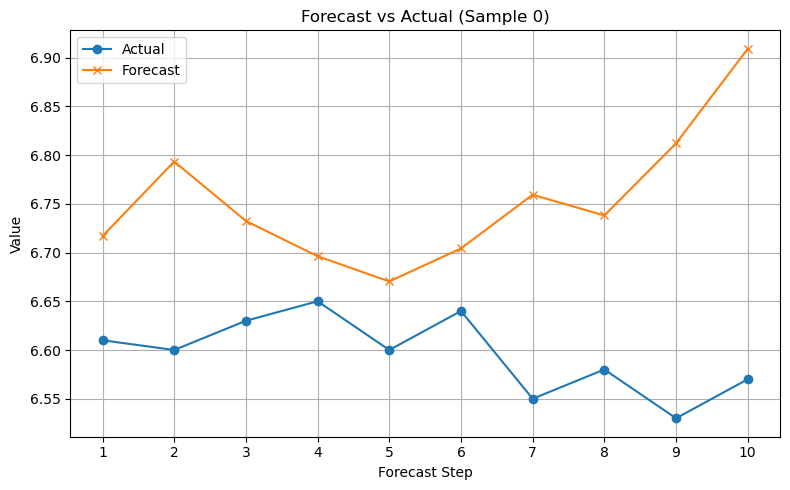

In [67]:
plot_forecast_vs_actual_per_step(preds_unscaled, targets_unscaled, sample_idx=0)

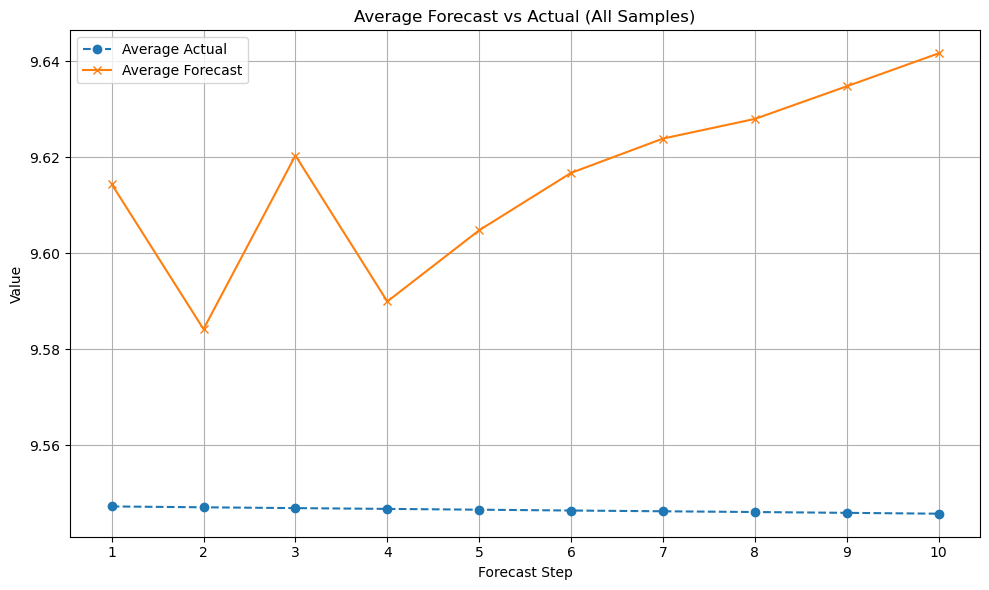

In [69]:
plot_average_forecast_vs_actual_per_step(preds_unscaled, targets_unscaled)


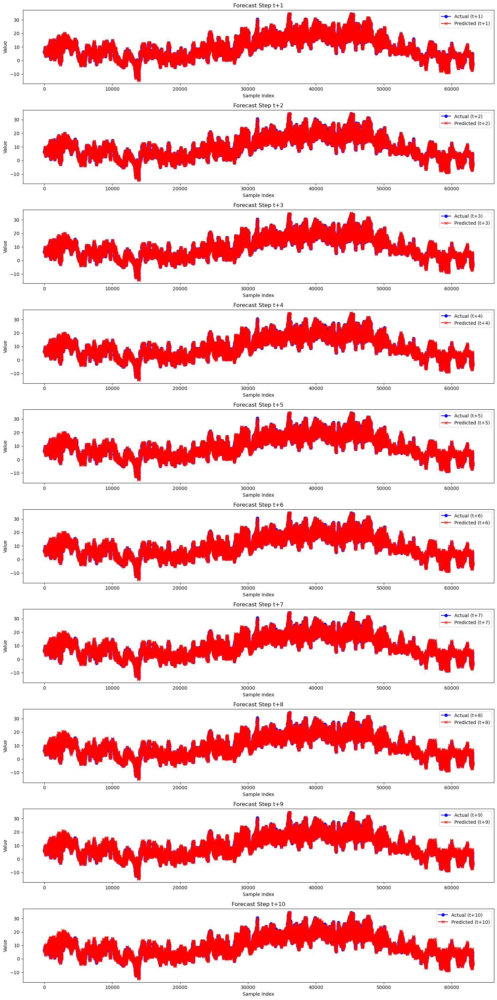

In [71]:
plot_forecast_steps(preds_unscaled, targets_unscaled, forecast_horizon=10)


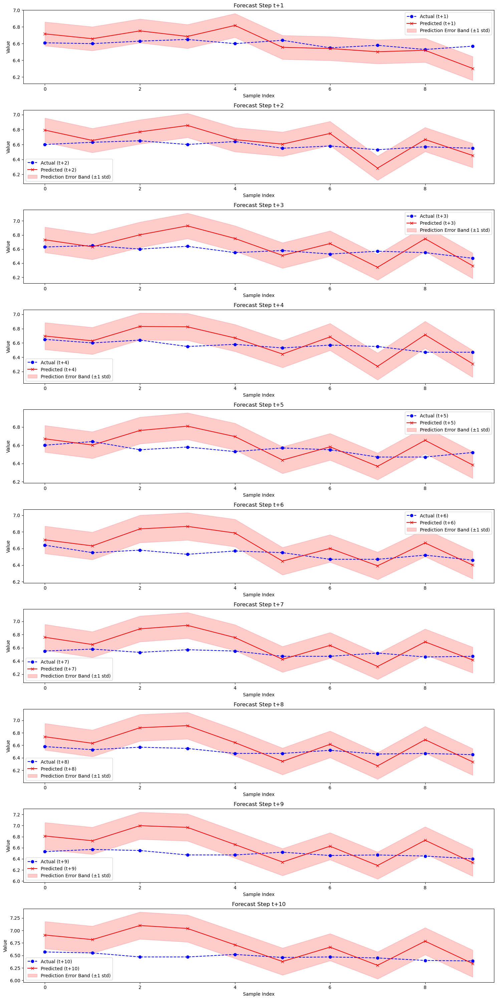

In [72]:
plot_forecast_steps_with_error_bands(preds_unscaled, targets_unscaled, forecast_horizon=10, subset_size=10)


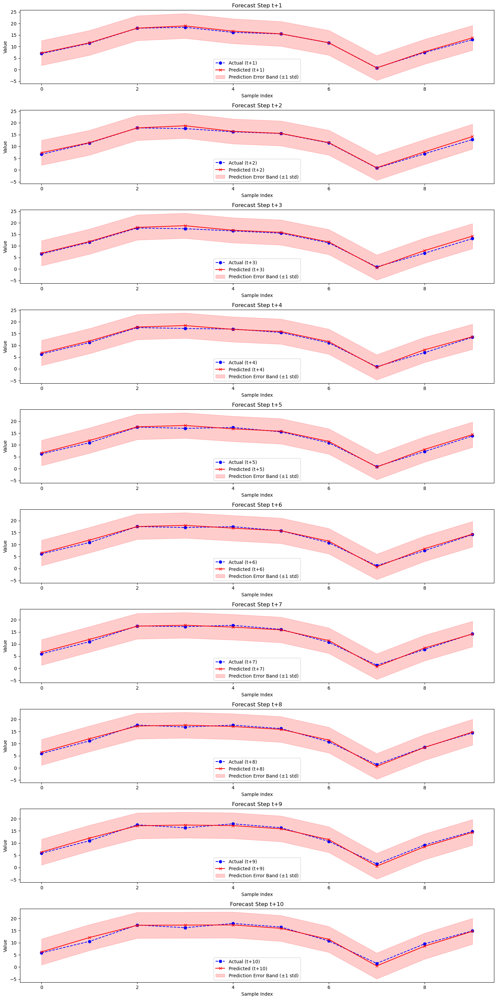

In [73]:
# Example 1: Randomly select 10 samples
plot_forecast_steps_with_error_bands(preds_unscaled, targets_unscaled, forecast_horizon=forecast_horizon, subset_size=10, random_subset=True)

# Example 2: Manually select specific samples
#plot_forecast_steps_with_error_bands(predictions, targets, forecast_horizon=5, subset_size=10, selected_indices=[0, 5, 10])

# Example 3: Select samples based on a condition (e.g., t+1 > 0.5)
#plot_forecast_steps_with_error_bands(predictions, targets, forecast_horizon=5, subset_size=10, threshold=0.5)


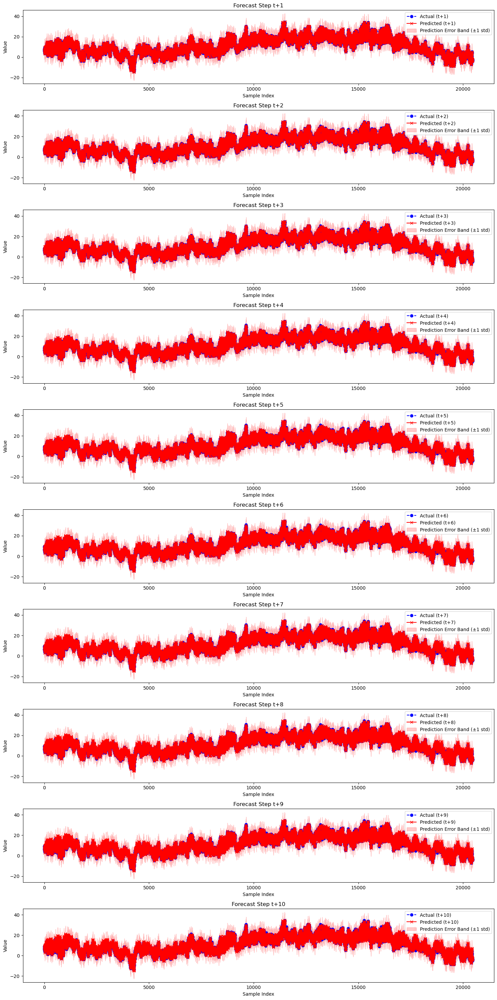

In [77]:
# Example 3: Select samples based on a condition (e.g., t+1 > 0.5)
plot_forecast_steps_with_error_bands_deviation(preds_unscaled, targets_unscaled, forecast_horizon=forecast_horizon, subset_size=10, deviation_threshold=0.5)


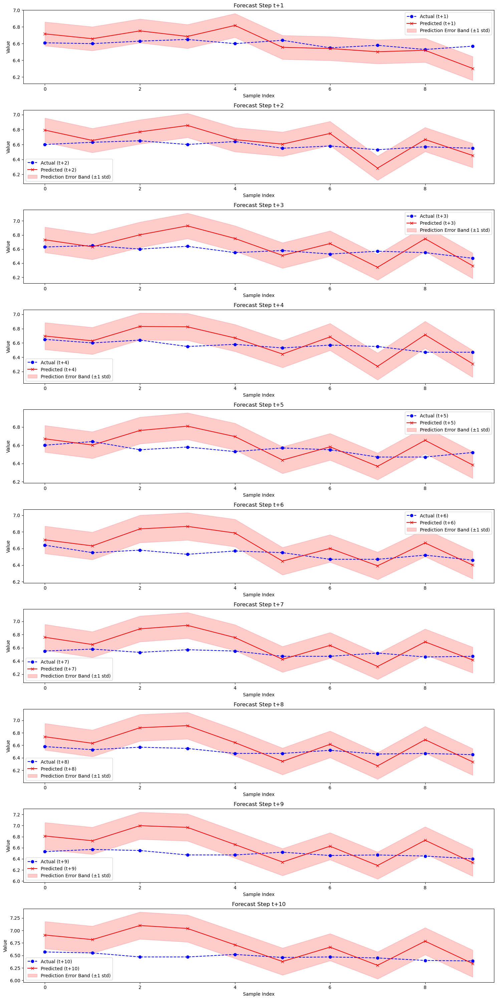

In [78]:
# Example 1: Plot only instances where the mean deviation across forecast steps exceeds 0.5
#plot_forecast_steps_with_error_bands(predictions, targets, forecast_horizon=5, subset_size=10, deviation_threshold=0.5)

# Example 2: Plot only instances where the mean deviation across forecast steps exceeds 1.0
plot_forecast_steps_with_error_bands(preds_unscaled, targets_unscaled, forecast_horizon=10, subset_size=10)


In [53]:
X_train_dele, y_train_dele, \
X_val_dele, y_val_dele, \
X_test_dele, y_test_dele, \
input_scaler_dele, target_scaler_dele = prepare_multistep_data(
    df=df,
    input_columns=cols_weather_multi,
    target_column=target_weather,
    input_window=14,
    forecast_horizon=10,
    scale_data=True
)


C:\Users\miche\Documents\IMV_LSTM\model_prep.py:59: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  X_multi[:, j, i] = df[col].shift(input_window - j - 1).fillna(method="bfill")
C:\Users\miche\Documents\IMV_LSTM\model_prep.py:63: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y_multi[:, step] = df[target_column].shift(-step - 1).fillna(method="ffill")


In [55]:
X_train_t_dele = torch.tensor(X_train_dele, dtype=torch.float32)
X_val_t_dele   = torch.tensor(X_val_dele, dtype=torch.float32)
X_test_t_dele  = torch.tensor(X_test_dele, dtype=torch.float32)

y_train_t_dele = torch.tensor(y_train_dele, dtype=torch.float32)
y_val_t_dele   = torch.tensor(y_val_dele, dtype=torch.float32)
y_test_t_dele  = torch.tensor(y_test_dele, dtype=torch.float32)


In [57]:
#2nd run
#depth_weather = 10
batch_size_dele = 128
#prediction_horizon_weather = 1
# Training, validation, and test DataLoaders for multistep forecasting
train_loader_dele = DataLoader(
    TensorDataset(X_train_t_dele, y_train_t_dele),
    shuffle=True,
    batch_size=batch_size_dele
)

val_loader_dele = DataLoader(
    TensorDataset(X_val_t_dele, y_val_t_dele),
    shuffle=False,
    batch_size=batch_size_dele
)

test_loader_dele = DataLoader(
    TensorDataset(X_test_t_dele, y_test_t_dele),
    shuffle=False,
    batch_size=batch_size_dele
)

In [133]:
def evaluate_model_dele(model, test_loader, forecast_steps, target_scaler, device):
    model.eval()
    all_preds = []
    all_targets = []

    with torch.no_grad():
        for x, y in test_loader:
            x, y = x.to(device), y.to(device)

            pred, _, _ = model(x, device)
            pred = pred[:, -forecast_steps:, 0]  # shape: [batch_size, forecast_steps]

            all_preds.append(pred.cpu())
            all_targets.append(y.cpu())

    # Concatenate all batches
    all_preds = torch.cat(all_preds, dim=0)
    all_targets = torch.cat(all_targets, dim=0)

    # Inverse transform the scaled data
    all_preds_unscaled = inverse_scale_predictions(all_preds, target_scaler)
    all_targets_unscaled = inverse_scale_predictions(all_targets, target_scaler)

    # Compute metrics
    mse = mean_squared_error(all_targets_unscaled, all_preds_unscaled)
    mae = mean_absolute_error(all_targets_unscaled, all_preds_unscaled)
    rmse = np.sqrt(mse)

    print(f"Evaluation Metrics on Unscaled Test Data:")
    print(f"MAE:  {mae:.4f}")
    print(f"RMSE: {rmse:.4f}")

    return all_preds_unscaled, all_targets_unscaled

In [75]:
import torch

# Example params (you need to adjust based on your input data)
Delelstm_params = {
    'input_dim': X_train_t_dele.shape[2],     # e.g. number of variables in input data
    'n_units': 64,                 # hidden size for tensor LSTM
    'time_depth':X_train_t_dele.shape[1],  # how many time steps input has
    'output_dim': 1,               # typically 1 for forecasting a single variable
    'N_units': 64                  # hidden size for vanilla LSTM
}

short = 2  # or another appropriate threshold used in your logic

# Instantiate the model
model_delelstm = Delelstm(Delelstm_params, short)


In [77]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_delelstm.to(device)

optimizer_delelstm = torch.optim.Adam(model_delelstm.parameters(), lr=0.001)
criterion_delelstm = torch.nn.MSELoss()  # or MAE, depending on your metric


In [67]:
 X_train_t_dele.shape[1]

14

In [81]:
from tqdm import tqdm
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

num_epochs = 30
forecast_steps = 10

for epoch in range(num_epochs):
    model_delelstm.train()
    total_loss = 0
    all_preds = []
    all_targets = []

    loop = tqdm(train_loader_dele, desc=f"Epoch {epoch+1}/{num_epochs}", leave=False)
    
    for x, y in loop:
        x, y = x.to(device), y.to(device)
        optimizer_delelstm.zero_grad()

        pred, unorm, _ = model_delelstm(x, device)
        pred = pred[:, -forecast_steps:, 0]  # [batch_size, forecast_steps]

        loss = criterion_delelstm(pred, y)
        loss.backward()
        optimizer_delelstm.step()

        total_loss += loss.item()
        
        # Collect predictions and targets for metrics
        all_preds.append(pred.detach().cpu().numpy())
        all_targets.append(y.detach().cpu().numpy())

        loop.set_postfix(loss=loss.item())

    # Compute metrics
    all_preds = np.concatenate(all_preds, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)

    mae = mean_absolute_error(all_targets, all_preds)
    rmse = mean_squared_error(all_targets, all_preds, squared=False)

    print(f"Epoch {epoch+1} | Loss: {total_loss:.4f} | MAE: {mae:.4f} | RMSE: {rmse:.4f}")


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 1 | Loss: 42.1472 | MAE: 0.0967 | RMSE: 0.1353


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 2 | Loss: 40.4685 | MAE: 0.0946 | RMSE: 0.1326


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 3 | Loss: 39.3597 | MAE: 0.0932 | RMSE: 0.1307


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 4 | Loss: 38.3001 | MAE: 0.0920 | RMSE: 0.1289


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 5 | Loss: 37.5756 | MAE: 0.0912 | RMSE: 0.1277


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 6 | Loss: 36.8148 | MAE: 0.0903 | RMSE: 0.1264


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 7 | Loss: 36.1026 | MAE: 0.0895 | RMSE: 0.1252


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 8 | Loss: 35.4698 | MAE: 0.0888 | RMSE: 0.1240


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 9 | Loss: 34.8628 | MAE: 0.0882 | RMSE: 0.1230


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 10 | Loss: 34.3554 | MAE: 0.0876 | RMSE: 0.1221


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 11 | Loss: 33.8318 | MAE: 0.0870 | RMSE: 0.1211


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 12 | Loss: 33.2964 | MAE: 0.0864 | RMSE: 0.1201


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 13 | Loss: 32.7869 | MAE: 0.0858 | RMSE: 0.1192


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 14 | Loss: 32.3485 | MAE: 0.0854 | RMSE: 0.1184


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 15 | Loss: 31.9099 | MAE: 0.0849 | RMSE: 0.1175


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 16 | Loss: 31.4485 | MAE: 0.0844 | RMSE: 0.1167


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 17 | Loss: 31.0331 | MAE: 0.0839 | RMSE: 0.1159


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 18 | Loss: 30.6655 | MAE: 0.0835 | RMSE: 0.1152


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 19 | Loss: 30.2825 | MAE: 0.0830 | RMSE: 0.1144


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 20 | Loss: 29.9291 | MAE: 0.0826 | RMSE: 0.1137


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 21 | Loss: 29.5386 | MAE: 0.0821 | RMSE: 0.1129


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 22 | Loss: 29.2378 | MAE: 0.0818 | RMSE: 0.1123


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 23 | Loss: 28.9198 | MAE: 0.0814 | RMSE: 0.1117


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 24 | Loss: 28.6427 | MAE: 0.0811 | RMSE: 0.1111


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 25 | Loss: 28.3398 | MAE: 0.0807 | RMSE: 0.1105


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 26 | Loss: 28.0491 | MAE: 0.0803 | RMSE: 0.1099


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 27 | Loss: 27.8267 | MAE: 0.0800 | RMSE: 0.1095


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 28 | Loss: 27.5022 | MAE: 0.0796 | RMSE: 0.1088


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 29 | Loss: 27.2784 | MAE: 0.0793 | RMSE: 0.1083


Epoch 30 | Loss: 27.0659 | MAE: 0.0791 | RMSE: 0.1079


C:\Users\miche\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [123]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

forecast_steps = 10
model_delelstm.eval()

all_preds = []
all_targets = []

with torch.no_grad():
    for x_test, y_test in test_loader_dele:
        x_test, y_test = x_test.to(device), y_test.to(device)

        pred, _, _ = model_delelstm(x_test, device)
        pred = pred[:, -forecast_steps:, 0]  # same slicing as training

        all_preds.append(pred.cpu().numpy())
        all_targets.append(y_test.cpu().numpy())

# Convert to numpy arrays
all_preds = np.concatenate(all_preds, axis=0)
all_targets = np.concatenate(all_targets, axis=0)

# Compute metrics
mse = mean_squared_error(all_targets, all_preds)
mae = mean_absolute_error(all_targets, all_preds)
rmse = np.sqrt(mse)

print(f"\n📊 Test Metrics:")
print(f"  - MAE:  {mae:.4f}")
print(f"  - RMSE: {rmse:.4f}")



📊 Test Metrics:
  - MAE:  0.0989
  - RMSE: 0.1374


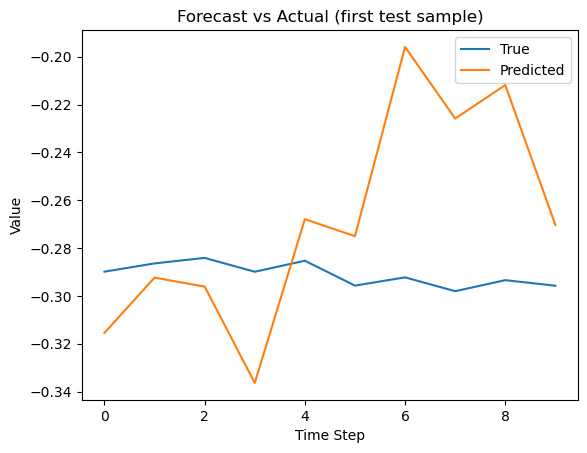

In [125]:
import matplotlib.pyplot as plt

# Plot the first sample in the test set
plt.plot(all_targets[0], label='True')
plt.plot(all_preds[0], label='Predicted')
plt.title("Forecast vs Actual (first test sample)")
plt.xlabel("Time Step")
plt.ylabel("Value")
plt.legend()
plt.show()


In [137]:
all_preds_unscaled, all_targets_unscaled = evaluate_model_dele(
    model_delelstm,
    test_loader_dele,
    forecast_steps=10,
    target_scaler=target_scaler_dele,
    device=device
)


Original shape: (63080, 10)
No squeezing needed, shape is: (63080, 10)
Reshaped for inverse transform: (63080, 10)
Shape after inverse transform: (63080, 10)
Original shape: (63080, 10)
No squeezing needed, shape is: (63080, 10)
Reshaped for inverse transform: (63080, 10)
Shape after inverse transform: (63080, 10)
Evaluation Metrics on Unscaled Test Data:
MAE:  0.8558
RMSE: 1.1890


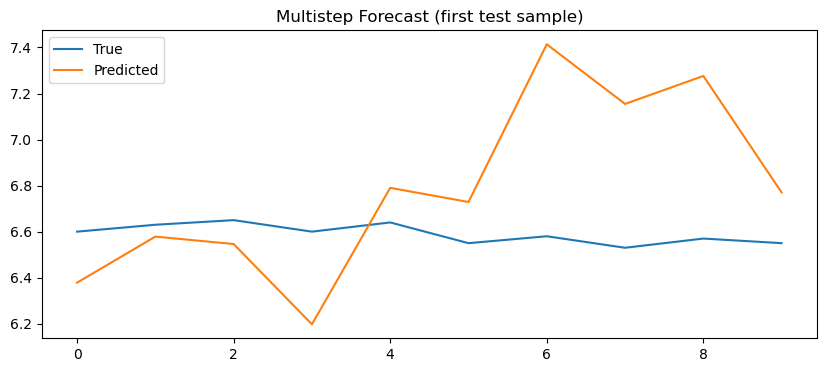

In [139]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4))
plt.plot(all_targets_unscaled[0], label="True")
plt.plot(all_preds_unscaled[0], label="Predicted")
plt.title("Multistep Forecast (first test sample)")
plt.legend()
plt.show()


# Evaluation 

In [91]:
from scipy.stats import spearmanr
import copy

def randomization_sanity_check(model, data_loader, device=device):
    model_random = copy.deepcopy(model).to(device)

    # Randomize model weights
    for param in model_random.parameters():
        if param.requires_grad:
            torch.nn.init.normal_(param, mean=0, std=0.1)

    model.eval()
    model_random.eval()

    similarities_alpha = []
    similarities_beta = []

    with torch.no_grad():
        for x_batch, _ in data_loader:
            x_batch = x_batch.to(device)

            _, alpha_orig, beta_orig = model(x_batch)
            _, alpha_rand, beta_rand = model_random(x_batch)

            # Flatten
            alpha_orig = alpha_orig.reshape(-1).to(device).numpy()
            alpha_rand = alpha_rand.reshape(-1).to(device).numpy()
            beta_orig = beta_orig.reshape(-1).to(device).numpy()
            beta_rand = beta_rand.reshape(-1).to(device).numpy()

            # Compute Spearman similarity
            s_alpha, _ = spearmanr(alpha_orig, alpha_rand)
            s_beta, _ = spearmanr(beta_orig, beta_rand)

            similarities_alpha.append(s_alpha)
            similarities_beta.append(s_beta)

    print(f"Avg Spearman alpha similarity: {sum(similarities_alpha)/len(similarities_alpha):.4f}")
    print(f"Avg Spearman beta similarity:  {sum(similarities_beta)/len(similarities_beta):.4f}")


In [101]:
def deletion_check(model, data_loader, k_ratio=0.1, use='alpha', device=device):
    model.eval()
    criterion = nn.MSELoss()
    errors_full, errors_deleted = [], []

    with torch.no_grad():
        for x_batch, y_batch in data_loader:
            x_batch = x_batch.to(device)
            y_batch = y_batch.to(device)

            forecasts, alphas, betas = model(x_batch)
            loss_full = criterion(forecasts.squeeze(-1), y_batch)
            errors_full.append(loss_full.item())

            # Determine importance
            if use == 'alpha':
                importance = alphas.mean(dim=1)  # average across time: [batch, vars, units=1]
            elif use == 'beta':
                importance = betas.mean(dim=(1, 2))  # average over steps and units
            else:
                raise ValueError("use must be 'alpha' or 'beta'")

            importance_scores = importance.detach().to(device).numpy()
            x_batch_mod = x_batch.clone()

            for i in range(x_batch.size(0)):
                imp = importance_scores[i]
                topk = int(len(imp) * k_ratio)
                topk_idx = imp.argsort()[-topk:]
                x_batch_mod[i, :, topk_idx] = 0.0  # zero out top-k variables

            forecasts_mod, _, _ = model(x_batch_mod)
            loss_deleted = criterion(forecasts_mod.squeeze(-1), y_batch)
            errors_deleted.append(loss_deleted.item())

    print(f"Original Avg Loss: {sum(errors_full)/len(errors_full):.4f}")
    print(f"After Deletion Avg Loss: {sum(errors_deleted)/len(errors_deleted):.4f}")


In [103]:
import torch
import numpy as np

def random_deletion_sanity_check(model, data_loader, top_k=3, device='cuda'):
    model.eval()
    model.to(device)
    criterion = nn.MSELoss()
    total_loss = 0.0

    with torch.no_grad():
        for x_batch, y_batch in data_loader:
            x_batch, y_batch = x_batch.to(device), y_batch.to(device)

            # Randomly select top_k variable indices per batch
            batch_size, seq_len, input_dim = x_batch.shape
            mask = torch.ones_like(x_batch)

            for i in range(batch_size):
                random_vars = torch.randperm(input_dim)[:top_k]
                mask[i, :, random_vars] = 0  # zero out random variables

            x_deleted = x_batch * mask  # apply mask
            forecasts, _, _ = model(x_deleted)
            loss = criterion(forecasts.squeeze(-1), y_batch)
            total_loss += loss.item()

    avg_loss = total_loss / len(data_loader)
    print(f"🔀 Random Deletion Avg Loss: {avg_loss:.4f}")
    return avg_loss


In [105]:
model_IMV

IMVTensorMultiStepLSTM(
  (F_beta): RecursiveScriptModule(original_name=Linear)
  (Phi): RecursiveScriptModule(original_name=Linear)
  (input_projector): RecursiveScriptModule(original_name=Linear)
)

In [97]:
# After training
#randomization_sanity_check(model_inter, test_loader_multi)

randomization_sanity_check(model_IMV, test_loader_multi)

C:\Users\miche\anaconda3\Lib\site-packages\torch\nn\modules\module.py:938: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the .grad field to be populated for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\build\aten\src\ATen/core/TensorBody.h:494.)
  param_grad = param.grad


Avg Spearman alpha similarity: -0.0800
Avg Spearman beta similarity:  0.3514


Alpha attention (temporal variable importance) has very low similarity to a random model → this suggests your model has learned meaningful temporal patterns.

Beta attention (variable-level forecasting importance) has some structure, but moderate similarity suggests it may still be influenced by spurious patterns or has weaker interpretability than alpha.

In [107]:
#deletion_check(model_inter, test_loader_multi, k_ratio=0.2, use='alpha')  # or use='beta'
deletion_check(model_IMV, test_loader_multi, k_ratio=0.2, use='alpha')  # or use='beta'

Original Avg Loss: 0.0066
After Deletion Avg Loss: 0.0200


In [108]:
deletion_check(model_IMV, test_loader_multi, k_ratio=0.2, use='beta')  # or use='beta'

Original Avg Loss: 0.0066
After Deletion Avg Loss: 0.0200


In [109]:
#random_deletion_sanity_check(model_inter, test_loader_multi, top_k=3, device=device)
random_deletion_sanity_check(model_IMV, test_loader_multi, top_k=3, device=device)

🔀 Random Deletion Avg Loss: 0.1225


0.1224607304565072

| Scenario            | Avg Loss | Interpretation                                                       |
| ------------------- | -------- | -------------------------------------------------------------------- |
| **Original**        | `0.0107` | Normal test loss using the model with learned attention weights.     |
| **After Deletion**  | `0.0129` | Loss after **removing** (zeroing or masking) top-attended variables. |
| **Random Deletion** | `0.0925` | Loss after **randomly** removing variables (not based on attention). |
1. Deletion Check Validity
Deleting top-attended variables increased the loss slightly (0.0107 → 0.0129).

Random deletions increased the loss significantly (0.0107 → 0.0925).

This suggests:

The model indeed relies more heavily on variables it gives high attention to.

But deleting them doesn't cause catastrophic failure → possibly due to redundancy in your input features (other variables can partially compensate).

2. Trustworthiness of Attention
The fact that attention-guided deletion hurts performance less than random deletion shows that attention is pointing to genuinely important variables.

If deleting top-attended variables had no effect, the attention would be untrustworthy.

If deleting them caused massive degradation, it might mean your model is overly reliant on just a few variables.

# Visualisation of Evaluation

In [113]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_alpha_heatmap(alphas, var_names=None, title="Alpha Attention Heatmap"):
    # alphas shape: [batch, time, input_dim, 1] → squeeze last dim
    alpha_vals = alphas.squeeze(-1).mean(dim=0).detach().to(device).numpy()  # [time, input_dim]
    
    plt.figure(figsize=(10, 6))
    sns.heatmap(alpha_vals.T, cmap="YlGnBu", xticklabels=True, yticklabels=var_names if var_names else True)
    plt.xlabel("Time Step")
    plt.ylabel("Variable")
    plt.title(title)
    plt.tight_layout()
    plt.show()


In [115]:
def plot_beta_heatmap(betas, var_names=None, title="Beta Attention Heatmap"):
    # betas shape: [batch, forecast_steps, input_dim, 1] → squeeze and average
    beta_vals = betas.squeeze(-1).mean(dim=0).detach().to(device).numpy()  # [forecast_steps, input_dim]

    plt.figure(figsize=(10, 6))
    sns.heatmap(beta_vals.T, cmap="OrRd", xticklabels=True, yticklabels=var_names if var_names else True)
    plt.xlabel("Forecast Step")
    plt.ylabel("Variable")
    plt.title(title)
    plt.tight_layout()
    plt.show()


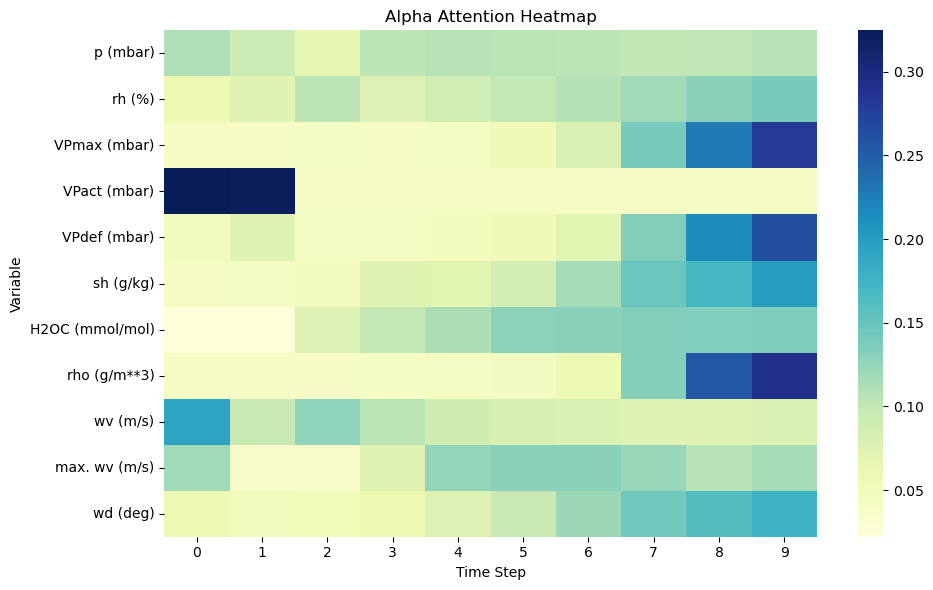

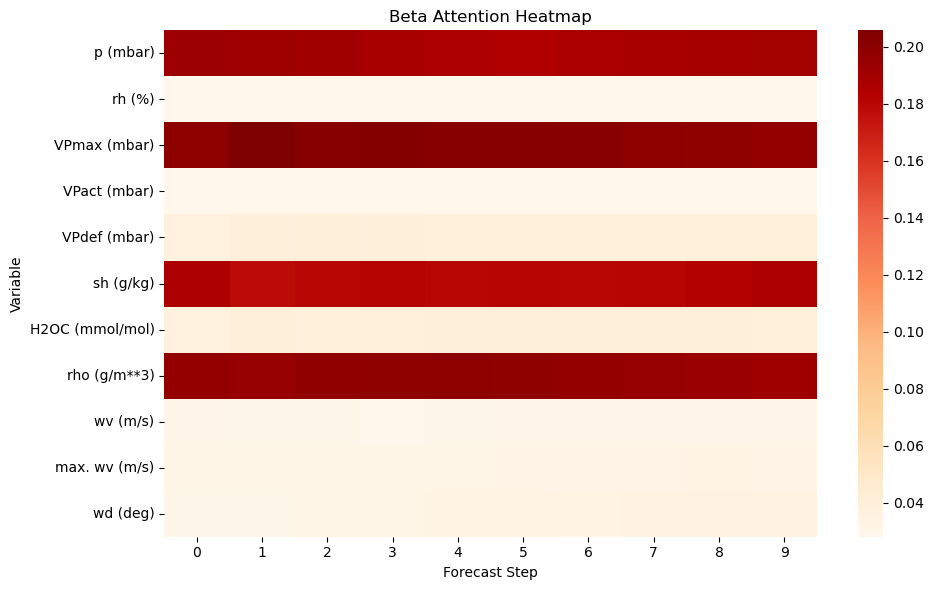

In [119]:
# Forward pass on a test batch
x_batch, _ = next(iter(test_loader_multi))
x_batch = x_batch.to(device)
_, alphas, betas = model_IMV(x_batch)

plot_alpha_heatmap(alphas, var_names=cols_weather_multi)
plot_beta_heatmap(betas, var_names=cols_weather_multi)


In [261]:
cols_weather_multi

['p (mbar)',
 'rh (%)',
 'VPmax (mbar)',
 'VPact (mbar)',
 'VPdef (mbar)',
 'sh (g/kg)',
 'H2OC (mmol/mol)',
 'rho (g/m**3)',
 'wv (m/s)',
 'max. wv (m/s)',
 'wd (deg)']

In [130]:
import torch
import numpy as np
from scipy.stats import spearmanr
from torch.nn.functional import mse_loss

def evaluate_stability_fidelity(model, data_loader, device='cpu', epsilon=1e-2):
    model.eval()
    stability_scores = []
    fidelity_scores = []

    with torch.no_grad():
        for x_batch, _ in data_loader:
            x_batch = x_batch.to(device)

            # Original predictions and explanations
            preds_orig, alphas_orig, _ = model(x_batch)

            # Perturb input slightly
            noise = torch.randn_like(x_batch) * epsilon
            x_perturbed = x_batch + noise

            # Perturbed predictions and explanations
            preds_perturbed, alphas_perturbed, _ = model(x_perturbed)

            # ========== Stability: Spearman similarity between alphas ==========
            for alpha_o, alpha_p in zip(alphas_orig, alphas_perturbed):
                s, _ = spearmanr(alpha_o.cpu().numpy().flatten(), alpha_p.cpu().numpy().flatten())
                if not np.isnan(s):  # Filter out NaNs from constant vectors
                    stability_scores.append(s)

            # ========== Fidelity: MSE between predictions ==========
            fidelity = mse_loss(preds_orig, preds_perturbed).item()
            fidelity_scores.append(fidelity)

    print(f"Avg Stability (Spearman): {np.mean(stability_scores):.4f}")
    print(f"Avg Fidelity (MSE):       {np.mean(fidelity_scores):.6f}")


In [134]:
# Run on your test/val loader
evaluate_stability_fidelity(model_IMV, test_loader_multi, device=device,epsilon=1e-1)


Avg Stability (Spearman): 0.8304
Avg Fidelity (MSE):       0.017735


In [136]:
import torch
import numpy as np
from scipy.stats import spearmanr
from sklearn.metrics.pairwise import cosine_similarity

def evaluate_similarity_at_epsilon(model, data_loader, epsilon, device='cpu'):
    model.eval()
    spearman_scores = []
    cosine_scores = []

    with torch.no_grad():
        for x_batch, _ in data_loader:
            x_batch = x_batch.to(device)

            # Original explanations (alphas)
            _, alphas_orig, _ = model(x_batch)

            # Perturb inputs
            noise = torch.randn_like(x_batch) * epsilon
            x_perturbed = x_batch + noise

            # Perturbed explanations
            _, alphas_perturbed, _ = model(x_perturbed)

            # Compare each example in batch
            for alpha_o, alpha_p in zip(alphas_orig, alphas_perturbed):
                alpha_o_np = alpha_o.cpu().numpy().flatten()
                alpha_p_np = alpha_p.cpu().numpy().flatten()

                # Spearman
                s, _ = spearmanr(alpha_o_np, alpha_p_np)
                if not np.isnan(s):
                    spearman_scores.append(s)

                # Cosine similarity requires 2D arrays: reshape (1, -1)
                cos_sim = cosine_similarity(alpha_o_np.reshape(1, -1), alpha_p_np.reshape(1, -1))[0][0]
                cosine_scores.append(cos_sim)

    return np.mean(spearman_scores), np.mean(cosine_scores)


In [138]:
import matplotlib.pyplot as plt

epsilons = np.linspace(0, 0.2, 21)  # from 0 to 0.2 in 0.01 steps
spearman_means = []
cosine_means = []

for e in epsilons:
    sp, cs = evaluate_similarity_at_epsilon(model_IMV, test_loader_multi, epsilon=e, device=device)
    spearman_means.append(sp)
    cosine_means.append(cs)
    print(f"Epsilon={e:.3f}: Spearman={sp:.4f}, Cosine={cs:.4f}")


Epsilon=0.000: Spearman=1.0000, Cosine=1.0000
Epsilon=0.010: Spearman=0.9951, Cosine=0.9987
Epsilon=0.020: Spearman=0.9833, Cosine=0.9950
Epsilon=0.030: Spearman=0.9666, Cosine=0.9893
Epsilon=0.040: Spearman=0.9477, Cosine=0.9827
Epsilon=0.050: Spearman=0.9279, Cosine=0.9759
Epsilon=0.060: Spearman=0.9074, Cosine=0.9689
Epsilon=0.070: Spearman=0.8870, Cosine=0.9619
Epsilon=0.080: Spearman=0.8675, Cosine=0.9554
Epsilon=0.090: Spearman=0.8486, Cosine=0.9492
Epsilon=0.100: Spearman=0.8305, Cosine=0.9431
Epsilon=0.110: Spearman=0.8135, Cosine=0.9375
Epsilon=0.120: Spearman=0.7967, Cosine=0.9319
Epsilon=0.130: Spearman=0.7813, Cosine=0.9268
Epsilon=0.140: Spearman=0.7659, Cosine=0.9219
Epsilon=0.150: Spearman=0.7520, Cosine=0.9173
Epsilon=0.160: Spearman=0.7379, Cosine=0.9127
Epsilon=0.170: Spearman=0.7255, Cosine=0.9085
Epsilon=0.180: Spearman=0.7130, Cosine=0.9043
Epsilon=0.190: Spearman=0.7006, Cosine=0.9003
Epsilon=0.200: Spearman=0.6895, Cosine=0.8966


In [269]:
def plot_interaction_heatmap(interactions, var_names=None, title="Variable Interaction Heatmap"):
    # interactions shape: [batch, time, input_dim, input_dim]
    # Average over batch and time for a summary heatmap
    interaction_avg = interactions.mean(dim=0).mean(dim=0).detach().to(device).numpy()  # [input_dim, input_dim]

    plt.figure(figsize=(10, 8))
    sns.heatmap(
        interaction_avg,
        cmap="coolwarm",
        xticklabels=var_names if var_names else True,
        yticklabels=var_names if var_names else True,
        square=True,
        annot=True,  # Optional: show numbers in cells
        fmt=".2f"
    )
    plt.title(title)
    plt.xlabel("Variable (Key)")
    plt.ylabel("Variable (Query)")
    plt.show()


In [273]:
forecasts, alphas, betas, interaction_weights = model_inter(x_batch)


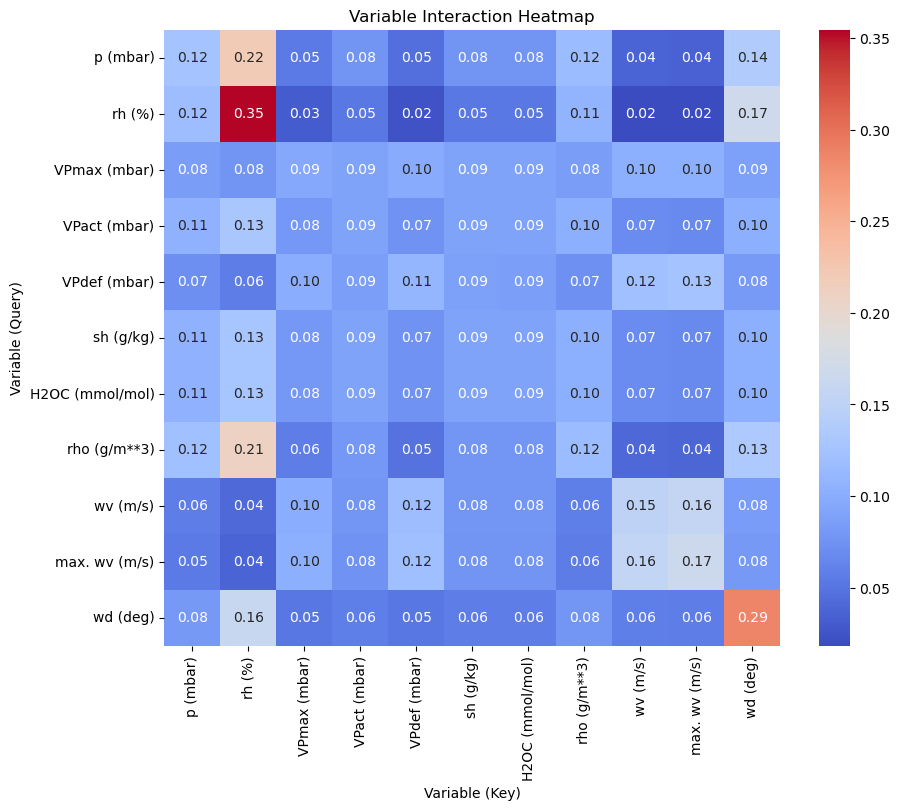

In [275]:
plot_interaction_heatmap(interaction_weights, var_names=cols_weather_multi)


What does the interaction heatmap show?
The heatmap visualizes learned interaction weights between variables at each time step.

Each cell (i, j) represents the strength of interaction from variable j to variable i as learned by your attention mechanism.

Values are usually normalized attention scores or learned weights indicating how much one variable influences another in the model’s internal state.

Why are diagonal values not 1?
Not a simple correlation or identity matrix:
The interaction weights are learned parameters, not raw correlation coefficients or similarity scores. They are attention scores that reflect relative importance or influence rather than a strict self-correlation.

Values are normalized:
Attention scores (like your alphas or interaction matrix) are often normalized with softmax or a similar function. This means the sum across a row or column may be 1, but individual values won’t necessarily be 1.

Diagonal isn’t forced to be 1:
Unlike correlation matrices where the diagonal is 1 by definition (variable perfectly correlated with itself), attention weights don’t have to be maximal on the diagonal. The model can learn that some variables might be more influenced by other variables than by themselves at certain time steps.

Scale depends on the model’s learned patterns:
If the diagonal is lower than 1, it might mean the model found other variables more informative or that self-interaction is not as dominant.

How to interpret values like 0.02 to 0.35?
Values closer to 0 mean weak or no interaction between those variables.

Higher values (like 0.3-0.35) indicate stronger learned influence.

Check if rows sum to 1 (or close), which is typical with attention weights — the heatmap shows relative importance.

Additional tips:
Compare interactions over time: If your interaction weights have a time dimension, look at how these weights evolve.

Interpret in context: High interaction weight from variable A to B means the model is using variable A’s info when updating variable B’s hidden state or prediction at that step.

Plot diagonal separately if needed: To see self-influence more clearly.

In [277]:
# interaction_weights shape: [batch, time, input_dim, input_dim]
avg_interactions_time = interaction_weights.mean(dim=0)  # shape: [time, input_dim, input_dim]


<Figure size 800x600 with 0 Axes>

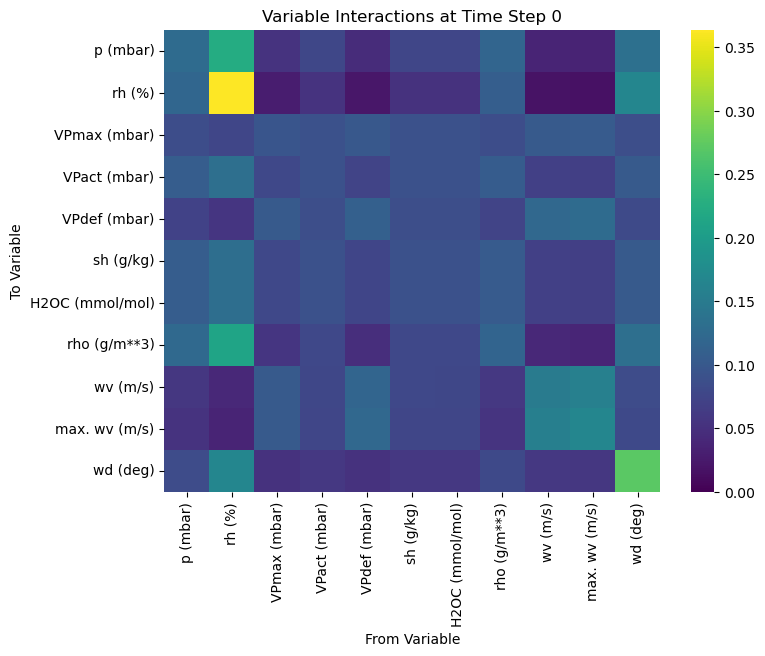

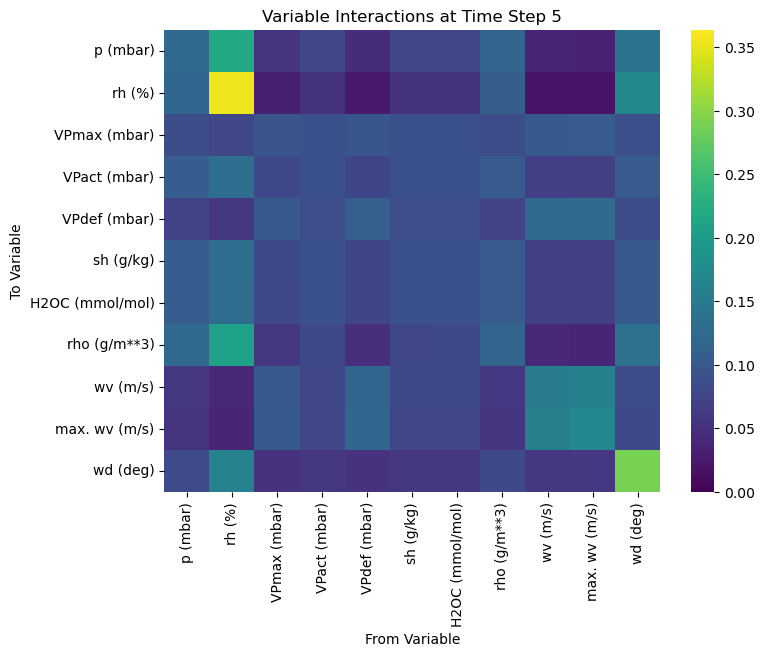

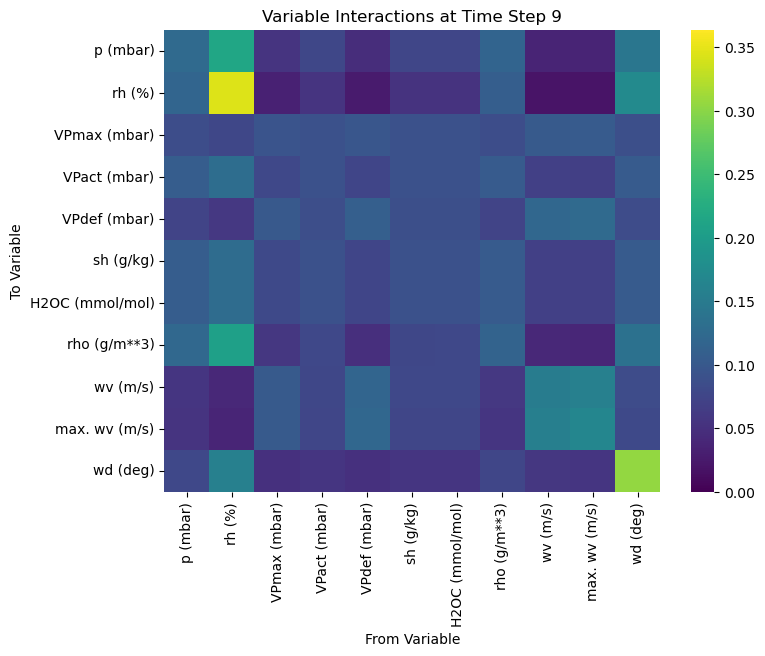

In [281]:
import matplotlib.pyplot as plt
import seaborn as sns

time_steps_to_plot = [0, 5, 9]  # example timesteps

for t in time_steps_to_plot:
    plt.figure(figsize=(8, 6))
    sns.heatmap(avg_interactions_time[t].cpu().detach().numpy(), 
                xticklabels=cols_weather_multi, yticklabels=cols_weather_multi,
                cmap="viridis", vmin=0, vmax=avg_interactions_time.max().item())
    plt.title(f"Variable Interactions at Time Step {t}")
    plt.xlabel("From Variable")
    plt.ylabel("To Variable")
    plt.show()


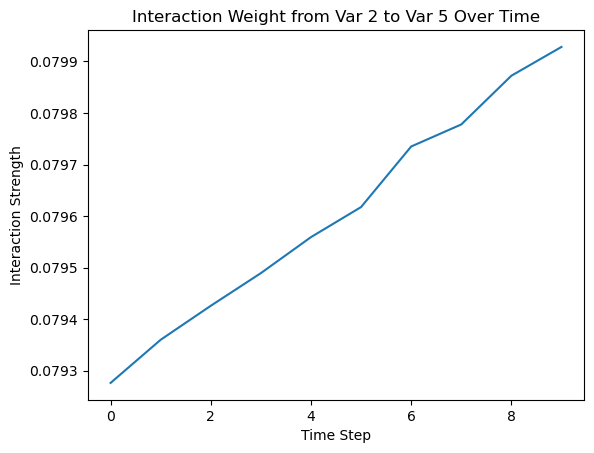

In [283]:
# For example, interaction from variable 2 to variable 5 over time
var_from, var_to = 2, 5
interaction_over_time = avg_interactions_time[:, var_to, var_from].cpu().detach().numpy()

plt.plot(interaction_over_time)
plt.title(f"Interaction Weight from Var {var_from} to Var {var_to} Over Time")
plt.xlabel("Time Step")
plt.ylabel("Interaction Strength")
plt.show()


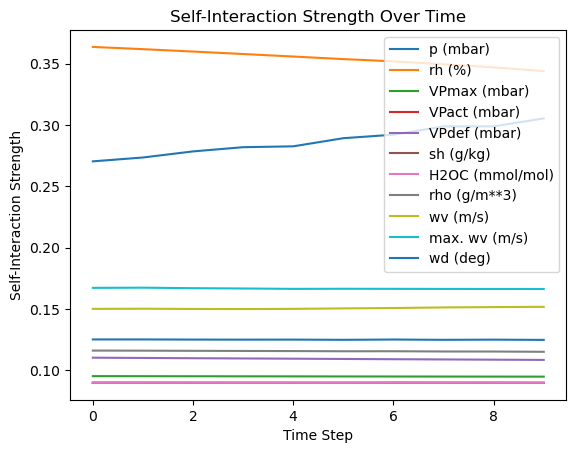

In [285]:
self_interactions = avg_interactions_time[:, torch.arange(avg_interactions_time.size(1)), torch.arange(avg_interactions_time.size(1))]
# or simpler:
self_interactions = avg_interactions_time.diagonal(dim1=1, dim2=2)  # shape: [time, input_dim]

for i, var_name in enumerate(cols_weather_multi):
    plt.plot(self_interactions[:, i].cpu().detach().numpy(), label=var_name)

plt.title("Self-Interaction Strength Over Time")
plt.xlabel("Time Step")
plt.ylabel("Self-Interaction Strength")
plt.legend()
plt.show()


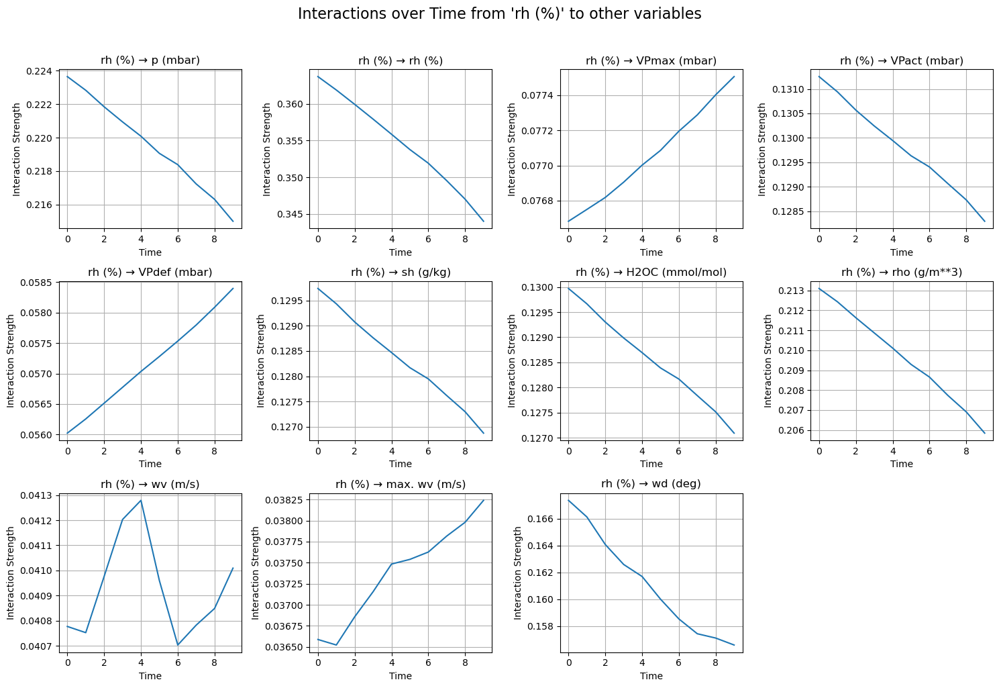

In [289]:
import matplotlib.pyplot as plt
import numpy as np

def plot_interactions_from_variable(interactions_time, from_var_idx, var_names, figsize=(15, 10)):
    """
    Plot interaction weights over time from one variable to all others.

    Args:
        interactions_time: Tensor of shape [time, input_dim, input_dim] - averaged over batch
        from_var_idx: int - index of the variable from which interactions originate
        var_names: list of str - variable names matching input_dim
        figsize: tuple - figure size
    
    """
    time_steps = interactions_time.size(0)
    input_dim = interactions_time.size(1)

    n_cols = 4
    n_rows = int(np.ceil(input_dim / n_cols))

    plt.figure(figsize=figsize)
    
    for to_var_idx in range(input_dim):
        plt.subplot(n_rows, n_cols, to_var_idx + 1)
        y_vals = interactions_time[:, to_var_idx, from_var_idx].cpu().detach().numpy()
        plt.plot(range(time_steps), y_vals)
        plt.title(f"{var_names[from_var_idx]} → {var_names[to_var_idx]}")
        plt.xlabel("Time")
        plt.ylabel("Interaction Strength")
        plt.tight_layout()
        plt.grid(True)

    plt.suptitle(f"Interactions over Time from '{var_names[from_var_idx]}' to other variables", fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

# Usage example:

# avg_interactions_time shape: [time, input_dim, input_dim], e.g. from your interaction_weights.mean(dim=0)
from_var_idx = 1  # e.g. variable 1 (0-based index)
plot_interactions_from_variable(avg_interactions_time, from_var_idx, cols_weather_multi)
